# Set UP


## Importing the BioXTAS API


In [1]:
import bioxtasraw.RAWAPI as raw
import bioxtasraw.RAWPlot as RAWPlot
import bioxtasraw.SASCalc as SASCalc


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import glob
import os

from pptx import Presentation
from pptx.util import Inches
import tempfile

import imageio.v2 as imageio
import math

from scipy import optimize
from scipy import special



colorWT = 'navy'

In [2]:
WT_hdf5='./data/WT_092025.hdf5'



Set Up SAXS Settings (from Brookhaven National Laboratory)

In [3]:
my_settings = raw.load_settings('/Applications/raw/docs/source/saxs/images/figure_data/SAXS.cfg')

/opt/anaconda3/envs/RAW/lib/python3.14/site-packages/bioxtasraw/RAWSettings.py:935: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  settings = pickle_obj.load()


## Load Series from Hdf5 file *For SEC-SAXS 

In [4]:
#Define a list of series filenames to load
series_names = [WT_hdf5]

#Load the series
series = raw.load_series(series_names)
print(series)

In [5]:
my_series = series[0]

frames = my_series.getFrames()
# print(frames)
total_i = my_series.getIntI()
# print(total_i)
mean_i = my_series.getMeanI()


Text(0, 0.5, 'Total I')

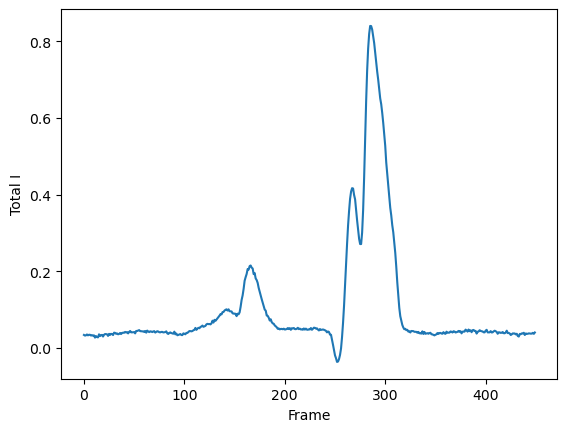

In [6]:
plt.plot(frames, total_i, label='Total I')
plt.xlabel('Frame')
plt.ylabel('Total I')

In [7]:
#Set buffer range
success, region_start, region_end = raw.find_buffer_range(my_series)
print(f"Buffer range found: {success}, start: {region_start}, end: {region_end}")
    
(sub_profiles, rg, rger, i0, i0er, vcmw, vcmwer,
    vpmw) = raw.set_buffer_range(my_series, [[region_start, region_end]])


Buffer range found: True, start: 220, end: 236


/opt/anaconda3/envs/RAW/lib/python3.14/site-packages/bioxtasraw/SASCalc.py:258: RuntimeWarning: invalid value encountered in log10
  iratio = np.abs(np.log10(i0/i) - 2.25)


In [8]:
subtracted_total_i = my_series.getIntI('sub')
subtracted_mean_i = my_series.getMeanI('sub')


Baseline Corrected Series for ./data/WT_092025.hdf5:


Text(0, 0.5, 'Total Intensity')

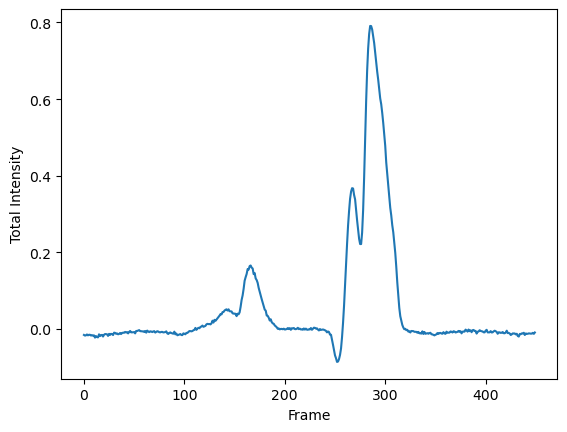

In [9]:
print(f"Baseline Corrected Series for {series_names[0]}:")
plt.plot(frames, subtracted_total_i, label='subtracted Total I')
plt.xlabel('Frame')
plt.ylabel('Total Intensity')

### Finding and setting buffer and sample regions



In [10]:
# #Find an appropriate buffer range for subtraction
success, region_start, region_end = raw.find_buffer_range(my_series)

print(f"Buffer range found: {success}, Start: {region_start}, End: {region_end}")

#Set the buffer range for the series
buffer_range = [[region_start, region_end]]
print(f"Buffer range set to: {buffer_range}")

Buffer range found: True, Start: 220, End: 236
Buffer range set to: [[220, 236]]


In [11]:
(sub_profiles, rg, rger, i0, i0er, vcmw, vcmwer,
    vpmw) = raw.set_buffer_range(my_series, buffer_range)

In [12]:
def to_int_scalar(x, fallback=0):
    if x is None:
        return int(fallback)
    if isinstance(x, (list, tuple, np.ndarray)):
        arr = np.ravel(np.asarray(x))
        if arr.size == 0:
            return int(fallback)
        return int(arr[0])
    try:
        return int(x)
    except Exception:
        return int(fallback)

In [13]:
frames = my_series.getFrames()
total_i = my_series.getIntI()
mean_i = my_series.getMeanI()

subtracted_total_i = my_series.getIntI('sub')
subtracted_mean_i = my_series.getMeanI('sub')


frames.shape: (450,)
total_i.shape: (450,)


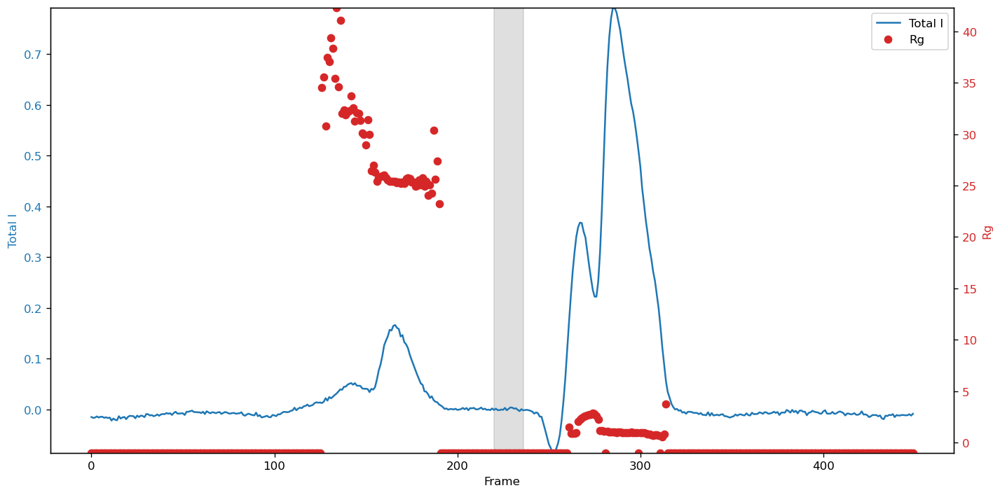

In [14]:
# Plot subtracted_total_i and rg on the same figure with two y-axes, highlighting the buffer region
fig, ax1 = plt.subplots(figsize=(12, 6), dpi=120)

# find background buffer start and end (use defaults if not)
buffer_region_start = to_int_scalar(region_start, 0)
buffer_region_end   = to_int_scalar(region_end, 0)

# lightly translucent rectangle for buffer region (behind the plotted lines)
ax1.axvspan(buffer_region_start, buffer_region_end, color='gray', alpha=0.25, zorder=0)

# Robustly align x (frames) and y (total_i) lengths before plotting
x = frames
y = subtracted_total_i

print("frames.shape:", getattr(x, 'shape', None))
print("total_i.shape:", getattr(y, 'shape', None))

# If total_i is 2D, collapse q axis to produce one scalar per frame
if hasattr(y, 'ndim') and y.ndim == 2:
    # try obvious mappings
    if y.shape[0] == x.shape[0]:
        per_frame = np.sum(y, axis=1)
        x_plot = x
    elif y.shape[1] == x.shape[0]:
        per_frame = np.sum(y, axis=0)
        x_plot = x
    else:
        # fallback: collapse axis 1 and use integer index for x
        per_frame = np.sum(y, axis=1)
        x_plot = np.arange(len(per_frame))
        print("Warning: frames length does not match total_i; plotting per-frame sum vs index.")
else:
    # y is 1D
    if len(y) == len(x):
        per_frame = y
        x_plot = x
    else:
        # fallback: plot y vs its own index
        per_frame = y
        x_plot = np.arange(len(y))
        print("Warning: frames length does not match total_i; plotting total_i vs index.")

c1 = 'tab:blue'
ax1.plot(x_plot, per_frame, color=c1, label='Total I')
ax1.set_xlabel('Frame' if x_plot is frames else 'Index')
ax1.set_ylabel('Total I', color=c1)
ax1.tick_params(axis='y', labelcolor=c1)
# set y limits safely ignoring NaNs
try:
    ymin, ymax = np.nanmin(per_frame), np.nanmax(per_frame)
    if ymin == ymax:
        ymin -= 0.5; ymax += 0.5
    ax1.set_ylim(ymin, ymax)
except ValueError:
    pass

ax2 = ax1.twinx()
c2 = 'tab:red'

# Align rg to x_plot if possible, otherwise plot rg vs its own index
rg_arr = np.asarray(rg)
if rg_arr.shape[0] == x_plot.shape[0]:
    ax2.plot(x_plot, rg_arr, color=c2, marker='o', linestyle='None', label='Rg')
else:
    ax2.plot(np.arange(len(rg_arr)), rg_arr, color=c2, marker='o', linestyle='None', label='Rg')
    print("Warning: rg length does not match x used for Total I; plotting rg vs its own index.")

ax2.set_ylabel('Rg', color=c2)
ax2.tick_params(axis='y', labelcolor=c2)
try:
    ymin2, ymax2 = np.nanmin(rg_arr), np.nanmax(rg_arr)
    if ymin2 == ymax2:
        ymin2 -= 0.5; ymax2 += 0.5
    ax2.set_ylim(ymin2, ymax2)
except ValueError:
    pass

# combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best')

fig.tight_layout()
plt.show()

In [15]:
# Define a region of interest (ROI) for analysis, zero indexed
roi_start = int(155)
roi_end = int(180)

#Get profiles from the series in a given range, zero indexed
profiles_roi = my_series.getSASMList(roi_start, roi_end)
sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')


In [16]:
## Zoom in start frame and end frame for analysis
# Zoom into the ROI
start_frame = 100
end_frame = 250

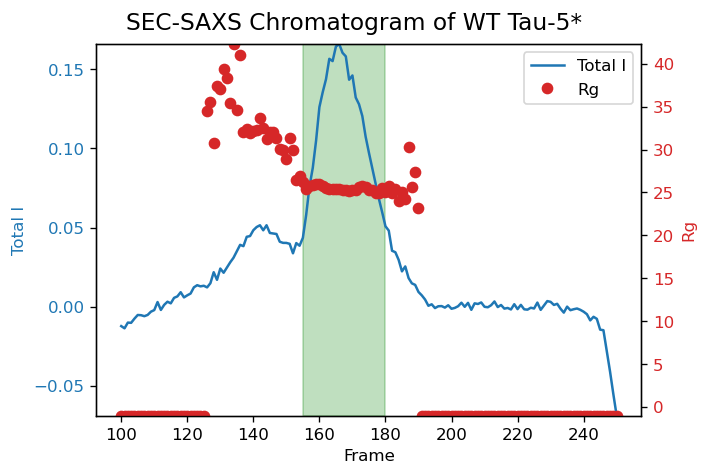

In [17]:
# Plot Total I and Rg with buffer and ROI highlighted, zoomed into the ROI
fig, ax1 = plt.subplots(figsize=(6, 4), dpi=120)

# lightly translucent rectangle for buffer region (behind the plotted lines)
# ax1.axvspan(buffer_region_start, buffer_region_end, color='gray', alpha=0.25, zorder=0)

# lightly translucent rectangle for ROI (behind the plotted lines)
ax1.axvspan(roi_start, roi_end, color='green', alpha=0.25, zorder=0)


# boolean mask to slice arrays
mask = (frames >= start_frame) & (frames <= end_frame)

c1 = 'tab:blue'
ax1.plot(frames[mask], subtracted_total_i[mask], color=c1, label='Total I')
ax1.set_xlabel('Frame')
ax1.set_ylabel('Total I', color=c1)
ax1.tick_params(axis='y', labelcolor=c1)
# set y limits safely ignoring NaNs
try:
    ymin, ymax = np.nanmin(subtracted_total_i[mask]), np.nanmax(subtracted_total_i[mask])
    if ymin == ymax:
        ymin -= 0.5; ymax += 0.5
    ax1.set_ylim(ymin, ymax)
except ValueError:
    pass

ax2 = ax1.twinx()
c2 = 'tab:red'
ax2.plot(frames[mask], rg[mask], color=c2, marker='o', linestyle='None', label='Rg')
ax2.set_ylabel('Rg', color=c2)
ax2.tick_params(axis='y', labelcolor=c2)
try:
    ymin2, ymax2 = np.nanmin(rg[mask]), np.nanmax(rg[mask])
    if ymin2 == ymax2:
        ymin2 -= 0.5; ymax2 += 0.5
    ax2.set_ylim(ymin2, ymax2)
except ValueError:
    pass

# combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best')

fig.tight_layout(rect=[0, 0, 1, 0.95])            # leave top 8% for title
fig.suptitle(f"SEC-SAXS Chromatogram of WT Tau-5*", fontsize=14)
plt.show()

## Analyze Region of Interest, Select and Get Profiles

(LARGE ROI between 155-180)

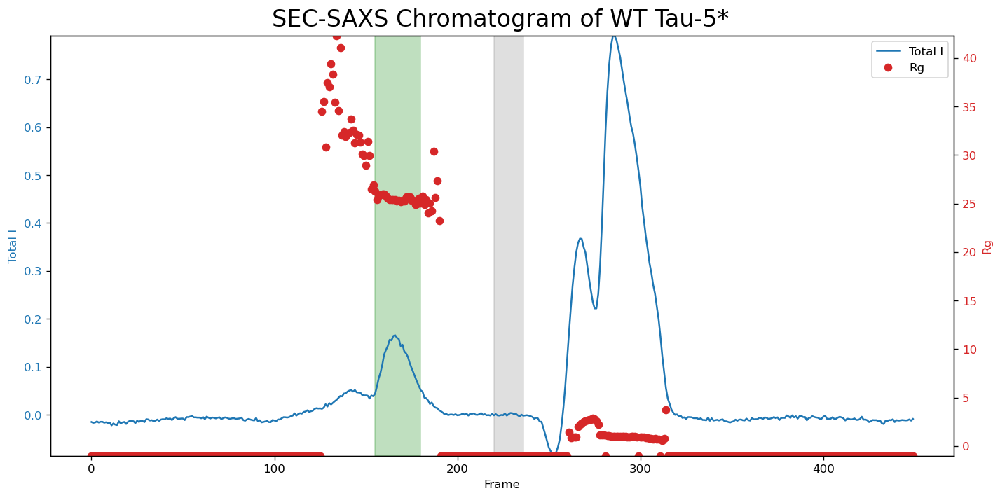

In [18]:
# Plot Total I and Rg with buffer and ROI highlighted
fig, ax1 = plt.subplots(figsize=(12, 6), dpi=120)


# lightly translucent rectangle for buffer region (behind the plotted lines)
ax1.axvspan(buffer_region_start, buffer_region_end, color='gray', alpha=0.25, zorder=0)

# lightly translucent rectangle for ROI (behind the plotted lines)
ax1.axvspan(roi_start, roi_end, color='green', alpha=0.25, zorder=0)

c1 = 'tab:blue'

# robustly handle subtracted_total_i shape before plotting
x = frames
y = subtracted_total_i

# Plot subtracted_total_i 
ax1.plot(x, y, color=c1, label='Total I')
ax1.set_xlabel('Frame')
ax1.set_ylabel('Total I', color=c1)
ax1.tick_params(axis='y', labelcolor=c1)
# set y limits safely ignoring NaNs
try:
    ymin, ymax = np.nanmin(subtracted_total_i), np.nanmax(subtracted_total_i)
    if ymin == ymax:
        ymin -= 0.5; ymax += 0.5
    ax1.set_ylim(ymin, ymax)
except ValueError:
    pass

# Plot rg on the secondary y-axis
ax2 = ax1.twinx()
c2 = 'tab:red'
ax2.plot(frames, rg, color=c2, marker='o', linestyle='None', label='Rg')
ax2.set_ylabel('Rg', color=c2)
ax2.tick_params(axis='y', labelcolor=c2)
try:
    ymin2, ymax2 = np.nanmin(rg), np.nanmax(rg)
    if ymin2 == ymax2:
        ymin2 -= 0.5; ymax2 += 0.5
    ax2.set_ylim(ymin2, ymax2)
except ValueError:
    pass

# combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best')

fig.tight_layout(rect=[0, 0, 1, 0.95])            # leave top 8% for title
fig.suptitle(f"SEC-SAXS Chromatogram of WT Tau-5*", fontsize=20)
plt.show()

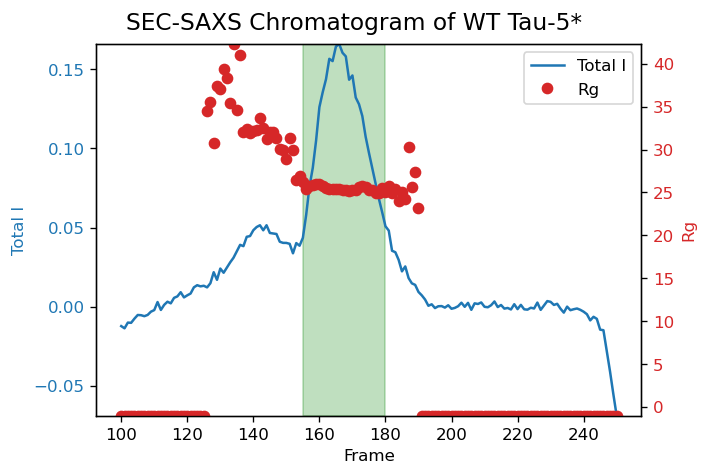

In [19]:
# Plot Total I and Rg with buffer and ROI highlighted, zoomed into the ROI
fig, ax1 = plt.subplots(figsize=(6, 4), dpi=120)

# lightly translucent rectangle for buffer region (behind the plotted lines)
# ax1.axvspan(buffer_region_start, buffer_region_end, color='gray', alpha=0.25, zorder=0)

# lightly translucent rectangle for ROI (behind the plotted lines)
ax1.axvspan(roi_start, roi_end, color='green', alpha=0.25, zorder=0)


# boolean mask to slice arrays
mask = (frames >= start_frame) & (frames <= end_frame)

c1 = 'tab:blue'
ax1.plot(frames[mask], subtracted_total_i[mask], color=c1, label='Total I')
ax1.set_xlabel('Frame')
ax1.set_ylabel('Total I', color=c1)
ax1.tick_params(axis='y', labelcolor=c1)
# set y limits safely ignoring NaNs
try:
    ymin, ymax = np.nanmin(subtracted_total_i[mask]), np.nanmax(subtracted_total_i[mask])
    if ymin == ymax:
        ymin -= 0.5; ymax += 0.5
    ax1.set_ylim(ymin, ymax)
except ValueError:
    pass

ax2 = ax1.twinx()
c2 = 'tab:red'
ax2.plot(frames[mask], rg[mask], color=c2, marker='o', linestyle='None', label='Rg')
ax2.set_ylabel('Rg', color=c2)
ax2.tick_params(axis='y', labelcolor=c2)
try:
    ymin2, ymax2 = np.nanmin(rg[mask]), np.nanmax(rg[mask])
    if ymin2 == ymax2:
        ymin2 -= 0.5; ymax2 += 0.5
    ax2.set_ylim(ymin2, ymax2)
except ValueError:
    pass

# combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best')

fig.tight_layout(rect=[0, 0, 1, 0.95])            # leave top 8% for title
fig.suptitle(f"SEC-SAXS Chromatogram of WT Tau-5*", fontsize=14)
plt.show()

### Evaluate and Analyze All Profiles between 150-180

In [20]:
# Get the first sub-profile from the ROI
sub_profiles_roi[0]

/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/2613774222.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


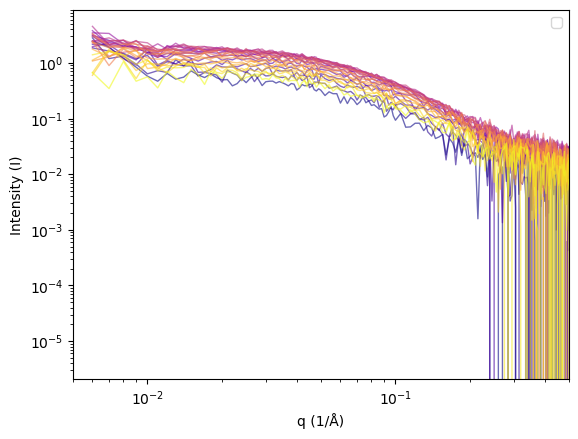

In [21]:
# Plot Sub-profiles
plt.figure()

n = len(sub_profiles_roi)
cmap = plt.cm.plasma  # yellow → purple

for i in range(len(sub_profiles_roi)):
    profile_n = sub_profiles_roi[i]

    q = profile_n.getQ()
    intensity = profile_n.getI()
    error = profile_n.getErr()

    # Normalize index to [0,1] for colormap
    color = cmap(i / (n - 1))

    # Plot individual curves
    plt.plot(q, intensity, color=color, alpha=0.6, linewidth=1)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()


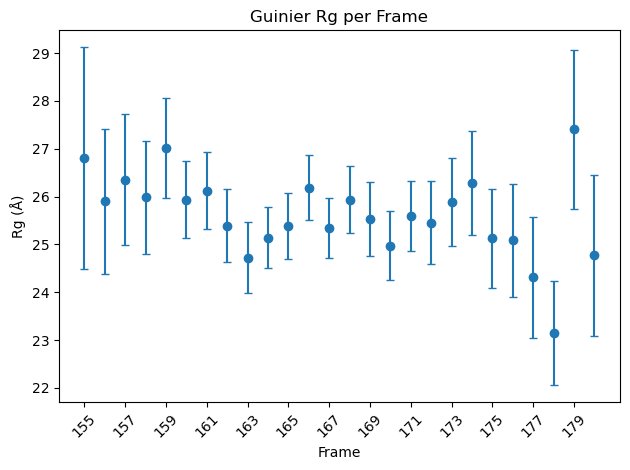

In [22]:
# Plot auto calculated Rg values for each profile in the ROI
# # efficient preallocated collection + nicer x-ticks
n = len(sub_profiles_roi)
rg_values = np.full(n, np.nan, dtype=float)
rg_errors = np.full(n, np.nan, dtype=float)

for j, profile in enumerate(sub_profiles_roi):
    try:
        rg_j, i0_j, rg_err_j, i0_err_j, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max, r_sq = \
            raw.auto_guinier(profile, settings=my_settings)
        rg_values[j] = rg_j
        rg_errors[j] = rg_err_j
    except Exception as e:
        # keep NaN for failed fit, print brief info
        print(f"Guinier failed for ROI frame {j} (global frame {to_int_scalar(roi_start)+j}): {e}")

# map to real frame numbers
roi_start_val = to_int_scalar(roi_start)
frame_numbers = roi_start_val + np.arange(n)

fig, ax = plt.subplots()
rg_errors = np.abs(rg_errors)  # ensure non-negative errors for plotting
ax.errorbar(frame_numbers, rg_values, yerr=rg_errors, fmt='o', capsize=3)
ax.set_xlabel('Frame')
ax.set_ylabel('Rg (Å)')
ax.set_title('Guinier Rg per Frame')

# sensible x-ticks: show all for small ROI, subsample for larger
if n <= 20:
    ticks = frame_numbers
else:
    step = max(1, n // 10)
    ticks = frame_numbers[::step]
ax.set_xticks(ticks)
ax.set_xticklabels(ticks, rotation=45)

fig.tight_layout()
plt.show()
# ...existing code...

[26.80002714 25.89757061 26.35587566 25.98479671 27.01442154 25.93639658
 26.12395569 25.39222084 24.72307847 25.14276125 25.38417138 26.18774234
 25.33968593 25.93312415 25.52641894 24.97335889 25.58905134 25.45246307
 25.88916301 26.28268471 25.12674326 25.08484892 24.30756743 23.14150163
 27.40234279 24.77398537]


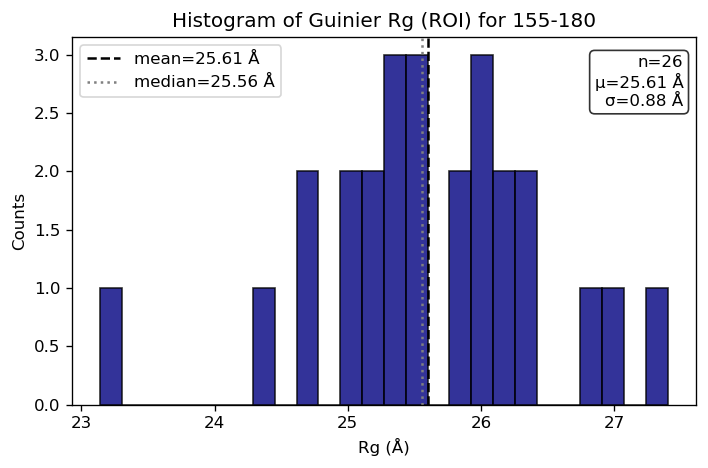

In [23]:
# Plot auto calculated Rg values for each profile in the ROI
# # efficient preallocated collection + nicer x-ticks
n = len(sub_profiles_roi)
rg_values = np.full(n, np.nan, dtype=float)
rg_errors = np.full(n, np.nan, dtype=float)

for j, profile in enumerate(sub_profiles_roi):
    try:
        rg_j, i0_j, rg_err_j, i0_err_j, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max, r_sq = \
            raw.auto_guinier(profile, settings=my_settings)
        rg_values[j] = rg_j
        rg_errors[j] = rg_err_j
    except Exception as e:
        # keep NaN for failed fit, print brief info
        print(f"Guinier failed for ROI frame {j} (global frame {to_int_scalar(roi_start)+j}): {e}")

print(rg_values)

# Plot Rg values in histogram
fig.tight_layout()
plt.show()

# histogram of Rg values (ignore NaNs)
valid = ~np.isnan(rg_values)
if np.count_nonzero(valid) == 0:
    print("No valid Rg values to plot.")
else:
    vals = rg_values[valid]
    mean_rg = np.mean(vals)
    median_rg = np.median(vals)
    std_rg = np.std(vals, ddof=1)

    plt.figure(figsize=(6,4), dpi=120)
    plt.hist(vals, bins=n, color=colorWT, alpha=0.8, edgecolor='k')
    plt.axvline(mean_rg, color='black', linestyle='--', label=f'mean={mean_rg:.2f} Å')
    plt.axvline(median_rg, color='gray', linestyle=':', label=f'median={median_rg:.2f} Å')
    plt.xlabel('Rg (Å)')
    plt.ylabel('Counts')
    plt.title(f"Histogram of Guinier Rg (ROI) for {roi_start}-{roi_end}")
    plt.legend(loc='best')
    plt.gca().text(0.98, 0.95, f'n={len(vals)}\nμ={mean_rg:.2f} Å\nσ={std_rg:.2f} Å',
                   transform=plt.gca().transAxes, ha='right', va='top',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    plt.tight_layout()
    plt.show()
# ...existing code...

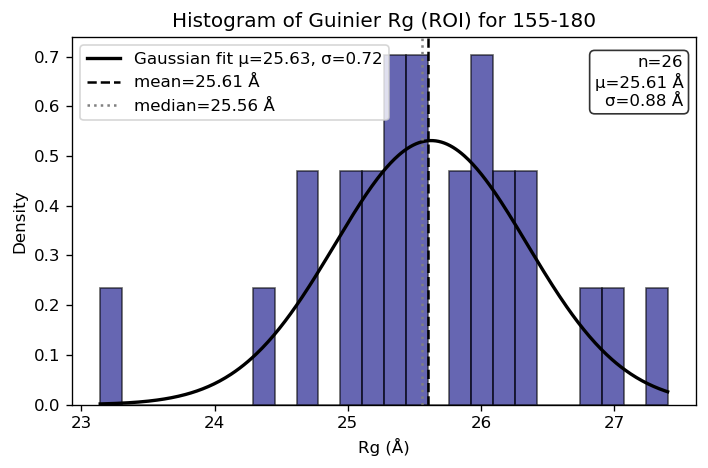

In [24]:
# Plot auto calculated Rg values for each profile in the ROI
# # efficient preallocated collection + nicer x-ticks
n = len(sub_profiles_roi)
rg_values = np.full(n, np.nan, dtype=float)
rg_errors = np.full(n, np.nan, dtype=float)

for j, profile in enumerate(sub_profiles_roi):
    try:
        rg_j, i0_j, rg_err_j, i0_err_j, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max, r_sq = \
            raw.auto_guinier(profile, settings=my_settings)
        rg_values[j] = rg_j
        rg_errors[j] = rg_err_j
    except Exception as e:
        # keep NaN for failed fit, print brief info
        print(f"Guinier failed for ROI frame {j} (global frame {to_int_scalar(roi_start)+j}): {e}")

# Plot Rg values in histogram
fig.tight_layout()
plt.show()

# histogram of Rg values (ignore NaNs)
valid = ~np.isnan(rg_values)
if np.count_nonzero(valid) == 0:
    print("No valid Rg values to plot.")
else:
    vals = rg_values[valid]
    mean_rg = np.mean(vals)
    median_rg = np.median(vals)
    std_rg = np.std(vals, ddof=1)

    # control bin count here
    nbins = n

    plt.figure(figsize=(6,4), dpi=120)
    # plot density histogram so fitted PDF overlays correctly
    counts, bins, patches = plt.hist(vals, bins=nbins, density=True,
                                     color=colorWT, alpha=0.6, edgecolor='k')

    # bin centers for fitting / diagnostics
    bin_centers = (bins[:-1] + bins[1:]) / 2

    # Try to fit a Gaussian with scipy.optimize.curve_fit
    try:
        from scipy.optimize import curve_fit

        def gauss(x, A, mu, sigma):
            return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

        p0 = [1.0, mean_rg, std_rg]
        popt, pcov = curve_fit(gauss, bin_centers, counts, p0=p0)
        x = np.linspace(bins[0], bins[-1], 400)
        plt.plot(x, gauss(x, *popt), color='black', lw=2,
                 label=f'Gaussian fit μ={popt[1]:.2f}, σ={popt[2]:.2f}')
    except Exception:
        # fallback to KDE if curve_fit / scipy not available
        try:
            from scipy.stats import gaussian_kde
            kde = gaussian_kde(vals)
            x = np.linspace(bins[0], bins[-1], 400)
            plt.plot(x, kde(x), color='black', lw=2, label='KDE')
        except Exception:
            # final fallback: plot normal pdf using sample mean/std
            x = np.linspace(bins[0], bins[-1], 400)
            pdf = (1 / (std_rg * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mean_rg) / std_rg) ** 2)
            plt.plot(x, pdf, color='black', lw=2, label=f'Normal μ={mean_rg:.2f}, σ={std_rg:.2f}')

    # annotate vertical lines and text
    plt.axvline(mean_rg, color='black', linestyle='--', label=f'mean={mean_rg:.2f} Å')
    plt.axvline(median_rg, color='gray', linestyle=':', label=f'median={median_rg:.2f} Å')

    plt.xlabel('Rg (Å)')
    plt.ylabel('Density')
    plt.title(f"Histogram of Guinier Rg (ROI) for {roi_start}-{roi_end}")
    plt.legend(loc='best')
    plt.gca().text(0.98, 0.95, f'n={len(vals)}\nμ={mean_rg:.2f} Å\nσ={std_rg:.2f} Å',
                   transform=plt.gca().transAxes, ha='right', va='top',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    plt.tight_layout()
    plt.show()

In [25]:
# # IF YOU WANT TO SAVE THE PROFILES IN THE ROI TO INDIVIDUAL .DAT FILES, UNCOMMENT THE FOLLOWING CODE BLOCK AND SET THE OUTPUT DIRECTORY
# # save profiles in the ROI to individual .dat files
# output_dir = './dat_files/'

# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)

# for i, profile in enumerate(sub_profiles_roi):
#     raw.save_profile(profile, os.path.join(output_dir, f'profile_{roi_start + i}.dat'))


### Moving window of subprofiles

Processing window j=1: frames 167 to 169


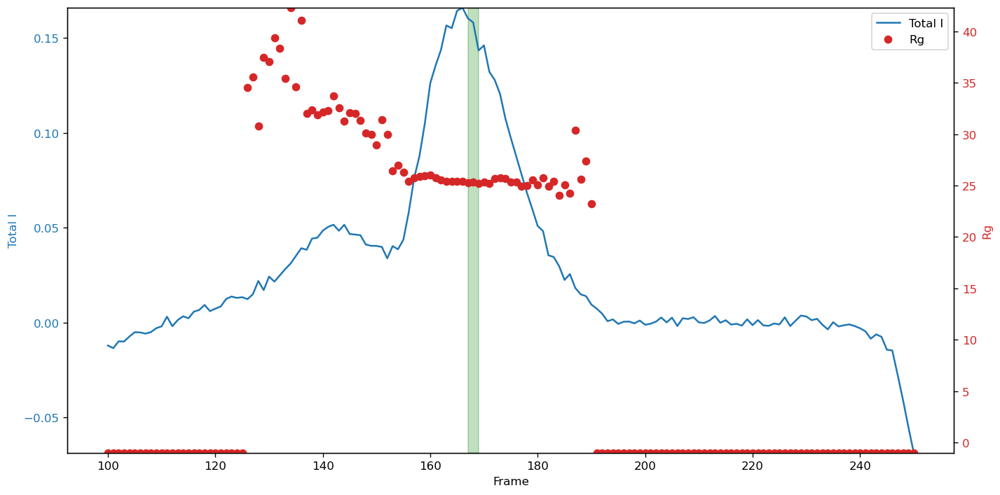

Processing window j=2: frames 166 to 170


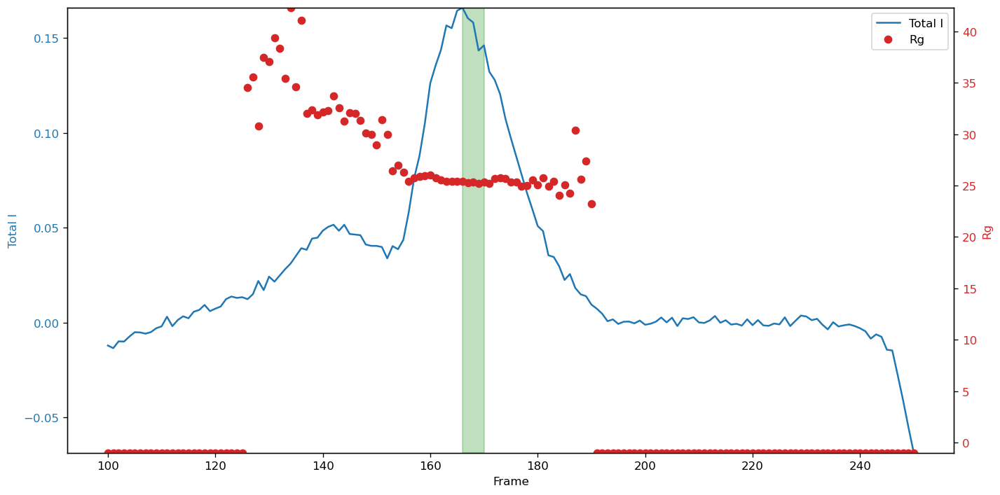

Processing window j=3: frames 165 to 171


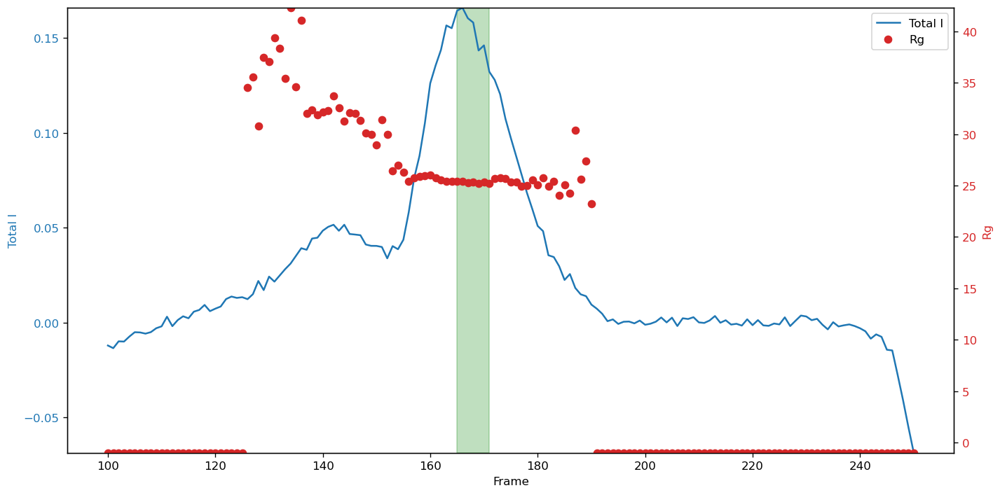

Processing window j=4: frames 164 to 172


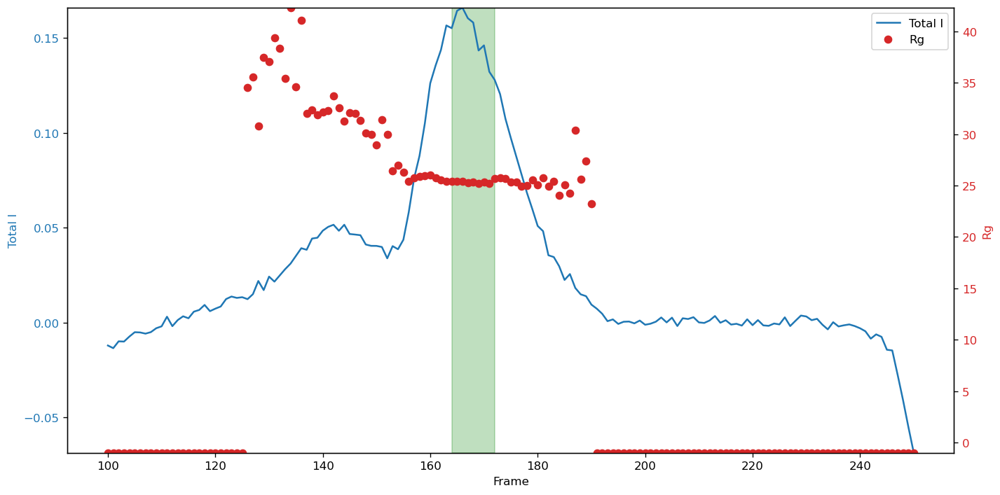

Processing window j=5: frames 163 to 173


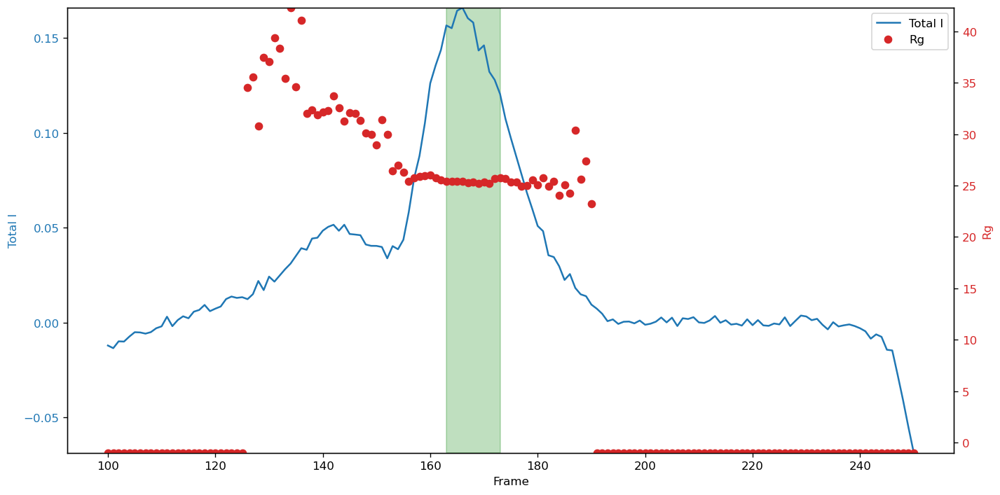

Processing window j=6: frames 162 to 174


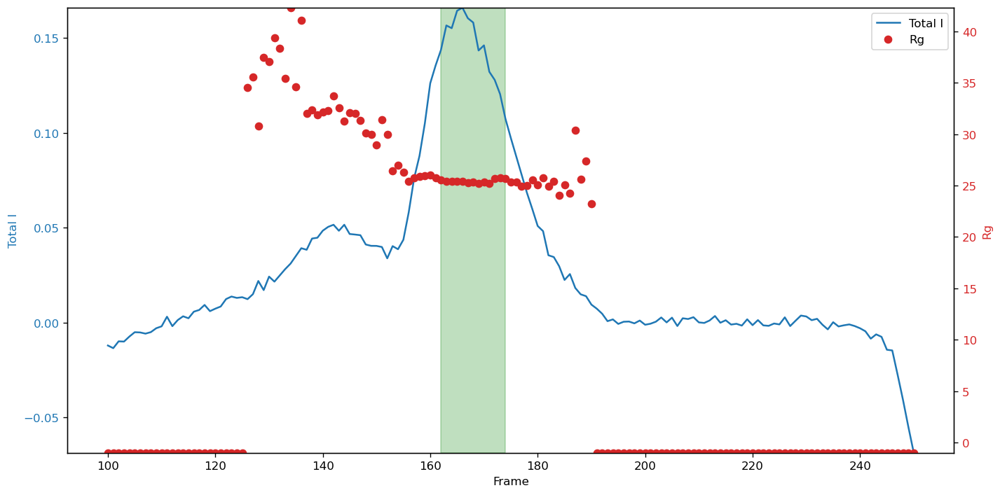

Processing window j=7: frames 161 to 175


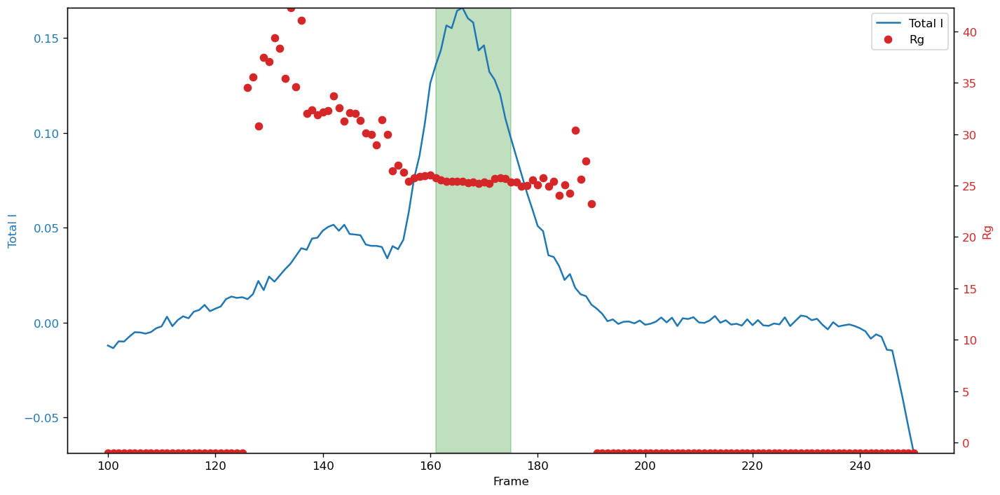

Processing window j=8: frames 160 to 176


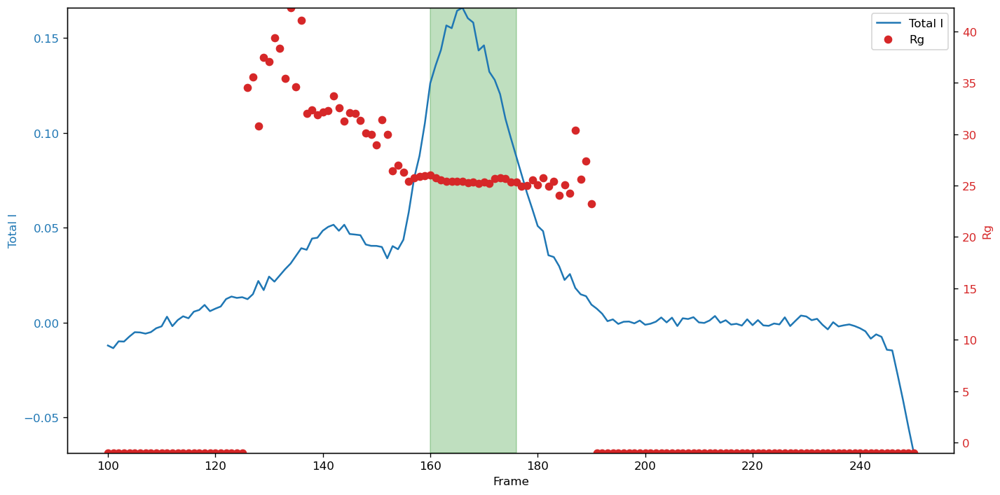

Processing window j=9: frames 159 to 177


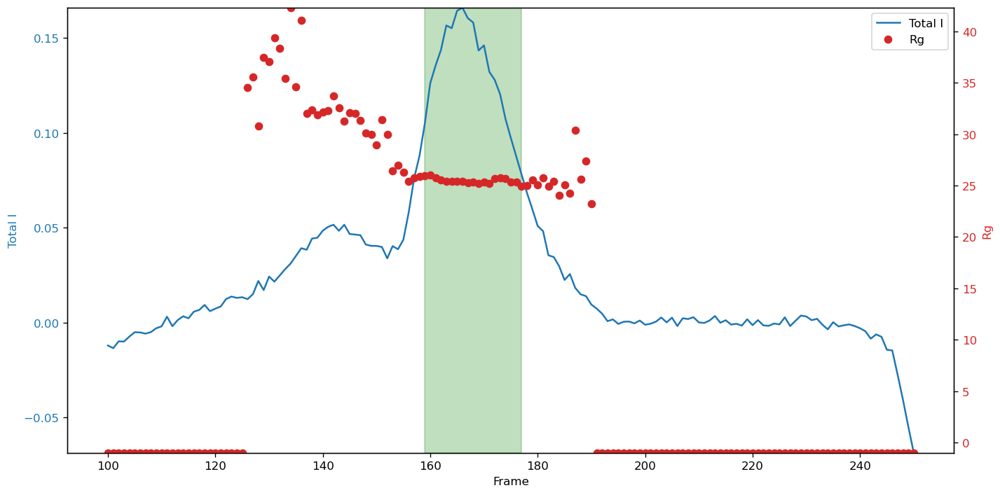

Processing window j=10: frames 158 to 178


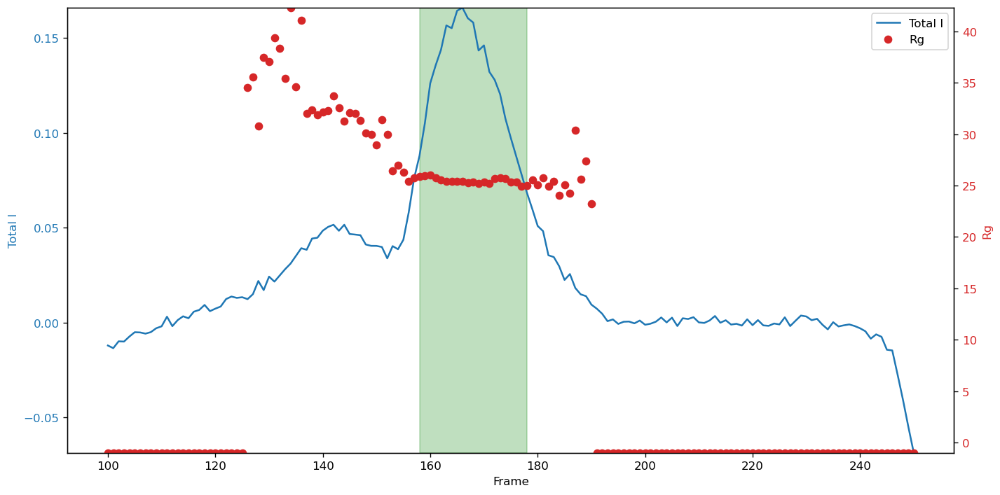

Processing window j=11: frames 157 to 179


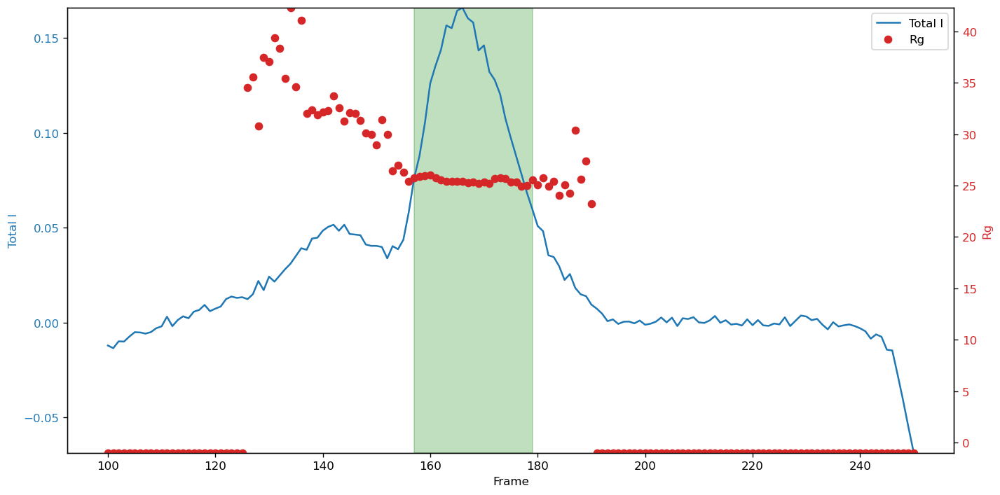

Processing window j=12: frames 156 to 180


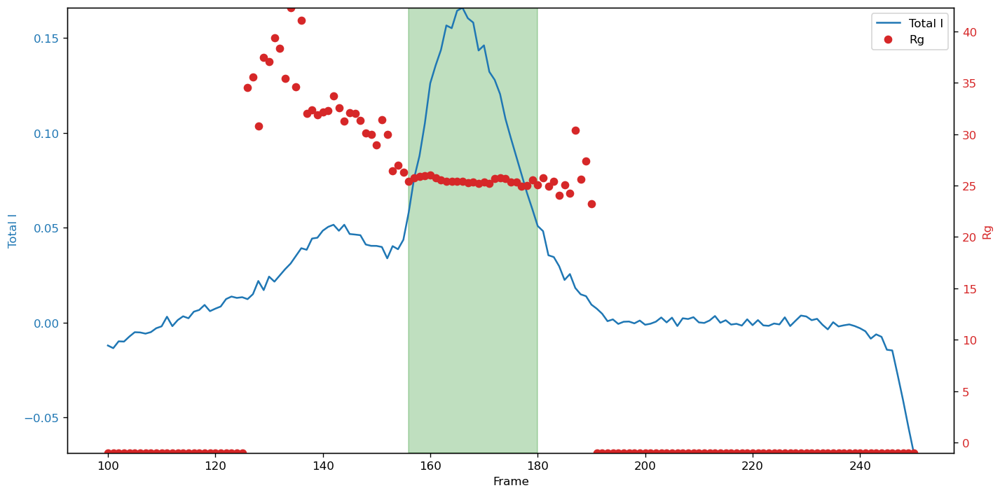

Processing window j=13: frames 155 to 181


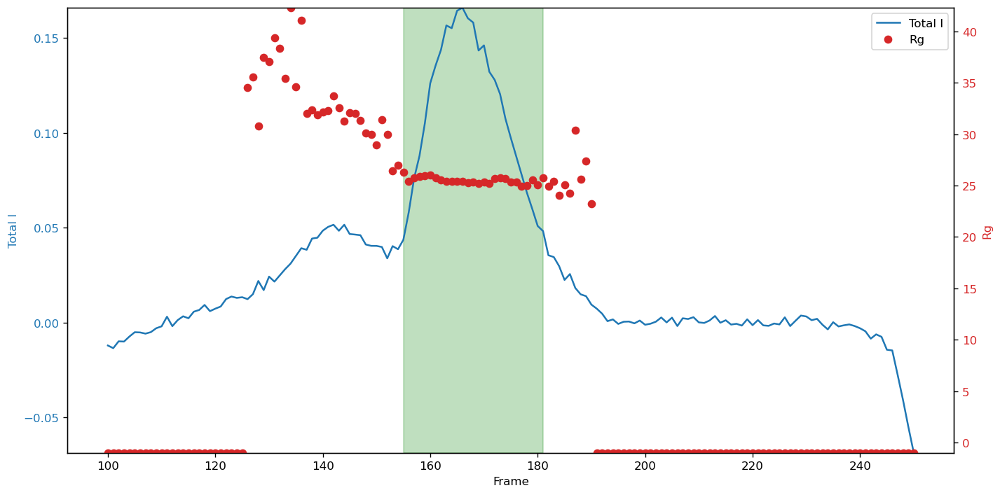

steps: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
rg_values: [25.15114383 25.32754088 25.33016119 25.29086014 25.3794127  25.43465477
 25.48574827 25.47659329 25.46442791 25.50768497 25.56860484 25.4542544
 25.60691168]
rg_errors: [0.37540254 0.29172281 0.24878584 0.22246434 0.22840602 0.19109315
 0.20376018 0.17584403 0.17162437 0.18904099 0.18706302 0.16743536
 0.1868958 ]


In [26]:
centerframe=int(168)

# step-wise j values: 1,3,5,...,13
steps = list(range(1, 14, 1))
m = len(steps)

rg_values = np.full(m, np.nan, dtype=float)
rg_errors = np.full(m, np.nan, dtype=float)
x_labels = []

for k, j in enumerate(steps):
    roi_start = int(centerframe - j)
    roi_end = int(centerframe + j)  # +1 to include centerframe+j in the slice
    print(f"Processing window j={j}: frames {roi_start} to {roi_end}")
    x_labels.append(f"{roi_start}:{roi_end}")

    sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')
    # Plot Total I and Rg with buffer and ROI highlighted, zoomed into the ROI
    fig, ax1 = plt.subplots(figsize=(12, 6), dpi=120)

    # lightly translucent rectangle for ROI (behind the plotted lines)
    ax1.axvspan(roi_start, roi_end, color='green', alpha=0.25, zorder=0)



    # boolean mask to slice arrays
    mask = (frames >= start_frame) & (frames <= end_frame)

    c1 = 'tab:blue'
    ax1.plot(frames[mask], subtracted_total_i[mask], color=c1, label='Total I')
    ax1.set_xlabel('Frame')
    ax1.set_ylabel('Total I', color=c1)
    ax1.tick_params(axis='y', labelcolor=c1)
    # set y limits safely ignoring NaNs
    try:
        ymin, ymax = np.nanmin(subtracted_total_i[mask]), np.nanmax(subtracted_total_i[mask])
        if ymin == ymax:
            ymin -= 0.5; ymax += 0.5
        ax1.set_ylim(ymin, ymax)
    except ValueError:
        pass

    ax2 = ax1.twinx()
    c2 = 'tab:red'
    ax2.plot(frames[mask], rg[mask], color=c2, marker='o', linestyle='None', label='Rg')
    ax2.set_ylabel('Rg', color=c2)
    ax2.tick_params(axis='y', labelcolor=c2)
    try:
        ymin2, ymax2 = np.nanmin(rg[mask]), np.nanmax(rg[mask])
        if ymin2 == ymax2:
            ymin2 -= 0.5; ymax2 += 0.5
        ax2.set_ylim(ymin2, ymax2)
    except ValueError:
        pass

    # combined legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='best')

    fig.tight_layout()
    plt.show()
    average_profile = raw.average(sub_profiles_roi)
    try:
        (rg_j, i0_j, rg_err_j, i0_err_j, qmin, qmax, qrg_min, qrg_max,
         idx_min, idx_max, r_sq) = raw.auto_guinier(average_profile, settings=my_settings)
        rg_values[k] = rg_j
        rg_errors[k] = rg_err_j
    except Exception as e:
        print(f"Error processing window j={j} (slice {roi_start}:{end}): {e}")

print("steps:", steps)
print("rg_values:", rg_values)
print("rg_errors:", rg_errors)
# ...existing code...

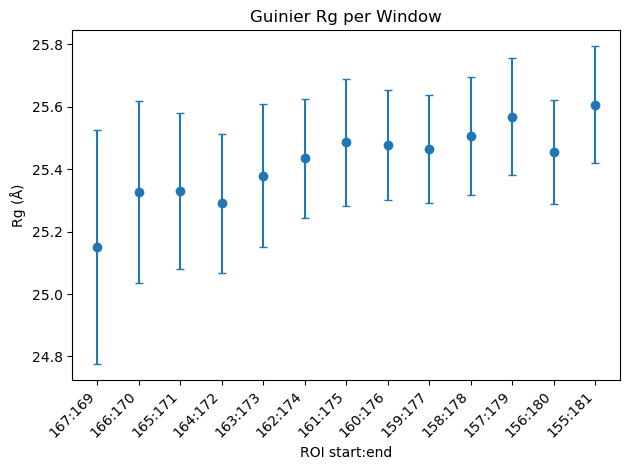

In [27]:
# make numeric x positions and use x_labels for tick labels
x = np.arange(len(x_labels))                     # numeric positions 0..N-1
fig, ax = plt.subplots()
ax.errorbar(x, rg_values, yerr=rg_errors, fmt='o', capsize=3)
ax.set_xlabel('ROI start:end')
ax.set_ylabel('Rg (Å)')
ax.set_title('Guinier Rg per Window')

m = len(x_labels)
# choose which tick positions to show (all for small m, subsample for large)
if m <= 20:
    ticks = x
else:
    step = max(1, m // 10)
    ticks = x[::step]

ax.set_xticks(ticks)
ax.set_xticklabels([x_labels[i] for i in ticks], rotation=45, ha='right')

fig.tight_layout()
plt.show()

In [28]:
# Define a LARGE region of interest (ROI) for analysis with centerframe and step range
range_int =int(30)
centerframe_int= int(155)
step_range_int = int(20)

rg_lower_limit = int(15)
rg_upper_limit = int(40)

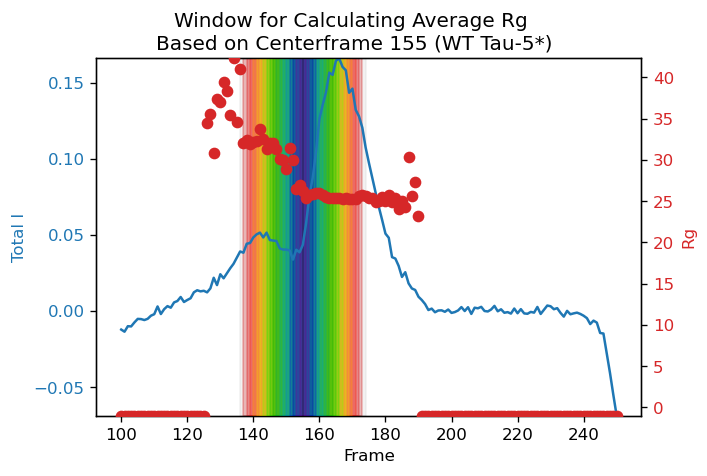

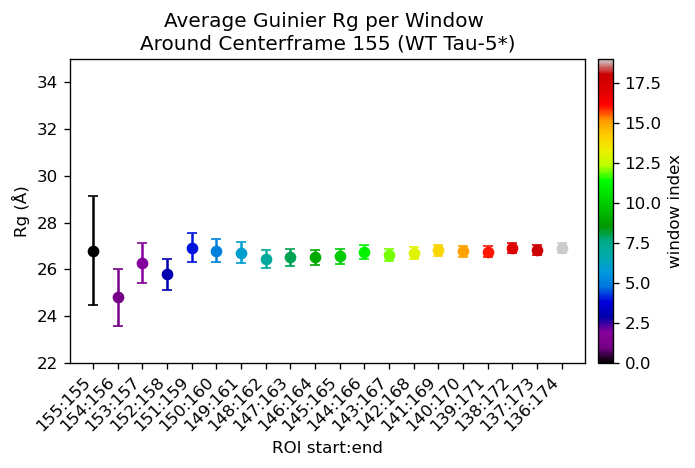

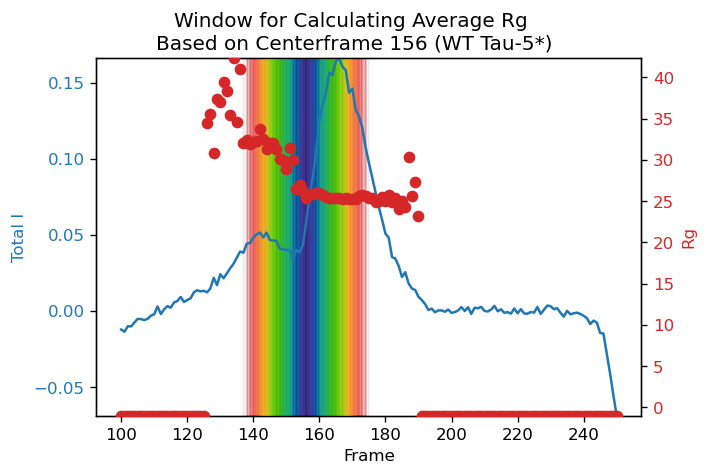

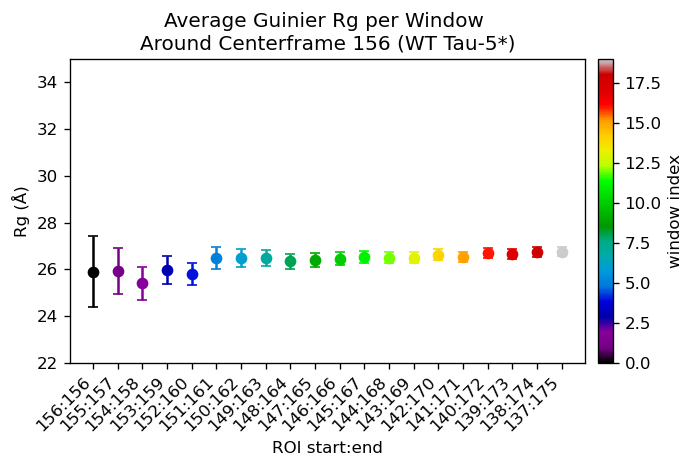

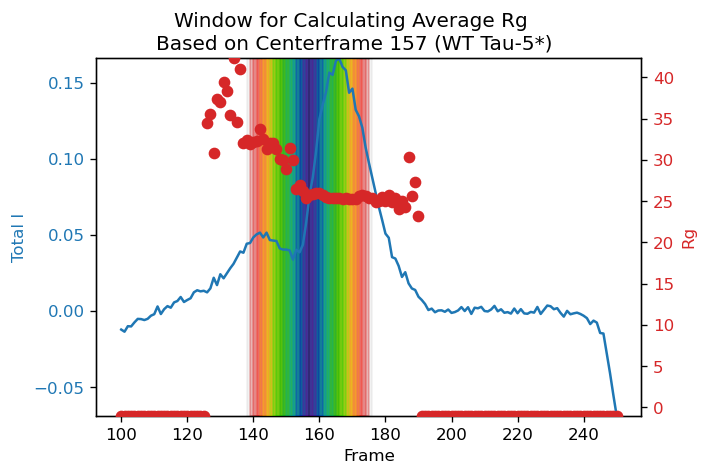

...

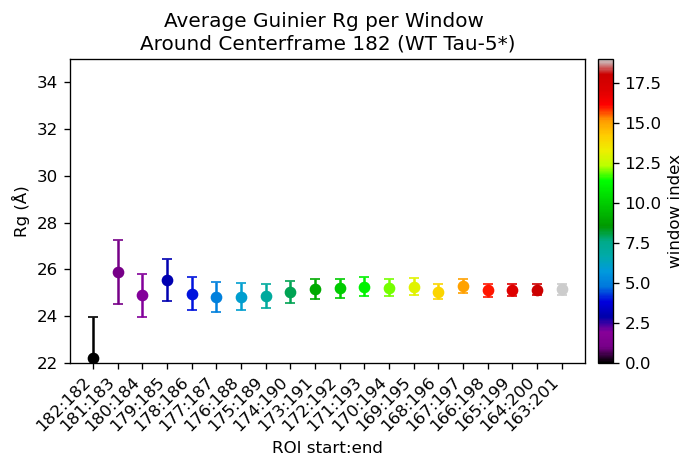

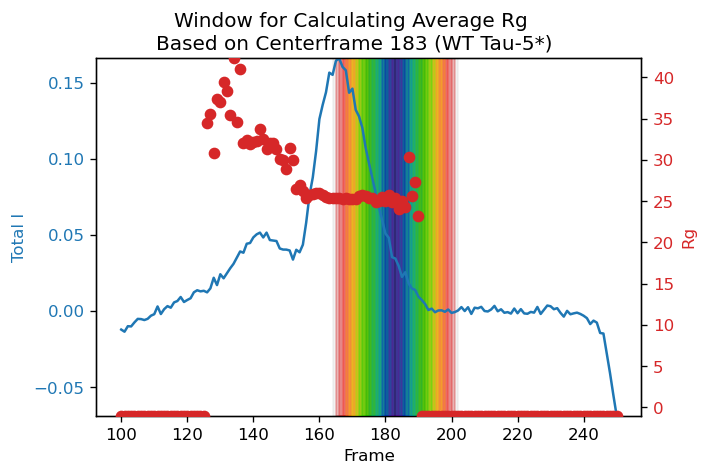

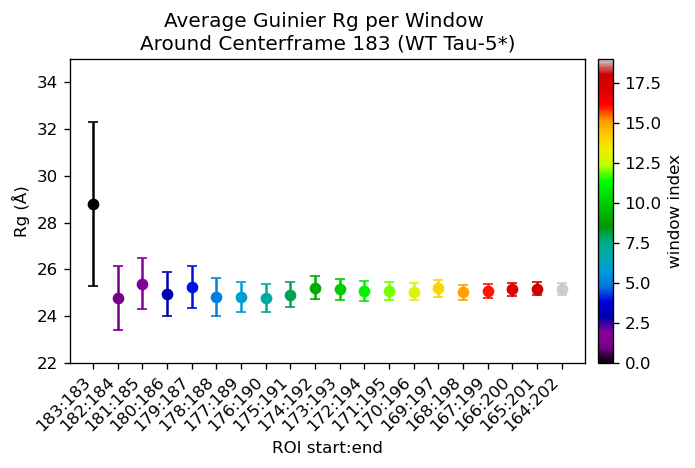

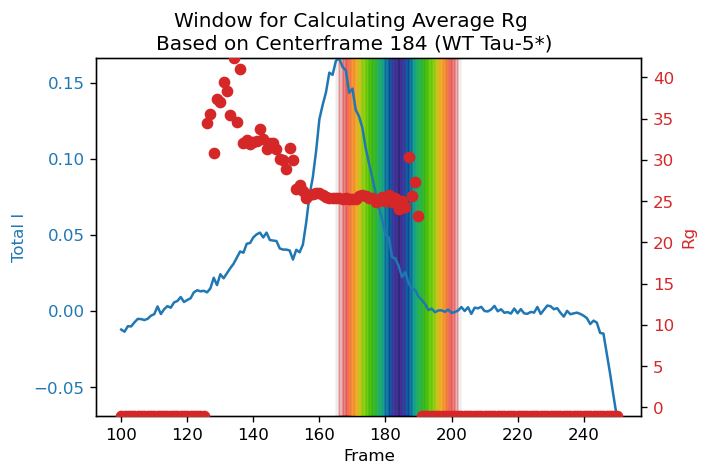

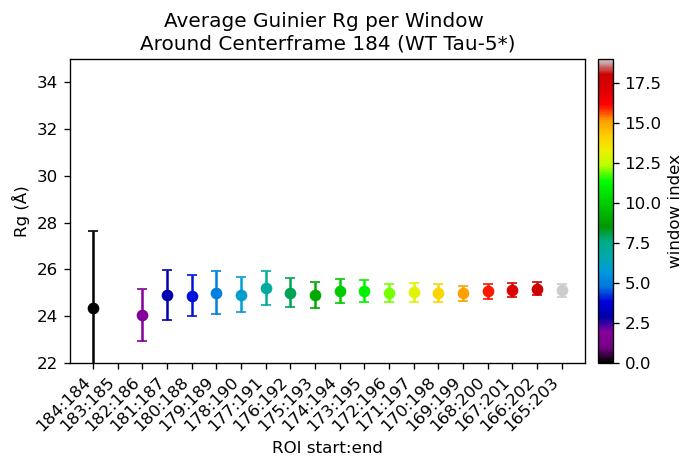

In [29]:
for i in range(range_int):
    centerframe=centerframe_int+i

    # step-wise j values
    steps = list(range(0, step_range_int, 1))
    m = len(steps)

    rg_values = np.full(m, np.nan, dtype=float)
    rg_errors = np.full(m, np.nan, dtype=float)
    x_labels = []

    # prepare colormap and normalizer across indices 0..m-1
    cmap = plt.cm.nipy_spectral
    norm = plt.Normalize(vmin=0, vmax=max(1, m-1))
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # for colorbar

    # Plot background once
    fig, ax1 = plt.subplots(figsize=(6, 4), dpi=120)
    mask = (frames >= start_frame) & (frames <= end_frame)

    ax1.plot(frames[mask], subtracted_total_i[mask], color='tab:blue', label='Total I', zorder=m+3)
    ax1.set_xlabel('Frame')
    ax1.set_ylabel('Total I', color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    try:
        ymin, ymax = np.nanmin(subtracted_total_i[mask]), np.nanmax(subtracted_total_i[mask])
        if ymin == ymax:
            ymin -= 0.5; ymax += 0.5
        ax1.set_ylim(ymin, ymax)
    except ValueError:
        pass

    ax2 = ax1.twinx()
    ax2.plot(frames[mask], rg[mask], color='tab:red', marker='o', linestyle='None', label='Rg', zorder=m+4)
    ax2.set_ylabel('Rg', color='tab:red')
    ax2.tick_params(axis='y', labelcolor='tab:red')
    try:
        ymin2, ymax2 = np.nanmin(rg[mask]), np.nanmax(rg[mask])
        if ymin2 == ymax2:
            ymin2 -= 0.5; ymax2 += 0.5
        ax2.set_ylim(ymin2, ymax2)
    except ValueError:
        pass

    # draw windows using evenly spaced cmap samples; later windows get lower zorder so last window is behind
    for k, j in enumerate(steps):
        roi_start = int(centerframe - j)
        roi_end = int(centerframe + j)
        x_labels.append(f"{roi_start}:{roi_end}")

        sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')

        color = cmap(norm(k))          # uses full cmap range
        span_z = m - k                 # decreasing z-order for later (higher k) windows
        ax1.axvspan(roi_start, roi_end, color=color, alpha=0.25, zorder=span_z)

        average_profile = raw.average(sub_profiles_roi)
        try:
            (rg_j, i0_j, rg_err_j, i0_err_j, qmin, qmax, qrg_min, qrg_max,
            idx_min, idx_max, r_sq) = raw.auto_guinier(average_profile, settings=my_settings)
            rg_values[k] = rg_j
            rg_errors[k] = rg_err_j
        except Exception as e:
            print(f"Error processing window j={j} (slice {roi_start}:{roi_end}): {e}")

    # add a colorbar legend for the windows (index)
    # cbar = fig.colorbar(sm, ax=ax1, pad=0.02, orientation='vertical')
    # cbar.set_label('window index (0 → first, higher → wider windows)')

    # reserve space for a larger suptitle and set its font size
    fig.tight_layout(rect=[0, 0, 1, 0.92])            # leave top 8% for title
    fig.suptitle(f'Window for Calculating Average Rg \nBased on Centerframe {centerframe} (WT Tau-5*)', y=0.98)                 # adjust fontsize and vertical position
    plt.show()

    # print("steps:", steps)
    # print("rg_values:", rg_values)
    # print("rg_errors:", rg_errors)

    # Plot rg values with per-point colors matching the cmap
    x = np.arange(len(x_labels))
    fig, ax = plt.subplots(figsize=(6, 4), dpi=120)
    for ii in range(len(x)):
        col = cmap(norm(ii))
        ax.errorbar(x[ii], rg_values[ii], yerr=rg_errors[ii], fmt='o', color=col, capsize=3)

    ax.set_xlabel('ROI start:end')
    ax.set_ylabel('Rg (Å)')
    ax.set_title('Average Guinier Rg per Window \nAround Centerframe ' + str(centerframe)+' (WT Tau-5*)')

    if m <= 20:
        ticks = x
    else:
        step = max(1, m // 10)
        ticks = x[::step]

    ax.set_xticks(ticks)
    ax.set_xticklabels([x_labels[i] for i in ticks], rotation=45, ha='right')
    ax.set_ylim(bottom=22,top=35)  # Rg cannot be negative, so start y-axis at 0
    # reuse scalar mappable for colorbar on this plot too
    fig.colorbar(sm, ax=ax, pad=0.02).set_label('window index')

    fig.tight_layout()
    plt.show()
#

In [30]:
# Set up output directory and PowerPoint file path
out_dir = 'ppt_results'
os.makedirs(out_dir, exist_ok=True)

prs = Presentation()
# make slide bigger (e.g. 16" x 9")
prs.slide_width = Inches(16)
prs.slide_height = Inches(9)

# margins and gap (adjust to taste)
left_margin = Inches(0.4)
right_margin = Inches(0.4)
gap = Inches(0.2)

# compute available width and split between left/right panels
available = prs.slide_width - left_margin - right_margin - gap
width_left = available * 0.65   # 65% for left panel
width_right = available - width_left

In [31]:
# Make a slide layout
# Make GIF of background frames and rg frames (if needed)

ppt_path = os.path.join(out_dir, 'rg_windows_slides_comp_WT.pptx')

with tempfile.TemporaryDirectory() as tmpdir:
    bg_files = []   # <-- collect bg frames for GIF
    rg_files = []   # <-- collect rg frames for GIF (if needed)

    for i in range(range_int):
        centerframe=centerframe_int+i

        # step-wise j values
        steps = list(range(0, step_range_int, 1))
        m = len(steps)

        rg_values = np.full(m, np.nan, dtype=float)
        rg_errors = np.full(m, np.nan, dtype=float)
        x_labels = []

        # prepare colormap and normalizer across indices 0..m-1
        cmap = plt.cm.nipy_spectral
        norm = plt.Normalize(vmin=0, vmax=max(1, m-1))
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])  # for colorbar
        
        # --- create left panel figure (background + windows) ---
        fig_bg = plt.figure(figsize=(10, 6), dpi=150)
        fig_bg.tight_layout(rect=[0, 0, 1, 0.92])            # leave top 8% for title
        fig_bg.suptitle(f'Window for Calculating Average Rg \nBased on Centerframe {centerframe} (WT Tau-5*)',
                         fontsize=18, y=0.98)      
        gs = fig_bg.add_gridspec(1, 1)
        ax_bg = fig_bg.add_subplot(gs[0, 0])

        mask = (frames >= start_frame) & (frames <= end_frame)
        ax_bg.plot(frames[mask], subtracted_total_i[mask], color='tab:blue', label='Total I', zorder=m + 3)
        ax_bg.set_xlabel('Frame')
        ax_bg.set_ylabel('Total I', color='tab:blue')
        ax_bg.tick_params(axis='y', labelcolor='tab:blue')
        try:
            ymin, ymax = np.nanmin(subtracted_total_i[mask]), np.nanmax(subtracted_total_i[mask])
            if ymin == ymax:
                ymin -= 0.5; ymax += 0.5
            ax_bg.set_ylim(ymin, ymax)
        except ValueError:
            pass

        ax2 = ax_bg.twinx()
        ax2.plot(frames[mask], rg[mask], color='tab:red', marker='o', linestyle='None', label='Rg', zorder=m + 4)
        ax2.set_ylabel('Rg', color='tab:red')
        ax2.tick_params(axis='y', labelcolor='tab:red')

        for k, j in enumerate(steps):
            roi_start = int(centerframe - j)
            roi_end = int(centerframe + j)
            x_labels.append(f"{roi_start}:{roi_end}")

            sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')

            color = cmap(norm(k))
            span_z = m - k
            ax_bg.axvspan(roi_start, roi_end, color=color, alpha=0.25, zorder=span_z)

            average_profile = raw.average(sub_profiles_roi)
            try:
                (rg_j, i0_j, rg_err_j, i0_err_j, qmin, qmax, qrg_min, qrg_max,
                 idx_min, idx_max, r_sq) = raw.auto_guinier(average_profile, settings=my_settings)
                rg_values[k] = rg_j
                rg_errors[k] = rg_err_j
            except Exception as e:
                print(f"Error processing window j={j} (slice {roi_start}:{roi_end}): {e}")

        fname_bg = os.path.join(tmpdir, f'bg_{i:03d}.png')
        fig_bg.tight_layout()
        fig_bg.savefig(fname_bg, bbox_inches='tight', dpi=150)
        plt.close(fig_bg)
        bg_files.append(fname_bg)   # <-- add saved bg image to list


        # --- create right panel figure (rg vs window index) ---
        fig_rg = plt.figure(figsize=(6, 4), dpi=150)
        ax_rg = fig_rg.add_subplot(111)
        x = np.arange(len(x_labels))
        for ii in range(len(x)):
            col = cmap(norm(ii))
            ax_rg.errorbar(x[ii], rg_values[ii], yerr=np.abs(rg_errors[ii]), fmt='o', color=col, capsize=3)

        ax_rg.set_xlabel('ROI start:end')
        ax_rg.set_ylabel('Rg (Å)')
        ax_rg.set_title(f'Average Guinier Rg per Window\nAround Centerframe {centerframe}'+ ' (WT Tau-5*)')
        if len(x_labels) <= 20:
            ticks = x
        else:
            step = max(1, len(x_labels) // 10)
            ticks = x[::step]
        
        ax_rg.set_xticks(ticks)
        ax_rg.set_xticklabels([x_labels[i] for i in ticks], rotation=45, ha='right')
        ax_rg.set_ylim(bottom=rg_lower_limit, top=rg_upper_limit)
        fig_rg.tight_layout()
        fname_rg = os.path.join(tmpdir, f'rg_{i:03d}.png')
        fig_rg.savefig(fname_rg, bbox_inches='tight', dpi=150)
        plt.close(fig_rg)
        rg_files.append(fname_rg)   # <-- add saved rg image to list

        # Histogram figure for Rg values
        fig_hist = plt.figure(figsize=(4, 3), dpi=150)
        valid = ~np.isnan(rg_values)
        if np.count_nonzero(valid) == 0:
            plt.text(0.5, 0.5, "no valid Rg values", ha='center', va='center')
            plt.axis('off')
        else:
            vals = rg_values[valid]
            # choose bins (you can adjust)
            bins = min(12, max(6, len(vals)))
            plt.hist(vals, bins=bins, color=colorWT, alpha=0.8, edgecolor='k')
            mean_rg = np.mean(vals)
            med_rg = np.median(vals)
            plt.axvline(mean_rg, color='k', linestyle='--', label=f'mean={mean_rg:.2f}')
            plt.axvline(med_rg, color='gray', linestyle=':', label=f'median={med_rg:.2f}')
            plt.xlabel('Rg (Å)')
            plt.ylabel('Count')
            plt.legend()
            plt.title(f'Rg Distribution for Centerframe {centerframe}\n(WT Tau-5*)')
            plt.xlim(left=rg_lower_limit, right=rg_upper_limit)  # Rg cannot be negative, so start x-axis at 0
            plt.tight_layout()
        
        fname_hist = os.path.join(tmpdir, f'hist_{i:03d}.png')
        fig_hist.savefig(fname_hist, bbox_inches='tight', dpi=150)
        plt.close(fig_hist)

        #-----------------------------------------#

        # Create slides of saved images (if needed)
        # --- add a slide and place both images at fixed positions ---
        slide = prs.slides.add_slide(prs.slide_layouts[6])  # blank layout
        # left image position and size
        left = Inches(0.4)
        top = Inches(0.7)
        width_left = Inches(8.5)   # adjust to taste
        slide.shapes.add_picture(fname_bg, left, top, width=width_left)

        # right image position and size
        left_r = left + width_left + Inches(0.2)
        top_r = top
        width_right = Inches(6.0)
        # add right picture and place histogram above bottom by using picture height
        pic_rg = slide.shapes.add_picture(fname_rg, left_r, top_r, width=width_right)
        
        # place histogram higher: use a fraction of the right picture height plus a small padding
        hist_top = top_r + pic_rg.height * 0.5 + Inches(2)   # adjust 0.5 and 0.05 as needed
        slide.shapes.add_picture(fname_hist, left_r, hist_top, width=width_right)

        # print(f"Added slide for centerframe {centerframe}")

        #-------------------------#

    # Create GIFs from saved images
    gif_path = os.path.join(out_dir, 'fig_bg_animation_WT.gif')
    try:
        images = [imageio.imread(f) for f in sorted(bg_files)]
        imageio.mimsave(gif_path, images, duration=2)   # adjust duration (seconds/frame)
        print("Saved GIF:", gif_path)
    except Exception as e:
        print("Failed to create GIF:", e)

    gif_path = os.path.join(out_dir, 'fig_rg_animation_WT.gif')
    try:
        images = [imageio.imread(f) for f in sorted(rg_files)]
        imageio.mimsave(gif_path, images, duration=2)   # adjust duration (seconds/frame)
        print("Saved GIF:", gif_path)
    except Exception as e:
        print("Failed to create GIF:", e)

prs.save(ppt_path)
print("Saved PowerPoint:", ppt_path)

Saved GIF: ppt_results/fig_bg_animation_WT.gif
Saved GIF: ppt_results/fig_rg_animation_WT.gif
Saved PowerPoint: ppt_results/rg_windows_slides_comp_WT.pptx


In [32]:
# Make a slide layout
# Make GIF of background frames and rg frames (if needed)

ppt_path = os.path.join(out_dir, 'rg_windows_slides_comp_WT_5frames.pptx')

with tempfile.TemporaryDirectory() as tmpdir:
    bg_files = []   # <-- collect bg frames for GIF
    rg_files = []   # <-- collect rg frames for GIF (if needed)

    for i in range(range_int):
        centerframe=centerframe_int+i

        # step-wise j values
        steps = list(range(0, 5, 1))
        m = len(steps)

        rg_values = np.full(m, np.nan, dtype=float)
        rg_errors = np.full(m, np.nan, dtype=float)
        x_labels = []

        # prepare colormap and normalizer across indices 0..m-1
        cmap = plt.cm.nipy_spectral
        norm = plt.Normalize(vmin=0, vmax=max(1, m-1))
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])  # for colorbar
        
        # --- create left panel figure (background + windows) ---
        fig_bg = plt.figure(figsize=(10, 6), dpi=150)
        fig_bg.tight_layout(rect=[0, 0, 1, 0.92])            # leave top 8% for title
        fig_bg.suptitle(f'Window for Calculating Average Rg \nBased on Centerframe {centerframe} (WT Tau-5*)',
                         fontsize=18, y=0.98)      
        gs = fig_bg.add_gridspec(1, 1)
        ax_bg = fig_bg.add_subplot(gs[0, 0])

        mask = (frames >= start_frame) & (frames <= end_frame)
        ax_bg.plot(frames[mask], subtracted_total_i[mask], color='tab:blue', label='Total I', zorder=m + 3)
        ax_bg.set_xlabel('Frame')
        ax_bg.set_ylabel('Total I', color='tab:blue')
        ax_bg.tick_params(axis='y', labelcolor='tab:blue')
        try:
            ymin, ymax = np.nanmin(subtracted_total_i[mask]), np.nanmax(subtracted_total_i[mask])
            if ymin == ymax:
                ymin -= 0.5; ymax += 0.5
            ax_bg.set_ylim(ymin, ymax)
        except ValueError:
            pass

        ax2 = ax_bg.twinx()
        ax2.plot(frames[mask], rg[mask], color='tab:red', marker='o', linestyle='None', label='Rg', zorder=m + 4)
        ax2.set_ylabel('Rg', color='tab:red')
        ax2.tick_params(axis='y', labelcolor='tab:red')

        for k, j in enumerate(steps):
            roi_start = int(centerframe - j)
            roi_end = int(centerframe + j)
            x_labels.append(f"{roi_start}:{roi_end}")

            sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')

            color = cmap(norm(k))
            span_z = m - k
            ax_bg.axvspan(roi_start, roi_end, color=color, alpha=0.25, zorder=span_z)

            average_profile = raw.average(sub_profiles_roi)
            try:
                (rg_j, i0_j, rg_err_j, i0_err_j, qmin, qmax, qrg_min, qrg_max,
                 idx_min, idx_max, r_sq) = raw.auto_guinier(average_profile, settings=my_settings)
                rg_values[k] = rg_j
                rg_errors[k] = rg_err_j
            except Exception as e:
                print(f"Error processing window j={j} (slice {roi_start}:{roi_end}): {e}")

        fname_bg = os.path.join(tmpdir, f'bg_{i:03d}.png')
        fig_bg.tight_layout()
        fig_bg.savefig(fname_bg, bbox_inches='tight', dpi=150)
        plt.close(fig_bg)
        bg_files.append(fname_bg)   # <-- add saved bg image to list


        # --- create right panel figure (rg vs window index) ---
        fig_rg = plt.figure(figsize=(6, 4), dpi=150)
        ax_rg = fig_rg.add_subplot(111)
        x = np.arange(len(x_labels))
        for ii in range(len(x)):
            col = cmap(norm(ii))
            ax_rg.errorbar(x[ii], rg_values[ii], yerr=np.abs(rg_errors[ii]), fmt='o', color=col, capsize=3)

        ax_rg.set_xlabel('ROI start:end')
        ax_rg.set_ylabel('Rg (Å)')
        ax_rg.set_title(f'Average Guinier Rg per Window\nAround Centerframe {centerframe}'+ ' (WT Tau-5*)')
        if len(x_labels) <= 20:
            ticks = x
        else:
            step = max(1, len(x_labels) // 10)
            ticks = x[::step]
        
        ax_rg.set_xticks(ticks)
        ax_rg.set_xticklabels([x_labels[i] for i in ticks], rotation=45, ha='right')
        ax_rg.set_ylim(bottom=rg_lower_limit, top=rg_upper_limit)
        fig_rg.tight_layout()
        fname_rg = os.path.join(tmpdir, f'rg_{i:03d}.png')
        fig_rg.savefig(fname_rg, bbox_inches='tight', dpi=150)
        plt.close(fig_rg)
        rg_files.append(fname_rg)   # <-- add saved rg image to list

        # Histogram figure for Rg values
        fig_hist = plt.figure(figsize=(4, 3), dpi=150)
        valid = ~np.isnan(rg_values)
        if np.count_nonzero(valid) == 0:
            plt.text(0.5, 0.5, "no valid Rg values", ha='center', va='center')
            plt.axis('off')
        else:
            vals = rg_values[valid]
            # choose bins (you can adjust)
            bins = min(12, max(6, len(vals)))
            plt.hist(vals, bins=bins, color=colorWT, alpha=0.8, edgecolor='k')
            mean_rg = np.mean(vals)
            med_rg = np.median(vals)
            plt.axvline(mean_rg, color='k', linestyle='--', label=f'mean={mean_rg:.2f}')
            plt.axvline(med_rg, color='gray', linestyle=':', label=f'median={med_rg:.2f}')
            plt.xlabel('Rg (Å)')
            plt.ylabel('Count')
            plt.legend()
            plt.title(f'Rg Distribution for Centerframe {centerframe}\n(WT Tau-5*)')
            plt.xlim(left=rg_lower_limit, right=rg_upper_limit)  # Rg cannot be negative, so start x-axis at 0
            plt.tight_layout()
        
        fname_hist = os.path.join(tmpdir, f'hist_{i:03d}.png')
        fig_hist.savefig(fname_hist, bbox_inches='tight', dpi=150)
        plt.close(fig_hist)

        #-----------------------------------------#

        # Create slides of saved images (if needed)
        # --- add a slide and place both images at fixed positions ---
        slide = prs.slides.add_slide(prs.slide_layouts[6])  # blank layout
        # left image position and size
        left = Inches(0.4)
        top = Inches(0.7)
        width_left = Inches(8.5)   # adjust to taste
        slide.shapes.add_picture(fname_bg, left, top, width=width_left)

        # right image position and size
        left_r = left + width_left + Inches(0.2)
        top_r = top
        width_right = Inches(6.0)
        # add right picture and place histogram above bottom by using picture height
        pic_rg = slide.shapes.add_picture(fname_rg, left_r, top_r, width=width_right)
        
        # place histogram higher: use a fraction of the right picture height plus a small padding
        hist_top = top_r + pic_rg.height * 0.5 + Inches(2)   # adjust 0.5 and 0.05 as needed
        slide.shapes.add_picture(fname_hist, left_r, hist_top, width=width_right)

        # print(f"Added slide for centerframe {centerframe}")

        #-------------------------#

    # Create GIFs from saved images
    gif_path = os.path.join(out_dir, 'fig_bg_animation_WT.gif')
    try:
        images = [imageio.imread(f) for f in sorted(bg_files)]
        imageio.mimsave(gif_path, images, duration=2)   # adjust duration (seconds/frame)
        print("Saved GIF:", gif_path)
    except Exception as e:
        print("Failed to create GIF:", e)

    gif_path = os.path.join(out_dir, 'fig_rg_animation_WT.gif')
    try:
        images = [imageio.imread(f) for f in sorted(rg_files)]
        imageio.mimsave(gif_path, images, duration=2)   # adjust duration (seconds/frame)
        print("Saved GIF:", gif_path)
    except Exception as e:
        print("Failed to create GIF:", e)

prs.save(ppt_path)
print("Saved PowerPoint:", ppt_path)

Saved GIF: ppt_results/fig_bg_animation_WT.gif
Saved GIF: ppt_results/fig_rg_animation_WT.gif
Saved PowerPoint: ppt_results/rg_windows_slides_comp_WT_5frames.pptx


### Average Profiles 

In [33]:
# Define a region of interest (ROI) for analysis, zero indexed
roi_start = int(162)
roi_end = int(173)

#Get profiles from the series in a given range, zero indexed
profiles_roi = my_series.getSASMList(roi_start, roi_end)
sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')


In [34]:
average_profile = raw.average(sub_profiles_roi[:])
average_profile

In [35]:
# AverageProfile 
q_avg=average_profile.getQ()
intensity_avg=average_profile.getI()
error_avg=average_profile.getErr()

Text(0, 0.5, 'Intensity (I)')

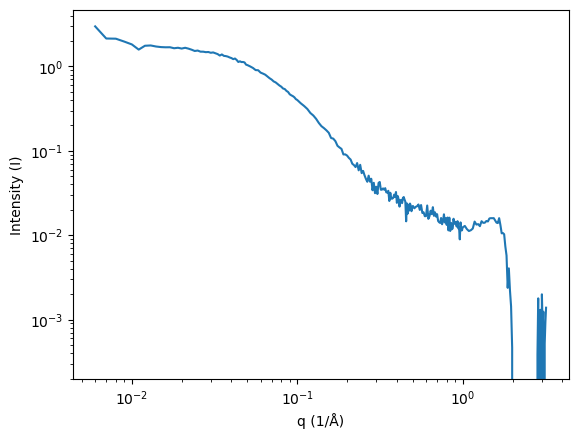

In [36]:
# Average curve
plt.Figure(figsize=(8,6), dpi=120)
plt.plot(q_avg, intensity_avg, linestyle='-', marker=None)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')


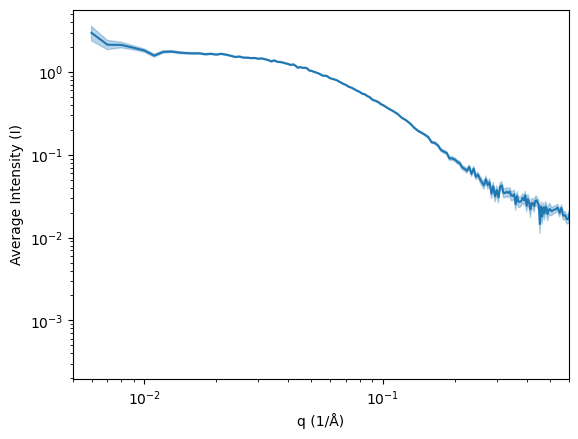

In [37]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q_avg, intensity_avg, label='Intensity (normalized)')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Average Intensity (I)')
plt.fill_between(
    q_avg,
    intensity_avg - error_avg,
    intensity_avg + error_avg,
    alpha=0.3,
    color=line.get_color()
)
plt.xlim(0.005, 0.6)
plt.show()
 

#### Analyze Average of ROI

In [38]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(average_profile, settings=my_settings)

print(f"Guinier fit results for {average_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x31ef22850>
i0: 1.774e+00 ± 8.890e-03
Rg: 2.534e+01 ± 1.957e-01
Guinier fit R²: 0.8109
Guinier range: q = 6.000e-03 to 5.200e-02
Guinier range used Rg: q = 1.520e-01 to 1.318e+00
idx_min: 0, idx_max: 45


In [39]:
# AverageProfile 
q=average_profile.getQ()
intensity = average_profile.getI()
error = average_profile.getErr()

/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/1379622750.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


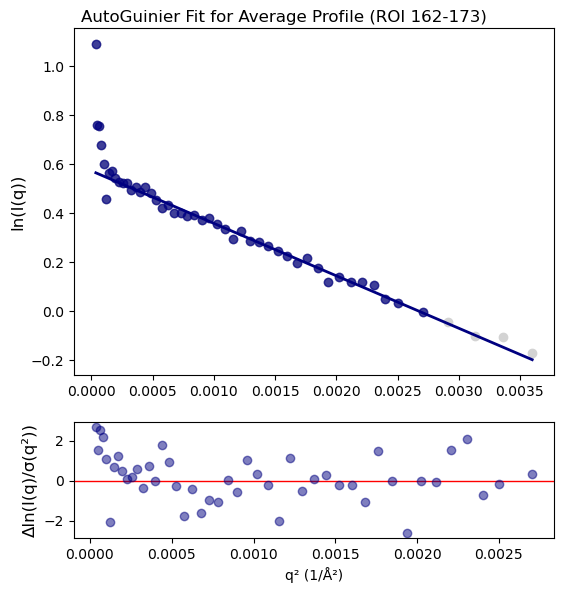

In [40]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()


Fit with idx_min=0, idx_max=45: Rg=2.534e+01 ± 1.957e-01, R²=0.8109
Fit with idx_min=1, idx_max=45: Rg=2.533e+01 ± 1.958e-01, R²=0.9268
Fit with idx_min=2, idx_max=45: Rg=2.532e+01 ± 1.960e-01, R²=0.9467
Fit with idx_min=3, idx_max=45: Rg=2.529e+01 ± 1.965e-01, R²=0.9713
Fit with idx_min=4, idx_max=45: Rg=2.526e+01 ± 1.973e-01, R²=0.9818
Fit with idx_min=5, idx_max=45: Rg=2.524e+01 ± 1.983e-01, R²=0.9831
Fit with idx_min=6, idx_max=45: Rg=2.528e+01 ± 1.989e-01, R²=0.9900
Fit with idx_min=7, idx_max=45: Rg=2.526e+01 ± 2.005e-01, R²=0.9899
Fit with idx_min=8, idx_max=45: Rg=2.522e+01 ± 2.028e-01, R²=0.9907
Fit with idx_min=9, idx_max=45: Rg=2.521e+01 ± 2.052e-01, R²=0.9904
Fit with idx_min=10, idx_max=45: Rg=2.520e+01 ± 2.080e-01, R²=0.9898
Fit with idx_min=11, idx_max=45: Rg=2.519e+01 ± 2.113e-01, R²=0.9893
Fit with idx_min=12, idx_max=45: Rg=2.515e+01 ± 2.154e-01, R²=0.9889
Fit with idx_min=13, idx_max=45: Rg=2.516e+01 ± 2.197e-01, R²=0.9882
Fit with idx_min=14, idx_max=45: Rg=2.511e+0

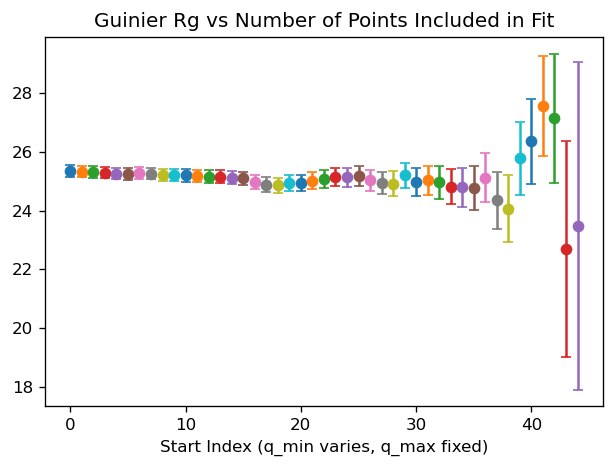

In [41]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


Fit with idx_min=0, idx_max=55: Rg=2.407e+01 ± 2.635e-01, R²=0.9101
Fit with idx_min=1, idx_max=55: Rg=2.407e+01 ± 2.629e-01, R²=0.9642
Fit with idx_min=2, idx_max=55: Rg=2.406e+01 ± 2.624e-01, R²=0.9739
Fit with idx_min=3, idx_max=55: Rg=2.405e+01 ± 2.619e-01, R²=0.9845
Fit with idx_min=4, idx_max=55: Rg=2.404e+01 ± 2.618e-01, R²=0.9893
Fit with idx_min=5, idx_max=55: Rg=2.403e+01 ± 2.623e-01, R²=0.9904
Fit with idx_min=6, idx_max=55: Rg=2.404e+01 ± 2.633e-01, R²=0.9914
Fit with idx_min=7, idx_max=55: Rg=2.403e+01 ± 2.032e-01, R²=0.9917
Fit with idx_min=8, idx_max=55: Rg=2.401e+01 ± 2.032e-01, R²=0.9923
Fit with idx_min=9, idx_max=55: Rg=2.399e+01 ± 2.037e-01, R²=0.9924
Fit with idx_min=10, idx_max=55: Rg=2.398e+01 ± 2.047e-01, R²=0.9924
Fit with idx_min=11, idx_max=55: Rg=2.397e+01 ± 2.055e-01, R²=0.9923
Fit with idx_min=12, idx_max=55: Rg=2.394e+01 ± 2.077e-01, R²=0.9924
Fit with idx_min=13, idx_max=55: Rg=2.393e+01 ± 2.107e-01, R²=0.9922
Fit with idx_min=14, idx_max=55: Rg=2.390e+0

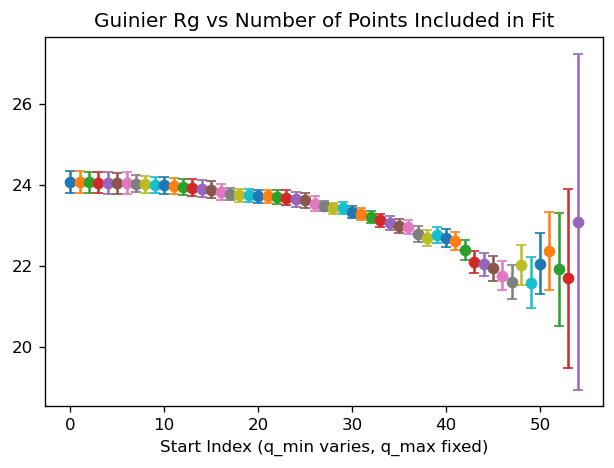

In [42]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(average_profile, settings=my_settings)

n_points = idx_max+10 # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')

    



In [43]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 1
idx_max = 45

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 1.773e+00 ± 8.890e-03
Rg: 2.533e+01 ± 1.958e-01
Guinier fit R²: 0.9268
Guinier range: q = 7.000e-03 to 5.200e-02
Guinier range used Rg: q = 1.773e-01 to 1.317e+00
idx_min: 1, idx_max: 45


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/790654339.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


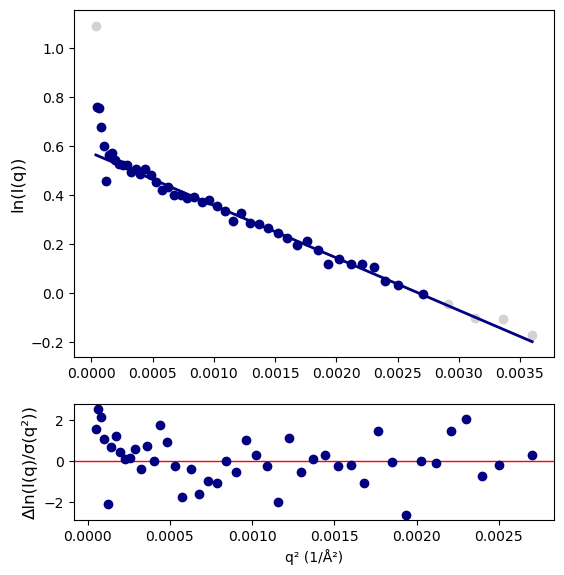

In [44]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
# plt.ylabel('ln(I)')
plt.show()

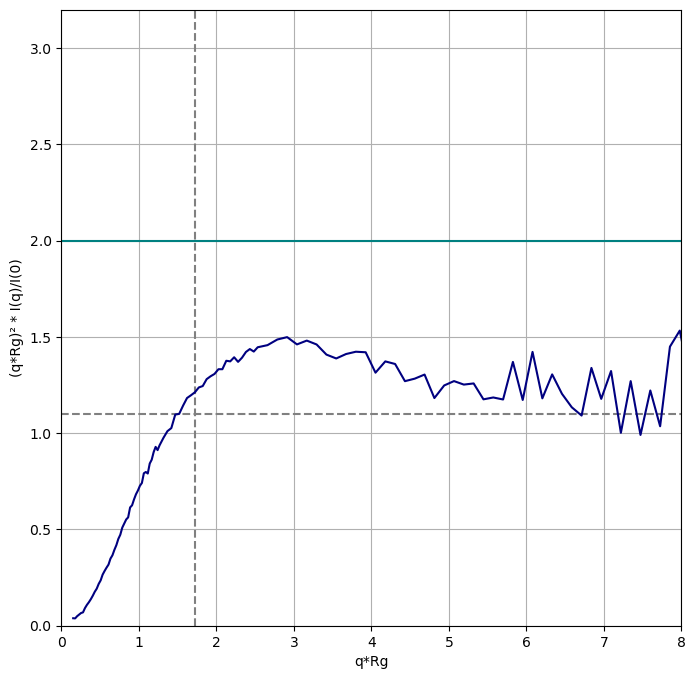

In [45]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(8,8))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')

/opt/anaconda3/envs/RAW/lib/python3.14/site-packages/bioxtasraw/BIFT.py:334: RuntimeWarning: invalid value encountered in divide
  sinc_qr = np.where(qr==0, 1, np.sin(qr)/qr)


Auto-determined Dmax: 91.00 Å
GNOM fit results for Dmax=91 Å:
Dmax: 91.00 Å
Rg: 2.716e+01 ± 2.659e-01 Å
i0: 1.805e+00


Text(0, 0.5, 'P(Rg) / I0')

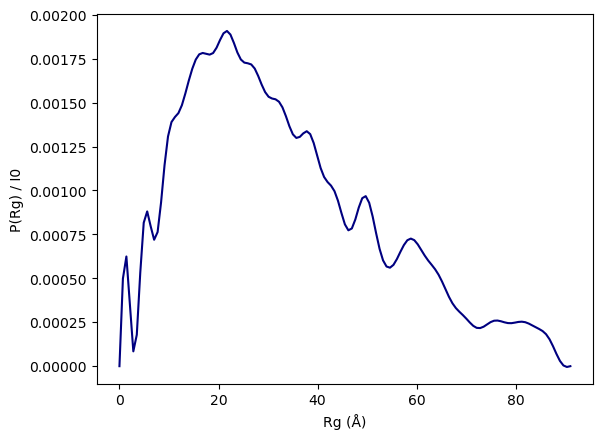

In [46]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(average_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

GNOM fit results for Dmax=120.0 Å:
Dmax: 120.00 Å
Rg: 2.680e+01 ± 8.436e-01 Å
i0: 1.797e+00


Text(0, 0.5, 'P(Rg) / I0')

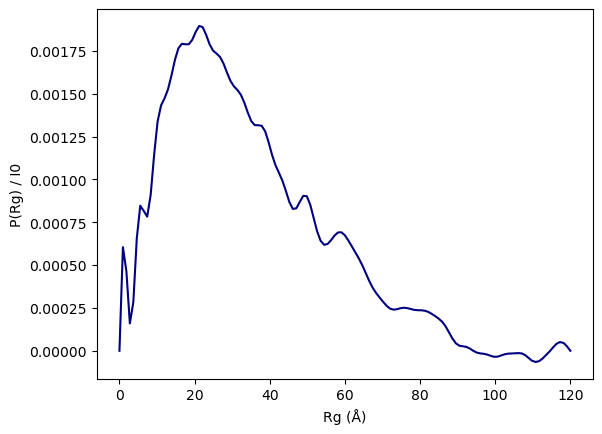

In [47]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 120.0  # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

#### Calculate Extended Guinier

In [48]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=1
qmin_offset=2
qmax_offset=40

In [49]:
class ExtendedGuinier:
    """
    Extended Guinier analysis for SAXS data.

    Parameters
    ----------
    q : array-like
        q values (Å⁻¹)
    intensity : array-like
        Scattering intensity I(q)
    error : array-like, optional
        Experimental uncertainty. Stored for convenience but not used in fitting.
    """

    def __init__(self, q, intensity, error=None):

        self.q = np.asarray(q, dtype=float)
        self.Iq = np.asarray(intensity, dtype=float)

        if error is None:
            self.error = np.ones_like(self.Iq)
        else:
            self.error = np.asarray(error, dtype=float)

    @staticmethod
    def Rg_nu(b, N, nu):
        g = 1.1615
        return np.sqrt(
            g * (g + 1)
            / (2 * (g + 2 * nu) * (g + 2 * nu + 1))
        ) * b * N**nu

    @staticmethod
    def chisq_extguin(parms, q, log_Iq, Nres, b):

        nu = parms[0]
        log_I0 = parms[1]

        Rg = ExtendedGuinier.Rg_nu(b, Nres, nu)

        log_Iq_fit = (
            log_I0
            - q**2 * Rg**2 / 3
            + 0.0479 * (nu - 0.212) * q**4 * Rg**4
        )

        dI = log_Iq_fit - log_Iq

        return np.dot(dI, dI)

    def analyze(
        self,
        Nres,
        b_Angstrom=5.5,
        nu_init=0.5,
        qcut=None,
        q_start_index=0,
    ):

        q = self.q
        Iq = self.Iq

        valid = np.isfinite(q) & np.isfinite(Iq) & (Iq > 0)

        q = q[valid]
        Iq = Iq[valid]

        if len(q) == 0:
            return None

        if qcut is None:
            Rg_init = self.Rg_nu(b_Angstrom, Nres, 0.6)
            qcut = 2.0 / Rg_init

        mask = (q >= q[q_start_index]) & (q <= qcut)

        qrange = q[mask]
        log_Iq = np.log(Iq[mask])

        if len(qrange) < 3:
            raise ValueError("Not enough points in Guinier region.")

        log_I0_init = log_Iq[0]

        opt_parm = optimize.fmin(
            self.chisq_extguin,
            [nu_init, log_I0_init],
            args=(qrange, log_Iq, Nres, b_Angstrom),
            disp=False,
        )

        nu_final, log_I0_final = opt_parm

        Rg_final = self.Rg_nu(
            b_Angstrom,
            Nres,
            nu_final,
        )

        log_Iq_fit = (
            log_I0_final
            - qrange**2 * Rg_final**2 / 3
            + 0.0479
            * (nu_final - 0.212)
            * qrange**4
            * Rg_final**4
        )

        return {
            "nu": nu_final,
            "Rg": Rg_final,
            "I0": np.exp(log_I0_final),
            "log_I0": log_I0_final,
            "q": qrange,
            "q_squared": qrange**2,
            "log_Iq": log_Iq,
            "log_Iq_fit": log_Iq_fit,
            "residuals": log_Iq_fit - log_Iq,
        }

In [50]:
eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=1)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]



27.715510381823865
0.5165563523565649
1.8453660772673655


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/121237510.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


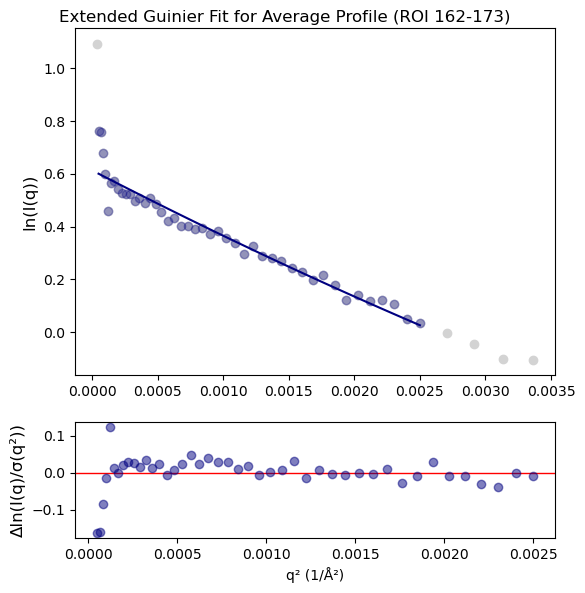

In [51]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label='Extended Guinier fit')



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()

# Ideal Frames 175-185

In [52]:
# Define a region of interest (ROI) for analysis, zero indexed
roi_start = int(175)
roi_end = int(185)

#Get profiles from the series in a given range, zero indexed
profiles_roi = my_series.getSASMList(roi_start, roi_end)
sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')


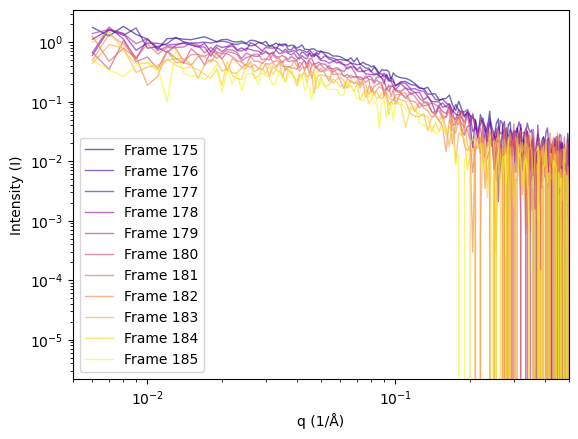

In [53]:
# Plot Sub-profiles
plt.figure()

n = len(sub_profiles_roi)
cmap = plt.cm.plasma  # yellow → purple

for i in range(len(sub_profiles_roi)):
    profile_n = sub_profiles_roi[i]

    q = profile_n.getQ()
    intensity = profile_n.getI()
    error = profile_n.getErr()

    # Normalize index to [0,1] for colormap
    color = cmap(i / (n - 1))

    # Plot individual curves
    plt.plot(q, intensity, color=color, alpha=0.6, linewidth=1, label=f'Frame {roi_start + i}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()


In [54]:
average_profile = raw.average(sub_profiles_roi[:])
average_profile

In [55]:
# AverageProfile 
q_avg=average_profile.getQ()
intensity_avg=average_profile.getI()
error_avg=average_profile.getErr()

Text(0, 0.5, 'Intensity (I)')

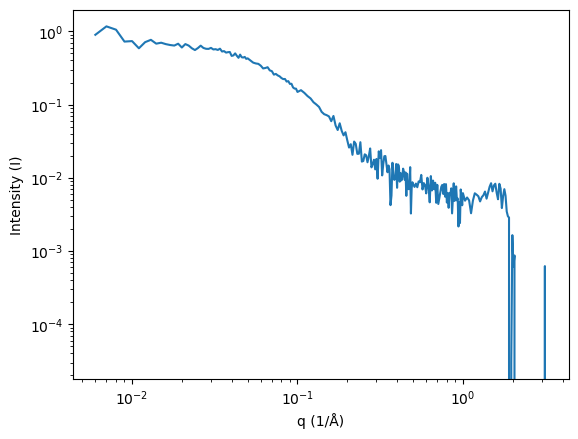

In [56]:
# Average curve
plt.Figure(figsize=(8,6), dpi=120)
plt.plot(q_avg, intensity_avg, linestyle='-', marker=None)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')



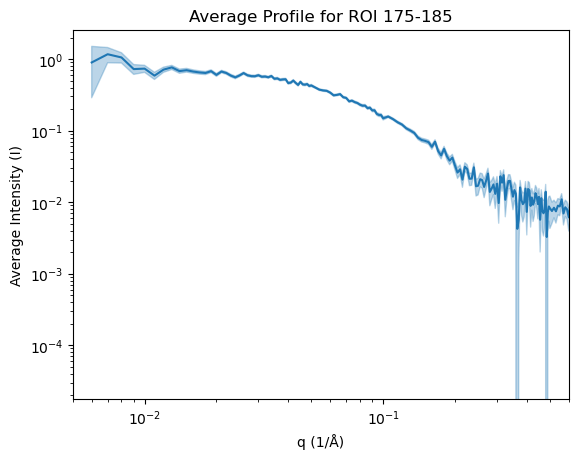

In [57]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q_avg, intensity_avg, label='Intensity (normalized)')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Average Intensity (I)')
plt.fill_between(
    q_avg,
    intensity_avg - error_avg,
    intensity_avg + error_avg,
    alpha=0.3,
    color=line.get_color()
)
plt.xlim(0.005, 0.6)
plt.title(f'Average Profile for ROI {roi_start}-{roi_end}')
plt.show()
 

#### Analyze Average of Single Frame

In [58]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(average_profile, settings=my_settings)

print(f"Guinier fit results for {average_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x327e69f50>
i0: 6.975e-01 ± 8.713e-03
Rg: 2.499e+01 ± 4.942e-01
Guinier fit R²: 0.8228
Guinier range: q = 8.000e-03 to 5.200e-02
Guinier range used Rg: q = 1.999e-01 to 1.299e+00
idx_min: 2, idx_max: 45


In [59]:
# AverageProfile 
q=average_profile.getQ()
intensity = average_profile.getI()
error = average_profile.getErr()

/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/3603877103.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


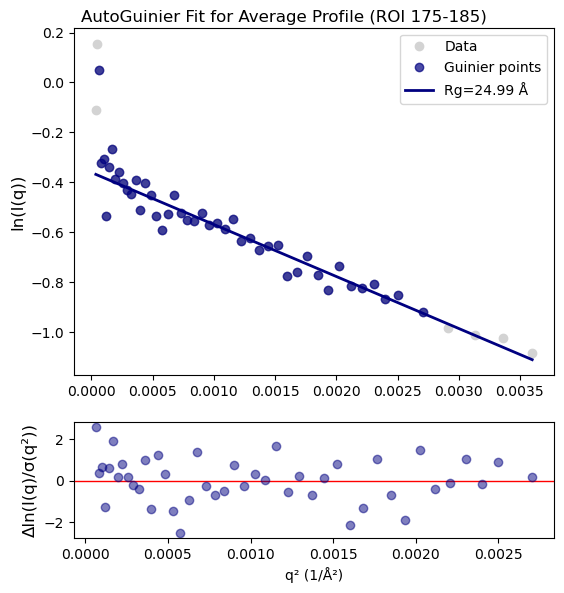

In [60]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Rg={rg:.2f} Å', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    axs[0].legend()

    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()


Fit with idx_min=0, idx_max=45: Rg=2.503e+01 ± 4.927e-01, R²=0.7298
Fit with idx_min=1, idx_max=45: Rg=2.503e+01 ± 4.928e-01, R²=0.7367
Fit with idx_min=2, idx_max=45: Rg=2.499e+01 ± 4.942e-01, R²=0.8228
Fit with idx_min=3, idx_max=45: Rg=2.490e+01 ± 4.968e-01, R²=0.9126
Fit with idx_min=4, idx_max=45: Rg=2.489e+01 ± 4.981e-01, R²=0.9103
Fit with idx_min=5, idx_max=45: Rg=2.486e+01 ± 5.007e-01, R²=0.9091
Fit with idx_min=6, idx_max=45: Rg=2.492e+01 ± 5.016e-01, R²=0.9284
Fit with idx_min=7, idx_max=45: Rg=2.488e+01 ± 5.060e-01, R²=0.9263
Fit with idx_min=8, idx_max=45: Rg=2.473e+01 ± 5.147e-01, R²=0.9360
Fit with idx_min=9, idx_max=45: Rg=2.471e+01 ± 5.207e-01, R²=0.9327
Fit with idx_min=10, idx_max=45: Rg=2.462e+01 ± 5.296e-01, R²=0.9312
Fit with idx_min=11, idx_max=45: Rg=2.459e+01 ± 5.386e-01, R²=0.9272
Fit with idx_min=12, idx_max=45: Rg=2.459e+01 ± 5.479e-01, R²=0.9230
Fit with idx_min=13, idx_max=45: Rg=2.461e+01 ± 5.579e-01, R²=0.9190
Fit with idx_min=14, idx_max=45: Rg=2.446e+0

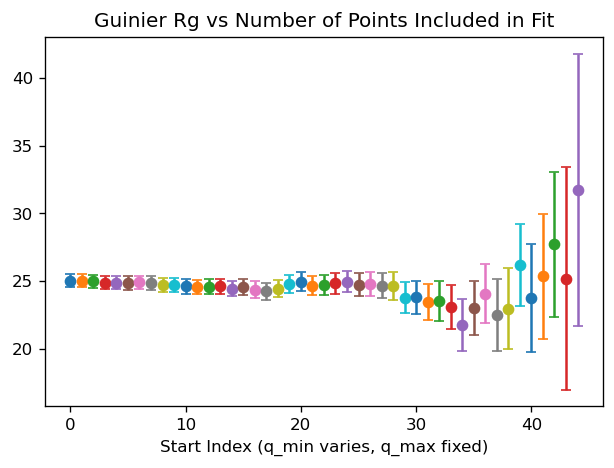

In [61]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [62]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 3
idx_max

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 6.958e-01 ± 8.715e-03
Rg: 2.490e+01 ± 4.968e-01
Guinier fit R²: 0.9126
Guinier range: q = 9.000e-03 to 5.200e-02
Guinier range used Rg: q = 2.241e-01 to 1.295e+00
idx_min: 3, idx_max: 45


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/372981671.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


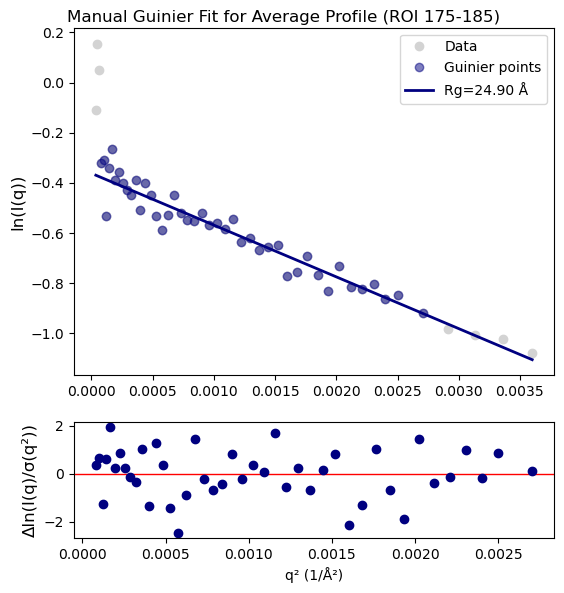

In [63]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.5)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100, label=f'Rg={rg:.2f} Å')
    axs[0].legend()
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
# plt.ylabel('ln(I)')
plt.suptitle(f'Manual Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()

Text(0.5, 1.0, 'Kratky Plot for ROI 175-185')

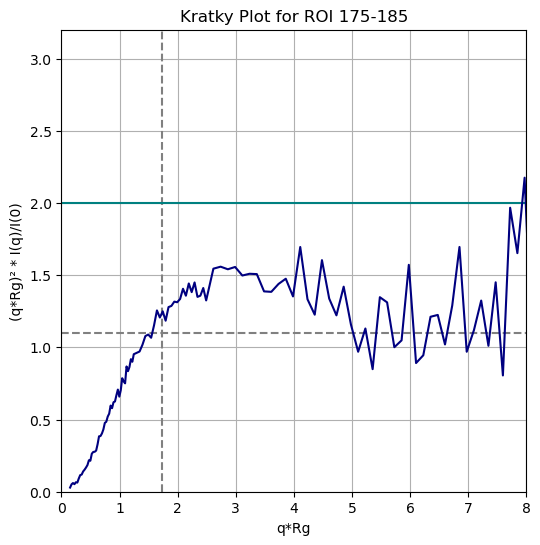

In [64]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')
plt.title(f'Kratky Plot for ROI {roi_start}-{roi_end}')

Auto-determined Dmax: 91.00 Å
GNOM fit results for Dmax=91 Å:
Dmax: 91.00 Å
Rg: 2.730e+01 ± 5.895e-01 Å
i0: 7.139e-01


Text(0, 0.5, 'P(Rg) / I0')

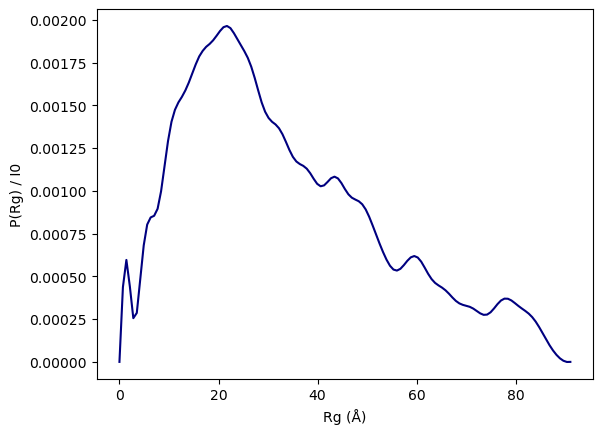

In [65]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(average_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

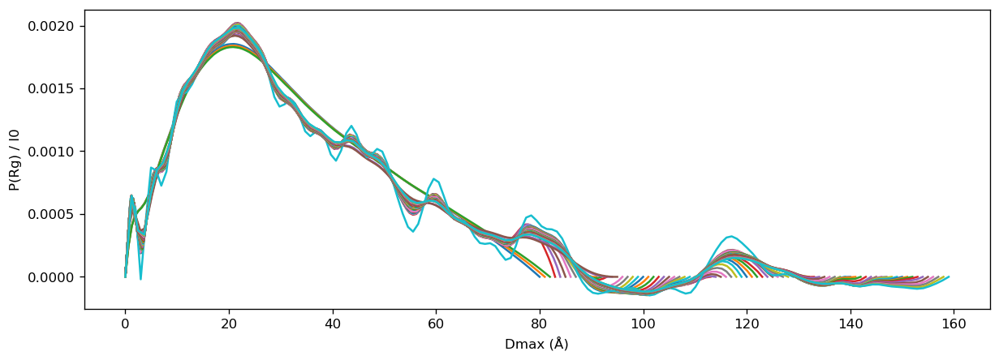

In [66]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

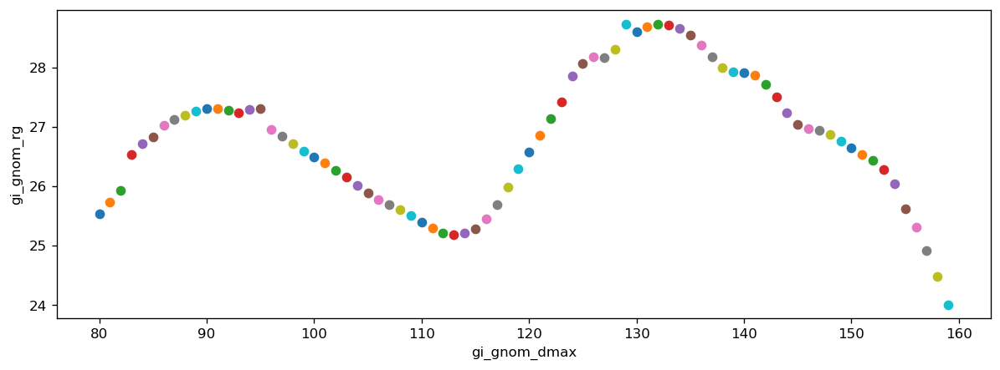

In [67]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=95.0 Å:
Dmax: 95.00 Å
Rg: 2.730e+01 ± 5.930e-01 Å
i0: 7.137e-01


Text(0.5, 1.0, 'GNOM Fit for Dmax=95.0 Å, ROI 175-185')

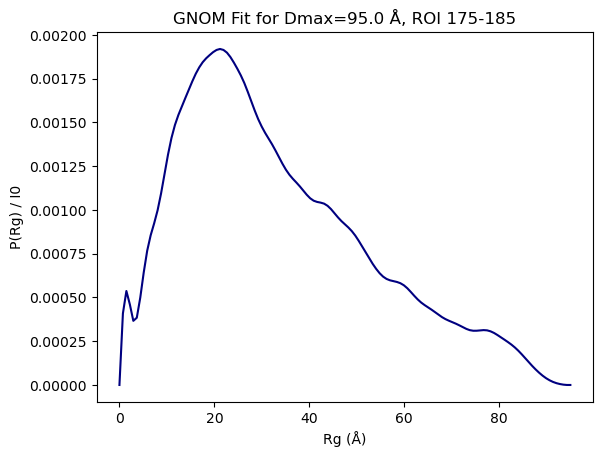

In [68]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 95.0  # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')
plt.title(f'GNOM Fit for Dmax={dmax} Å, ROI {roi_start}-{roi_end}')

#### Calculate Extended Guinier

In [69]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=idx_min
# qmin_offset=2
# qmax_offset=40

In [70]:
eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



26.280148746613257
0.5033378819149221
0.7062726768816373
[0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017 0.018 0.019 0.02
 0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029 0.03  0.031 0.032
 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041 0.042 0.043 0.044
 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/2443930316.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


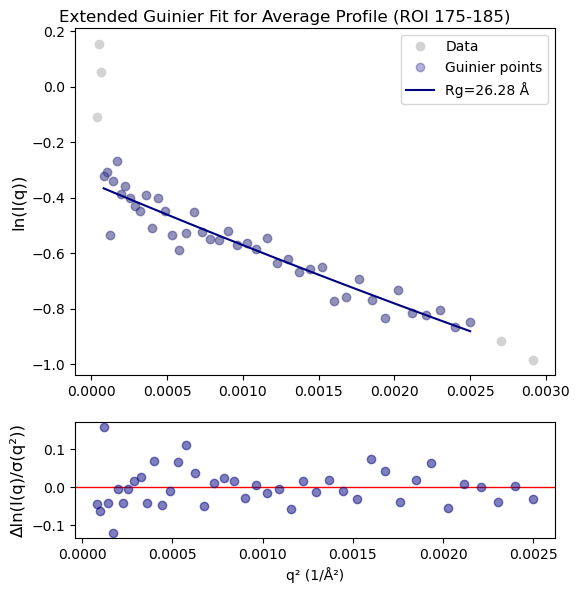

In [71]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label=f'Rg={result["Rg"]:.2f} Å')
axs[0].legend()



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()

# Single Best Frame 180

In [72]:
FOI = int(180)  # Frame of Interest, zero indexed

profile = profiles_roi = my_series.getSASMList(FOI, FOI)
sub_profiles_roi = my_series.getSASMList(FOI, FOI, 'sub')

FOI_profile = sub_profiles_roi[0]
FOI_profile

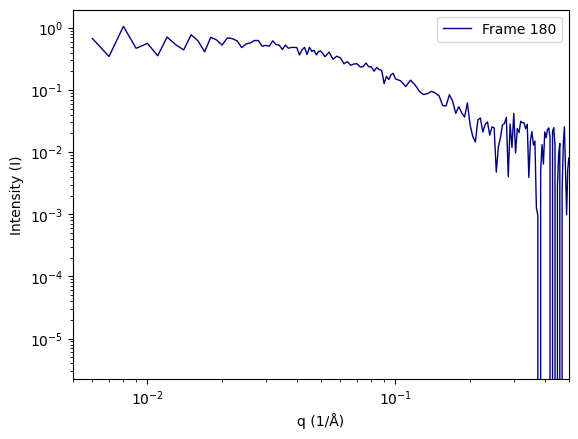

In [73]:
plt.figure()

q = FOI_profile.getQ()
intensity = FOI_profile.getI()
error = FOI_profile.getErr()


# Plot individual curves
plt.plot(q, intensity, color=colorWT, linewidth=1, label=f'Frame {FOI}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()

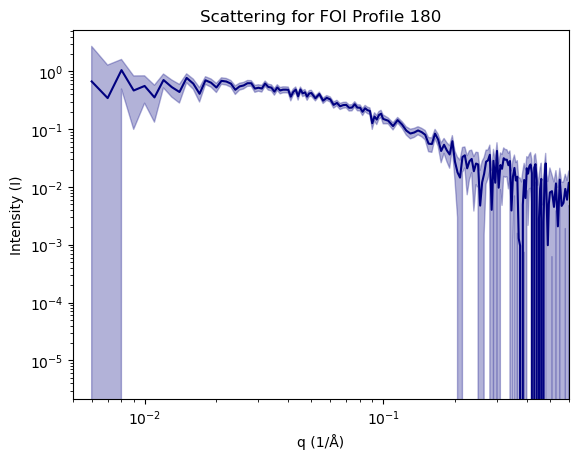

In [74]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q, intensity, label='Intensity (normalized)', color=colorWT)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.fill_between(
    q,
    intensity - error,
    intensity + error,
    alpha=0.3,
    color=colorWT
)
plt.xlim(0.005, 0.6)
plt.title(f'Scattering for FOI Profile {FOI}')
plt.show()
 

In [75]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(FOI_profile, settings=my_settings)

print(f"Guinier fit results for {FOI_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x31ecc3550>
i0: 6.642e-01 ± 3.095e-02
Rg: 2.477e+01 ± 1.681e+00
Guinier fit R²: 0.6893
Guinier range: q = 1.900e-02 to 5.400e-02
Guinier range used Rg: q = 4.707e-01 to 1.338e+00
idx_min: 13, idx_max: 46


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_44937/1064120143.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


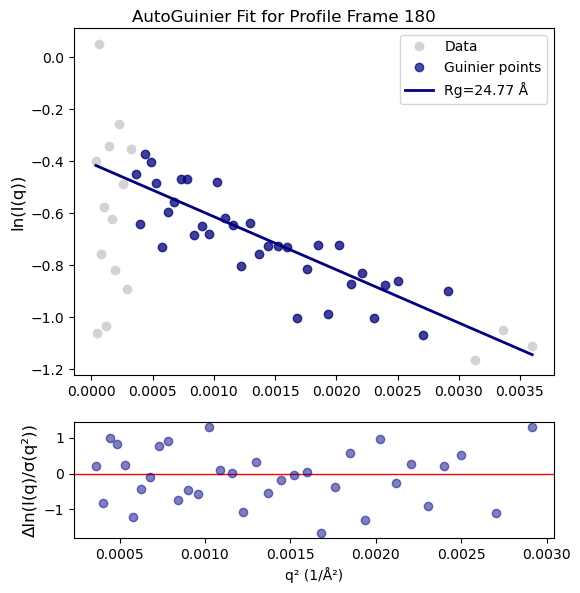

In [76]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100,label=f'Rg={rg:.2f} Å')
    axs[0].legend()
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Profile Frame {FOI}')
plt.show()


Fit with idx_min=0, idx_max=46: Rg=2.482e+01 ± 1.546e+00, R²=0.2491
Fit with idx_min=1, idx_max=46: Rg=2.482e+01 ± 1.547e+00, R²=0.2259
Fit with idx_min=2, idx_max=46: Rg=2.482e+01 ± 1.546e+00, R²=0.3559
Fit with idx_min=3, idx_max=46: Rg=2.473e+01 ± 1.555e+00, R²=0.2937
Fit with idx_min=4, idx_max=46: Rg=2.476e+01 ± 1.555e+00, R²=0.3530
Fit with idx_min=5, idx_max=46: Rg=2.479e+01 ± 1.557e+00, R²=0.3600
Fit with idx_min=6, idx_max=46: Rg=2.487e+01 ± 1.554e+00, R²=0.5324
Fit with idx_min=7, idx_max=46: Rg=2.481e+01 ± 1.570e+00, R²=0.5045
Fit with idx_min=8, idx_max=46: Rg=2.489e+01 ± 1.572e+00, R²=0.5231
Fit with idx_min=9, idx_max=46: Rg=2.505e+01 ± 1.569e+00, R²=0.6096
Fit with idx_min=10, idx_max=46: Rg=2.472e+01 ± 1.617e+00, R²=0.5885
Fit with idx_min=11, idx_max=46: Rg=2.475e+01 ± 1.636e+00, R²=0.5735
Fit with idx_min=12, idx_max=46: Rg=2.504e+01 ± 1.628e+00, R²=0.7066
Fit with idx_min=13, idx_max=46: Rg=2.477e+01 ± 1.681e+00, R²=0.6893
Fit with idx_min=14, idx_max=46: Rg=2.470e+0

ValueError: 'yerr' must not contain negative values

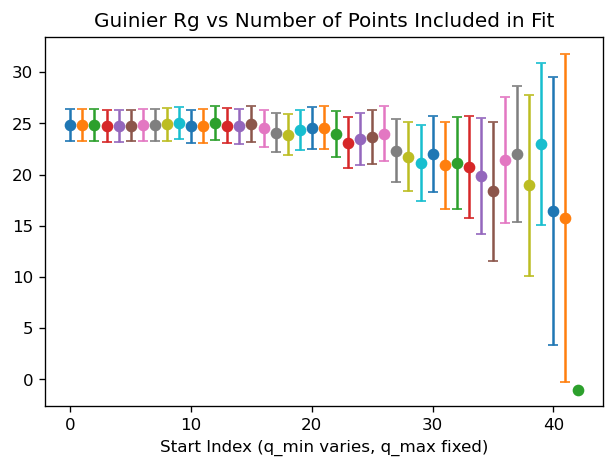

In [520]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [521]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 0
idx_max = 45

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 6.798e-01 ± 2.984e-02
Rg: 2.610e+01 ± 1.682e+00
Guinier fit R²: 0.2127
Guinier range: q = 6.000e-03 to 5.200e-02
Guinier range used Rg: q = 1.566e-01 to 1.357e+00
idx_min: 0, idx_max: 45


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/3690464081.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


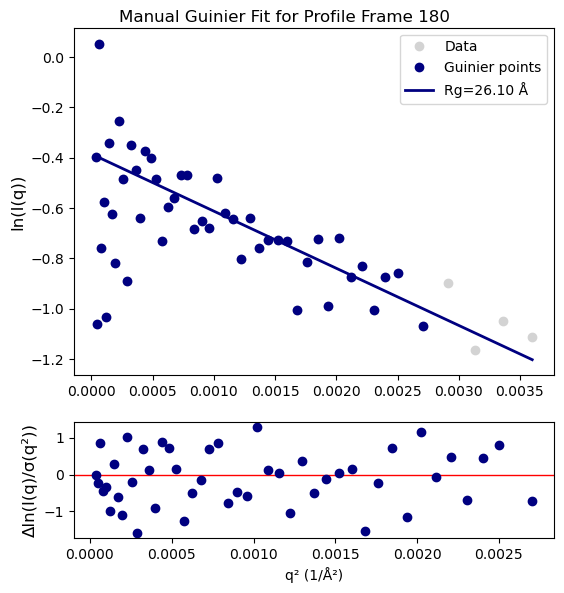

In [522]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100, label=f'Rg={rg:.2f} Å')
    axs[0].legend()
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Manual Guinier Fit for Profile Frame {FOI}')
# plt.ylabel('ln(I)')
plt.show()

Text(0.5, 1.0, 'Kratky Plot for Profile Frame 180')

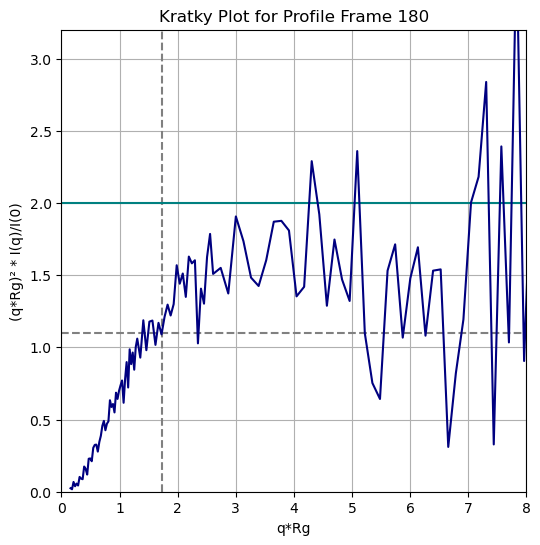

In [524]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')
plt.title(f'Kratky Plot for Profile Frame {FOI}')

/opt/anaconda3/envs/RAW/lib/python3.14/site-packages/bioxtasraw/BIFT.py:334: RuntimeWarning: invalid value encountered in divide
  sinc_qr = np.where(qr==0, 1, np.sin(qr)/qr)


Auto-determined Dmax: 86.00 Å
GNOM fit results for Dmax=86 Å:
Dmax: 86.00 Å
Rg: 2.685e+01 ± 5.732e-01 Å
i0: 6.472e-01


Text(0, 0.5, 'P(Rg) / I0')

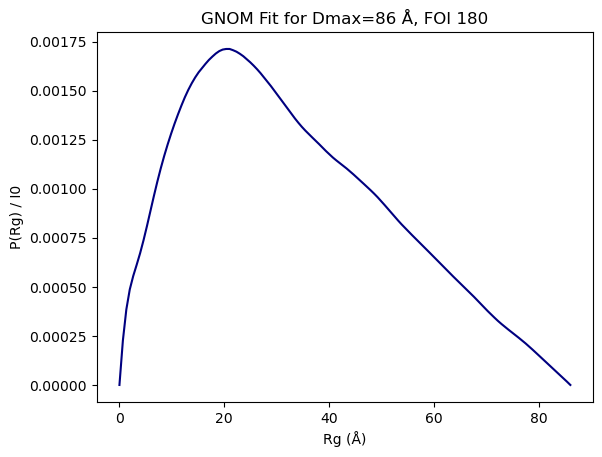

In [525]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(FOI_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM Fit for Dmax={dmax} Å, FOI {FOI}')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

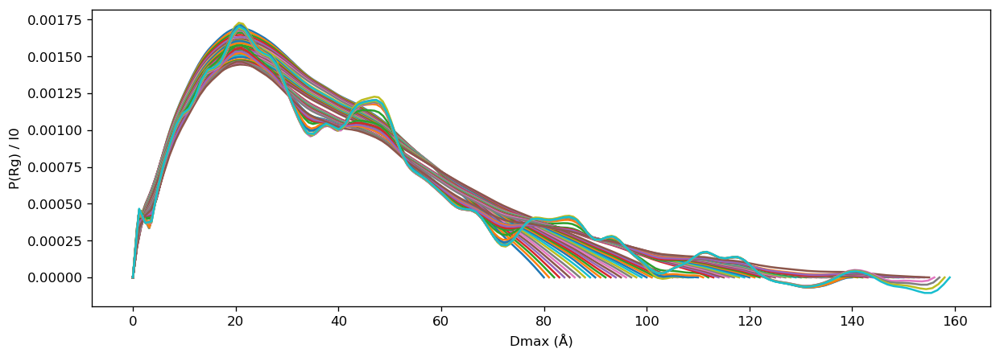

In [301]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

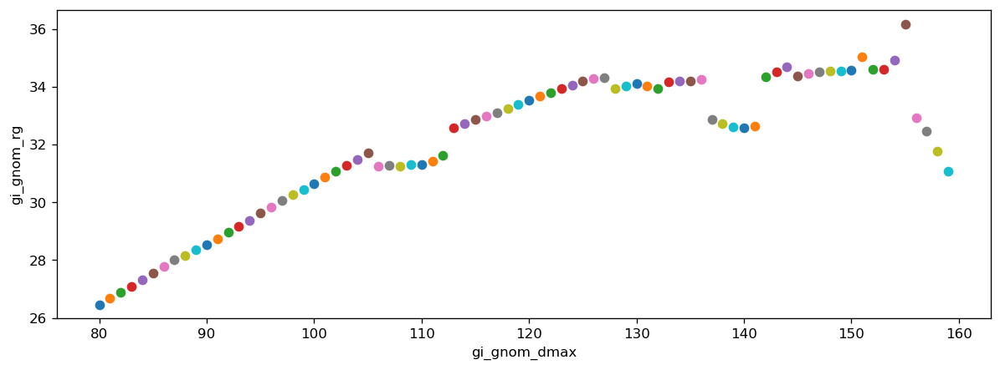

In [302]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=110 Å:
Dmax: 110.00 Å
Rg: 2.887e+01 ± 1.823e+00 Å
i0: 6.859e-01


Text(0, 0.5, 'P(Rg) / I0')

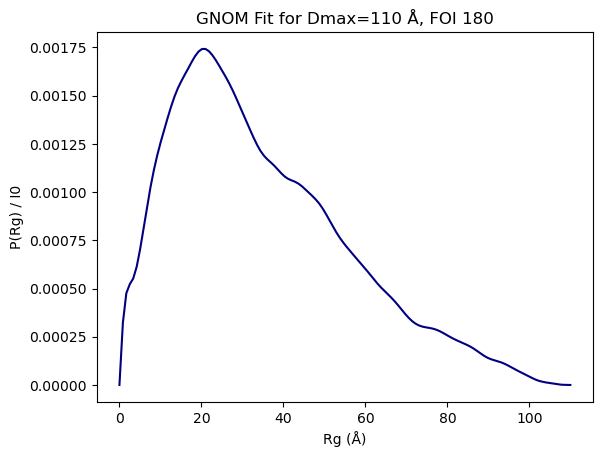

In [526]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 110 # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM Fit for Dmax={dmax} Å, FOI {FOI}')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

In [304]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=0
# qmin_offset=2
# qmax_offset=40

In [305]:
eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



34.50205817077841
0.5707282098789945
0.891722106256378
[0.006 0.007 0.008 0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017
 0.018 0.019 0.02  0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029
 0.03  0.031 0.032 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041
 0.042 0.043 0.044 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/3534837312.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


ValueError: x and y must have same first dimension, but have shapes (45,) and (46,)

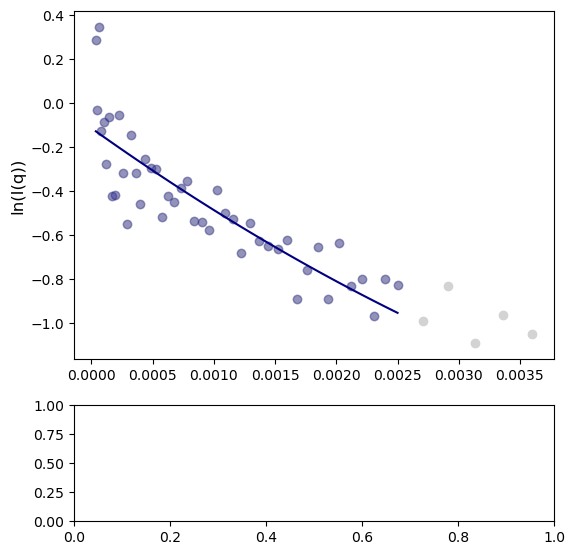

In [334]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label='Extended Guinier fit')



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for FOI Profile (Frame {FOI})')
plt.show()

In [527]:
# Define a region of interest (ROI) for analysis, zero indexed
roi_start = int(163)
roi_end = int(168)

#Get profiles from the series in a given range, zero indexed
profiles_roi = my_series.getSASMList(roi_start, roi_end)
sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')


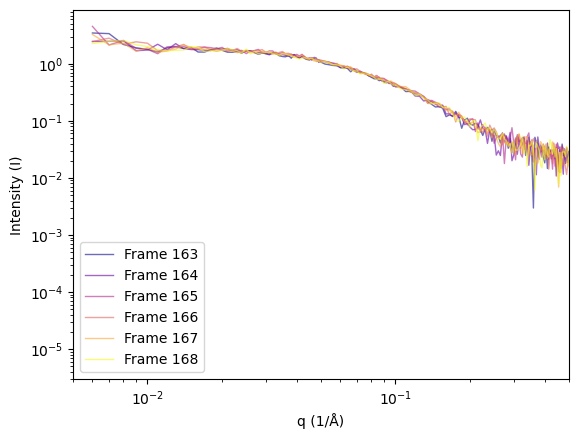

In [528]:
# Plot Sub-profiles
plt.figure()

n = len(sub_profiles_roi)
cmap = plt.cm.plasma  # yellow → purple

for i in range(len(sub_profiles_roi)):
    profile_n = sub_profiles_roi[i]

    q = profile_n.getQ()
    intensity = profile_n.getI()
    error = profile_n.getErr()

    # Normalize index to [0,1] for colormap
    color = cmap(i / (n - 1))

    # Plot individual curves
    plt.plot(q, intensity, color=color, alpha=0.6, linewidth=1, label=f'Frame {roi_start + i}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()


In [529]:
average_profile = raw.average(sub_profiles_roi[:])
average_profile

In [530]:
# AverageProfile 
q_avg=average_profile.getQ()
intensity_avg=average_profile.getI()
error_avg=average_profile.getErr()

Text(0.5, 1.0, 'Average Profile for ROI 163-168')

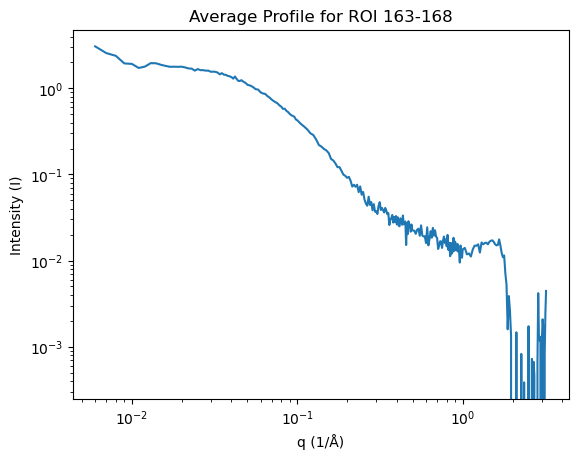

In [531]:
# Average curve
plt.Figure(figsize=(8,6), dpi=120)
plt.plot(q_avg, intensity_avg, linestyle='-', marker=None)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.title(f'Average Profile for ROI {roi_start}-{roi_end}')


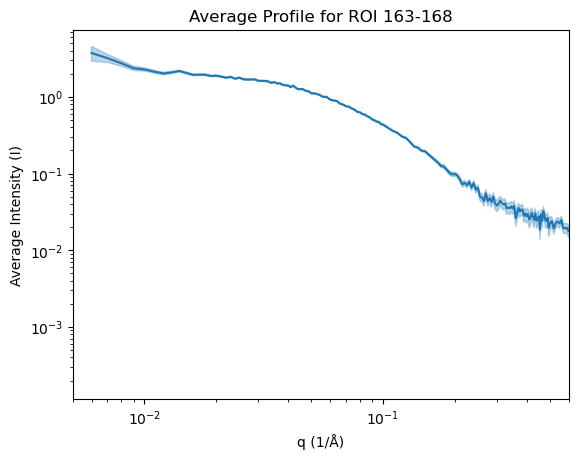

In [396]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q_avg, intensity_avg, label='Intensity (normalized)')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Average Intensity (I)')
plt.fill_between(
    q_avg,
    intensity_avg - error_avg,
    intensity_avg + error_avg,
    alpha=0.3,
    color=line.get_color()
)
plt.xlim(0.005, 0.6)

plt.title(f'Average Profile for ROI {roi_start}-{roi_end}')
plt.show()
 

#### Analyze Average of Frames

In [532]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(average_profile, settings=my_settings)

print(f"Guinier fit results for {average_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x12051c450>
i0: 1.918e+00 ± 1.329e-02
Rg: 2.547e+01 ± 2.879e-01
Guinier fit R²: 0.7928
Guinier range: q = 6.000e-03 to 5.000e-02
Guinier range used Rg: q = 1.528e-01 to 1.273e+00
idx_min: 0, idx_max: 44


In [533]:
# AverageProfile 
q=average_profile.getQ()
intensity = average_profile.getI()
error = average_profile.getErr()

/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/1379622750.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


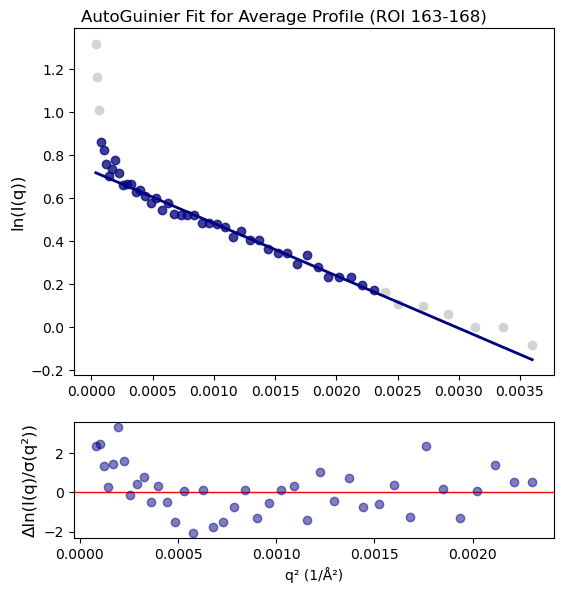

In [400]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()


Fit with idx_min=0, idx_max=42: Rg=2.719e+01 ± 2.859e-01, R²=0.7238
Fit with idx_min=1, idx_max=42: Rg=2.717e+01 ± 2.863e-01, R²=0.8207
Fit with idx_min=2, idx_max=42: Rg=2.712e+01 ± 2.871e-01, R²=0.9000
Fit with idx_min=3, idx_max=42: Rg=2.705e+01 ± 2.885e-01, R²=0.9481
Fit with idx_min=4, idx_max=42: Rg=2.699e+01 ± 2.902e-01, R²=0.9616
Fit with idx_min=5, idx_max=42: Rg=2.691e+01 ± 2.928e-01, R²=0.9714
Fit with idx_min=6, idx_max=42: Rg=2.686e+01 ± 2.957e-01, R²=0.9729
Fit with idx_min=7, idx_max=42: Rg=2.684e+01 ± 2.986e-01, R²=0.9716
Fit with idx_min=8, idx_max=42: Rg=2.677e+01 ± 3.033e-01, R²=0.9724
Fit with idx_min=9, idx_max=42: Rg=2.656e+01 ± 3.107e-01, R²=0.9828
Fit with idx_min=10, idx_max=42: Rg=2.645e+01 ± 3.176e-01, R²=0.9858
Fit with idx_min=11, idx_max=42: Rg=2.642e+01 ± 3.239e-01, R²=0.9850
Fit with idx_min=12, idx_max=42: Rg=2.635e+01 ± 3.323e-01, R²=0.9847
Fit with idx_min=13, idx_max=42: Rg=2.623e+01 ± 3.428e-01, R²=0.9853
Fit with idx_min=14, idx_max=42: Rg=2.622e+0

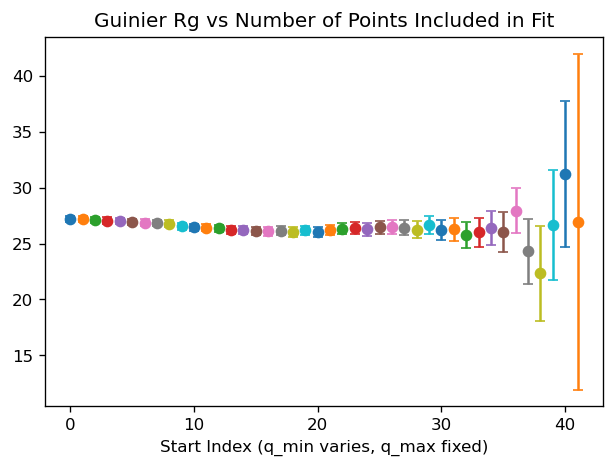

In [401]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [404]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 3
idx_max = 42

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 2.067e+00 ± 1.407e-02
Rg: 2.705e+01 ± 2.885e-01
Guinier fit R²: 0.9481
Guinier range: q = 9.000e-03 to 4.800e-02
Guinier range used Rg: q = 2.435e-01 to 1.299e+00
idx_min: 3, idx_max: 42


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/487275401.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


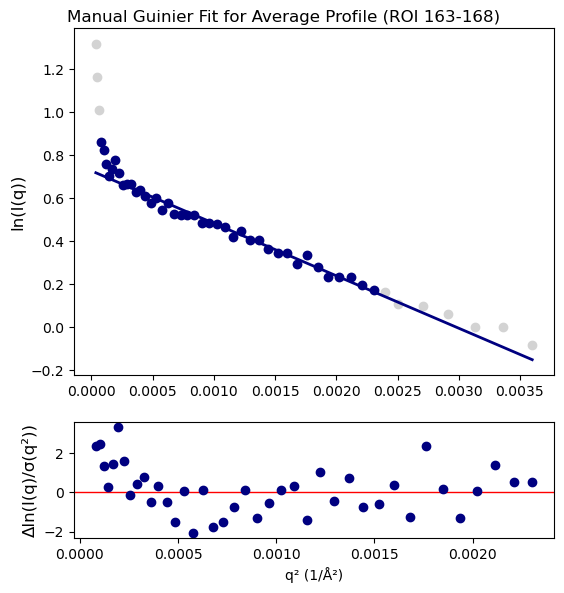

In [405]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Manual Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
# plt.ylabel('ln(I)')
plt.show()

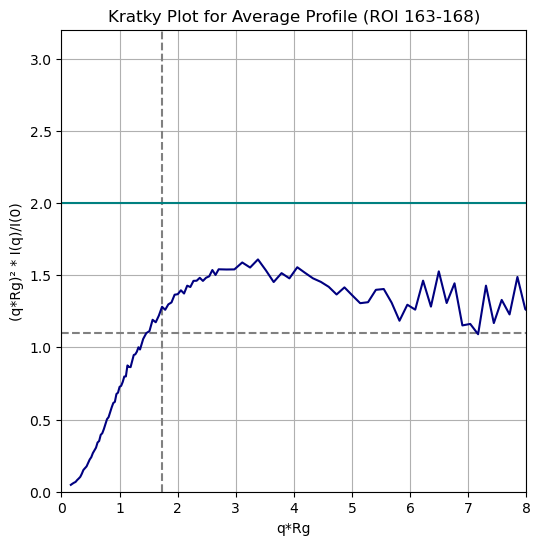

In [406]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.title(f'Kratky Plot for Average Profile (ROI {roi_start}-{roi_end})')
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')

Auto-determined Dmax: 107.00 Å
GNOM fit results for Dmax=107 Å:
Dmax: 107.00 Å
Rg: 2.884e+01 ± 3.807e-01 Å
i0: 2.095e+00


Text(0, 0.5, 'P(Rg) / I0')

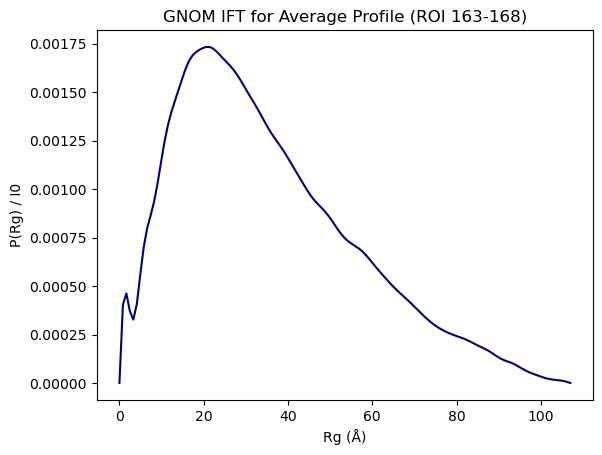

In [407]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(average_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM IFT for Average Profile (ROI {roi_start}-{roi_end})')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

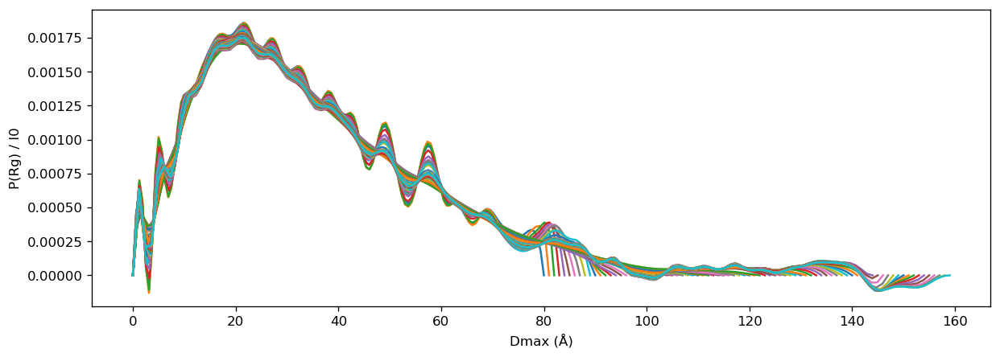

In [408]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

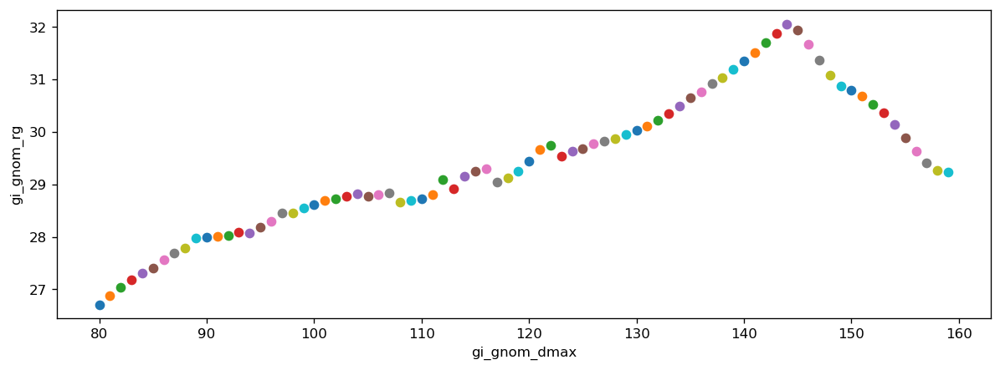

In [409]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=110 Å:
Dmax: 110.00 Å
Rg: 2.873e+01 ± 5.864e-01 Å
i0: 2.091e+00


Text(0, 0.5, 'P(Rg) / I0')

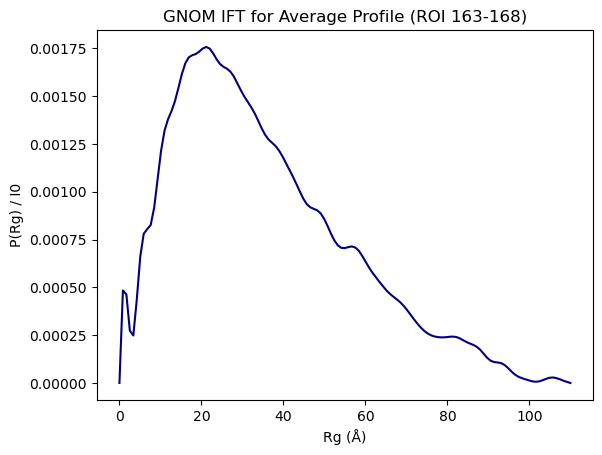

In [410]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 110  # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM IFT for Average Profile (ROI {roi_start}-{roi_end})')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

#### Calculate Extended Guinier

In [411]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=idx_min
# qmin_offset=2
# qmax_offset=40

In [412]:
eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



29.465570487081404
0.5317435432501041
2.147302985080072
[0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017 0.018 0.019 0.02
 0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029 0.03  0.031 0.032
 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041 0.042 0.043 0.044
 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/121237510.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


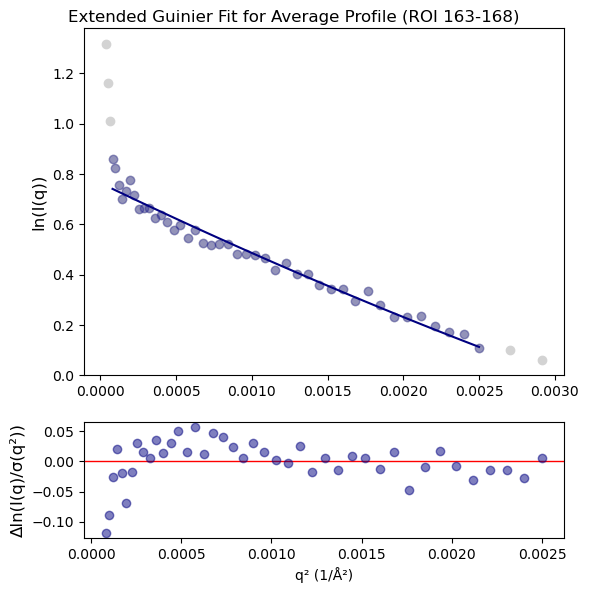

In [413]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label='Extended Guinier fit')



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()

In [414]:
FOI = int(163)  # Frame of Interest, zero indexed

profile = profiles_roi = my_series.getSASMList(FOI, FOI)
sub_profiles_roi = my_series.getSASMList(FOI, FOI, 'sub')

FOI_profile = sub_profiles_roi[0]
FOI_profile

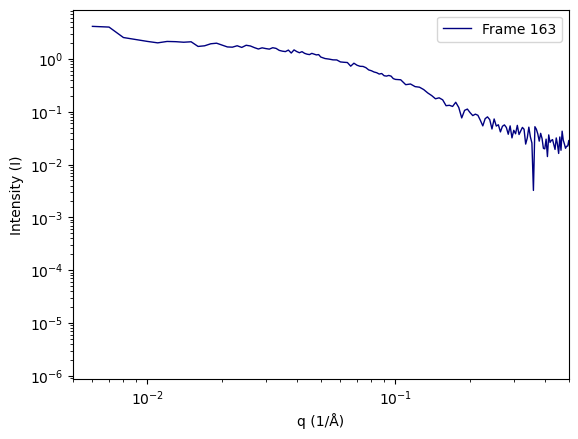

In [415]:
plt.figure()

q = FOI_profile.getQ()
intensity = FOI_profile.getI()
error = FOI_profile.getErr()


# Plot individual curves
plt.plot(q, intensity, color=colorWT, linewidth=1, label=f'Frame {FOI}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()

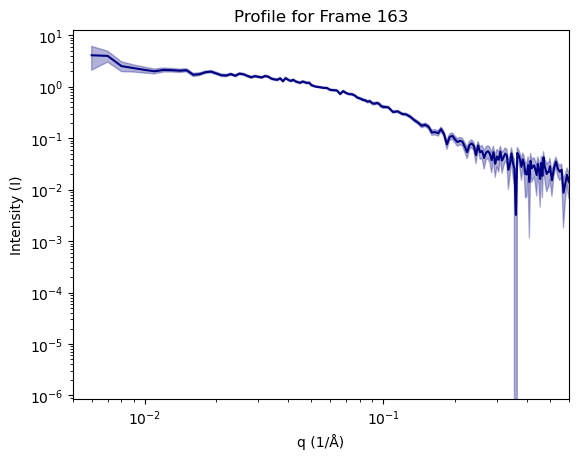

In [416]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q, intensity, label='Intensity (normalized)', color=colorWT)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.fill_between(
    q,
    intensity - error,
    intensity + error,
    alpha=0.3,
    color=colorWT
)
plt.xlim(0.005, 0.6)
plt.title(f'Profile for Frame {FOI}')
plt.show()
 

In [417]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(FOI_profile, settings=my_settings)

print(f"Guinier fit results for {FOI_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x34f6bc350>
i0: 1.987e+00 ± 3.286e-02
Rg: 2.635e+01 ± 6.895e-01
Guinier fit R²: 0.8600
Guinier range: q = 8.000e-03 to 4.900e-02
Guinier range used Rg: q = 2.108e-01 to 1.291e+00
idx_min: 2, idx_max: 43


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/339742023.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


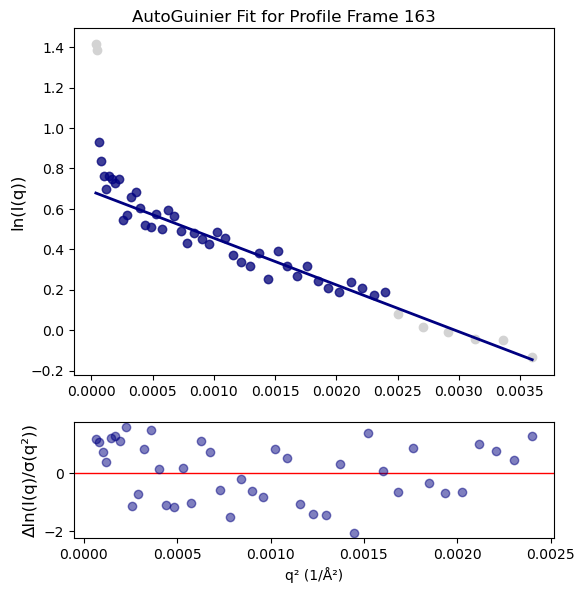

In [418]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Profile Frame {FOI}')
plt.show()


Fit with idx_min=0, idx_max=43: Rg=2.649e+01 ± 6.843e-01, R²=0.6117
Fit with idx_min=1, idx_max=43: Rg=2.646e+01 ± 6.853e-01, R²=0.7019
Fit with idx_min=2, idx_max=43: Rg=2.635e+01 ± 6.895e-01, R²=0.8600
Fit with idx_min=3, idx_max=43: Rg=2.629e+01 ± 6.923e-01, R²=0.8858
Fit with idx_min=4, idx_max=43: Rg=2.623e+01 ± 6.965e-01, R²=0.8957
Fit with idx_min=5, idx_max=43: Rg=2.617e+01 ± 7.016e-01, R²=0.8955
Fit with idx_min=6, idx_max=43: Rg=2.614e+01 ± 7.079e-01, R²=0.8912
Fit with idx_min=7, idx_max=43: Rg=2.600e+01 ± 7.195e-01, R²=0.8919
Fit with idx_min=8, idx_max=43: Rg=2.583e+01 ± 7.343e-01, R²=0.8929
Fit with idx_min=9, idx_max=43: Rg=2.567e+01 ± 7.502e-01, R²=0.8924
Fit with idx_min=10, idx_max=43: Rg=2.540e+01 ± 7.718e-01, R²=0.8997
Fit with idx_min=11, idx_max=43: Rg=2.551e+01 ± 7.803e-01, R²=0.9029
Fit with idx_min=12, idx_max=43: Rg=2.559e+01 ± 7.936e-01, R²=0.9004
Fit with idx_min=13, idx_max=43: Rg=2.537e+01 ± 8.226e-01, R²=0.8962
Fit with idx_min=14, idx_max=43: Rg=2.497e+0

ValueError: 'yerr' must not contain negative values

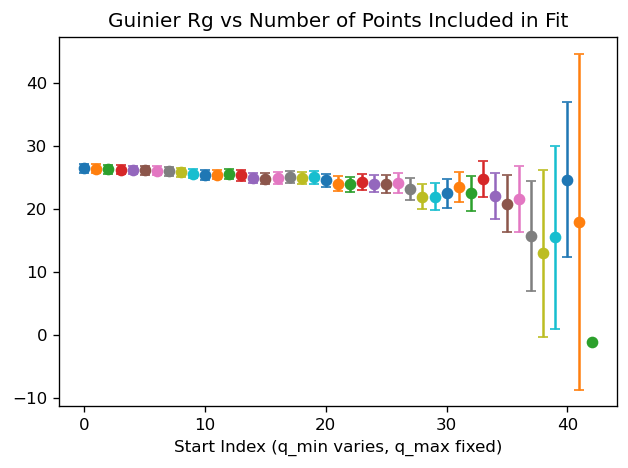

In [419]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [420]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 2
idx_max = 45

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 2.000e+00 ± 3.117e-02
Rg: 2.675e+01 ± 5.850e-01
Guinier fit R²: 0.8885
Guinier range: q = 8.000e-03 to 5.200e-02
Guinier range used Rg: q = 2.140e-01 to 1.391e+00
idx_min: 2, idx_max: 45


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/790654339.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


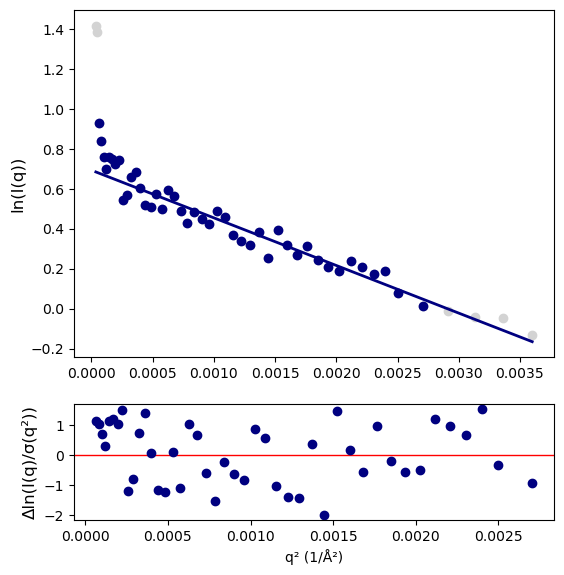

In [421]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
# plt.ylabel('ln(I)')
plt.show()

Text(0.5, 1.0, 'Kratky Plot for Profile Frame 163')

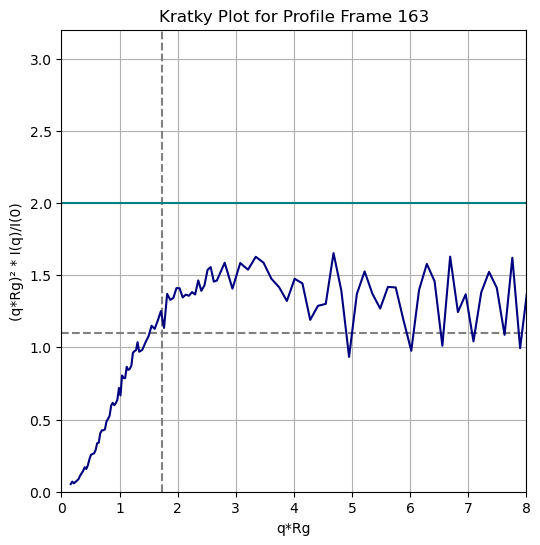

In [422]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')
plt.title(f'Kratky Plot for Profile Frame {FOI}')

Auto-determined Dmax: 105.00 Å
GNOM fit results for Dmax=105 Å:
Dmax: 105.00 Å
Rg: 2.894e+01 ± 7.205e-01 Å
i0: 2.028e+00


Text(0, 0.5, 'P(Rg) / I0')

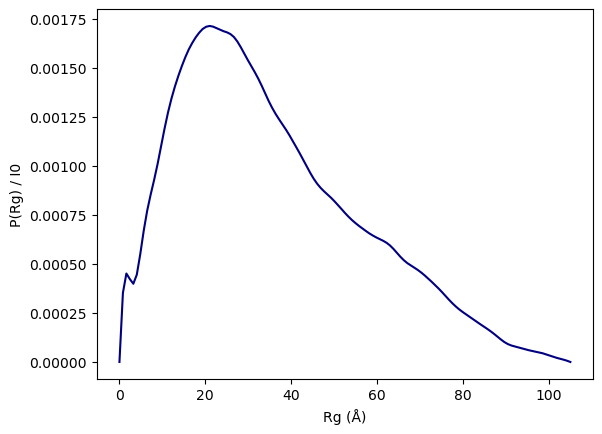

In [423]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(FOI_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

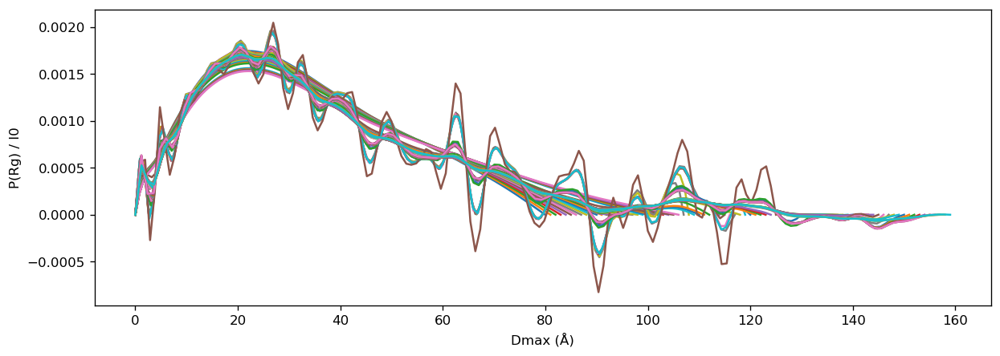

In [424]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

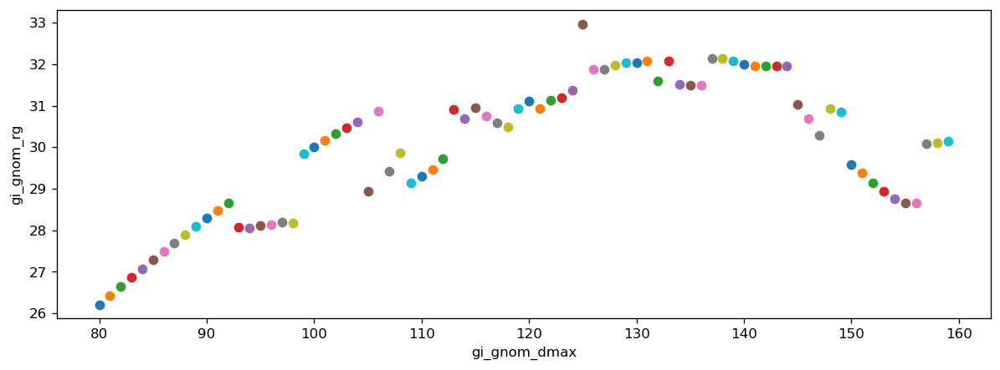

In [425]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=110 Å:
Dmax: 110.00 Å
Rg: 2.930e+01 ± 1.101e+00 Å
i0: 2.037e+00


Text(0, 0.5, 'P(Rg) / I0')

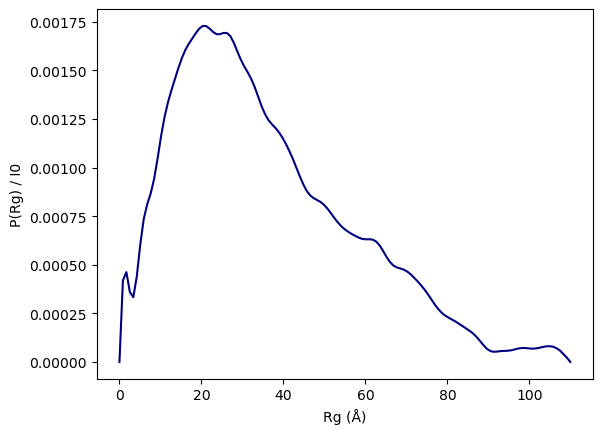

In [426]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 110 # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

In [427]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=0
# qmin_offset=2
# qmax_offset=40

In [431]:
q = FOI_profile.getQ()
intensity = FOI_profile.getI()
error = FOI_profile.getErr()

eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



33.34346333722343
0.562307709926553
2.3046833650338763
[0.006 0.007 0.008 0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017
 0.018 0.019 0.02  0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029
 0.03  0.031 0.032 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041
 0.042 0.043 0.044 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/2049655427.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


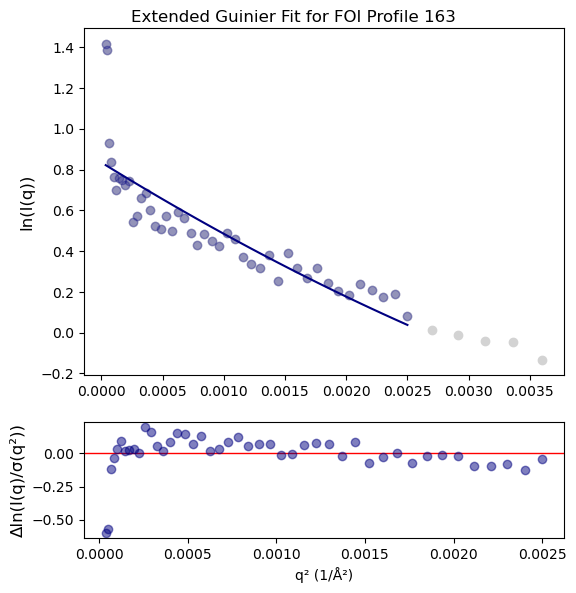

In [430]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label='Extended Guinier fit')



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for FOI Profile {FOI}')
plt.show()

# Ideal Frames 163-168

In [534]:
# Define a region of interest (ROI) for analysis, zero indexed
roi_start = int(163)
roi_end = int(168)

#Get profiles from the series in a given range, zero indexed
profiles_roi = my_series.getSASMList(roi_start, roi_end)
sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')


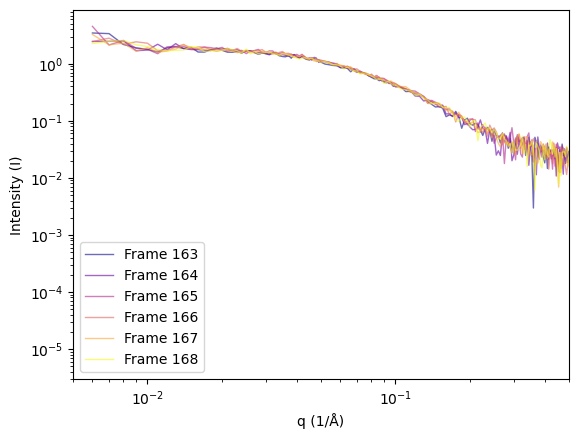

In [535]:
# Plot Sub-profiles
plt.figure()

n = len(sub_profiles_roi)
cmap = plt.cm.plasma  # yellow → purple

for i in range(len(sub_profiles_roi)):
    profile_n = sub_profiles_roi[i]

    q = profile_n.getQ()
    intensity = profile_n.getI()
    error = profile_n.getErr()

    # Normalize index to [0,1] for colormap
    color = cmap(i / (n - 1))

    # Plot individual curves
    plt.plot(q, intensity, color=color, alpha=0.6, linewidth=1, label=f'Frame {roi_start + i}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()


In [536]:
average_profile = raw.average(sub_profiles_roi[:])
average_profile

In [537]:
# AverageProfile 
q_avg=average_profile.getQ()
intensity_avg=average_profile.getI()
error_avg=average_profile.getErr()

Text(0, 0.5, 'Intensity (I)')

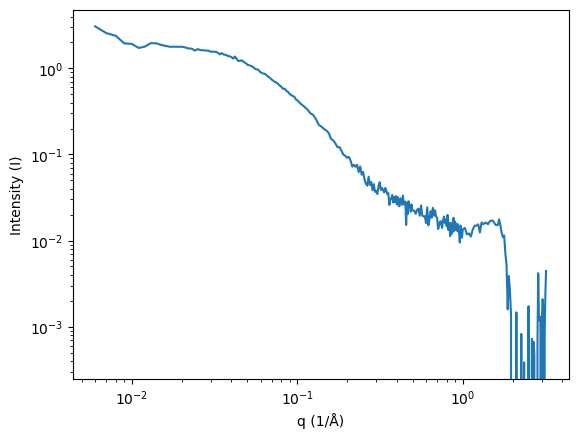

In [538]:
# Average curve
plt.Figure(figsize=(8,6), dpi=120)
plt.plot(q_avg, intensity_avg, linestyle='-', marker=None)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')



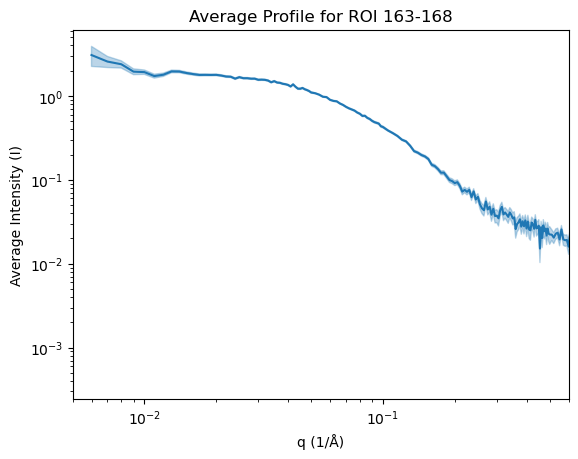

In [539]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q_avg, intensity_avg, label='Intensity (normalized)')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Average Intensity (I)')
plt.fill_between(
    q_avg,
    intensity_avg - error_avg,
    intensity_avg + error_avg,
    alpha=0.3,
    color=line.get_color()
)
plt.xlim(0.005, 0.6)
plt.title(f'Average Profile for ROI {roi_start}-{roi_end}')
plt.show()
 

#### Analyze Average of Single Frame

In [540]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(average_profile, settings=my_settings)

print(f"Guinier fit results for {average_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x3489cda50>
i0: 1.918e+00 ± 1.329e-02
Rg: 2.547e+01 ± 2.879e-01
Guinier fit R²: 0.7928
Guinier range: q = 6.000e-03 to 5.000e-02
Guinier range used Rg: q = 1.528e-01 to 1.273e+00
idx_min: 0, idx_max: 44


In [541]:
# AverageProfile 
q=average_profile.getQ()
intensity = average_profile.getI()
error = average_profile.getErr()

/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/3603877103.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


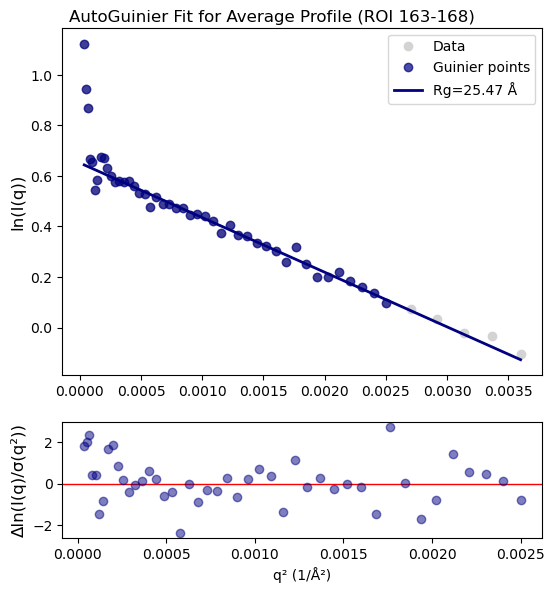

In [542]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Rg={rg:.2f} Å', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    axs[0].legend()

    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()


Fit with idx_min=0, idx_max=44: Rg=2.547e+01 ± 2.879e-01, R²=0.7928
Fit with idx_min=1, idx_max=44: Rg=2.546e+01 ± 2.881e-01, R²=0.8845
Fit with idx_min=2, idx_max=44: Rg=2.543e+01 ± 2.886e-01, R²=0.9345
Fit with idx_min=3, idx_max=44: Rg=2.539e+01 ± 2.896e-01, R²=0.9736
Fit with idx_min=4, idx_max=44: Rg=2.539e+01 ± 2.904e-01, R²=0.9734
Fit with idx_min=5, idx_max=44: Rg=2.537e+01 ± 2.919e-01, R²=0.9727
Fit with idx_min=6, idx_max=44: Rg=2.541e+01 ± 2.929e-01, R²=0.9785
Fit with idx_min=7, idx_max=44: Rg=2.544e+01 ± 2.948e-01, R²=0.9794
Fit with idx_min=8, idx_max=44: Rg=2.537e+01 ± 2.991e-01, R²=0.9818
Fit with idx_min=9, idx_max=44: Rg=2.527e+01 ± 3.045e-01, R²=0.9854
Fit with idx_min=10, idx_max=44: Rg=2.521e+01 ± 3.097e-01, R²=0.9858
Fit with idx_min=11, idx_max=44: Rg=2.519e+01 ± 3.153e-01, R²=0.9850
Fit with idx_min=12, idx_max=44: Rg=2.520e+01 ± 3.213e-01, R²=0.9841
Fit with idx_min=13, idx_max=44: Rg=2.519e+01 ± 3.289e-01, R²=0.9831
Fit with idx_min=14, idx_max=44: Rg=2.516e+0

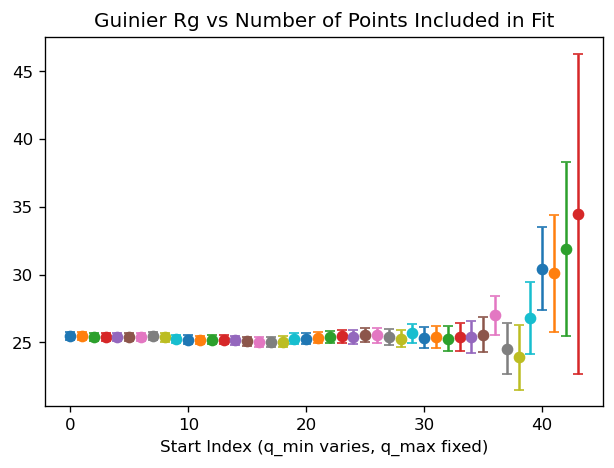

In [543]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [544]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 3
idx_max

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 1.914e+00 ± 1.331e-02
Rg: 2.539e+01 ± 2.896e-01
Guinier fit R²: 0.9736
Guinier range: q = 9.000e-03 to 5.000e-02
Guinier range used Rg: q = 2.286e-01 to 1.270e+00
idx_min: 3, idx_max: 44


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/372981671.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


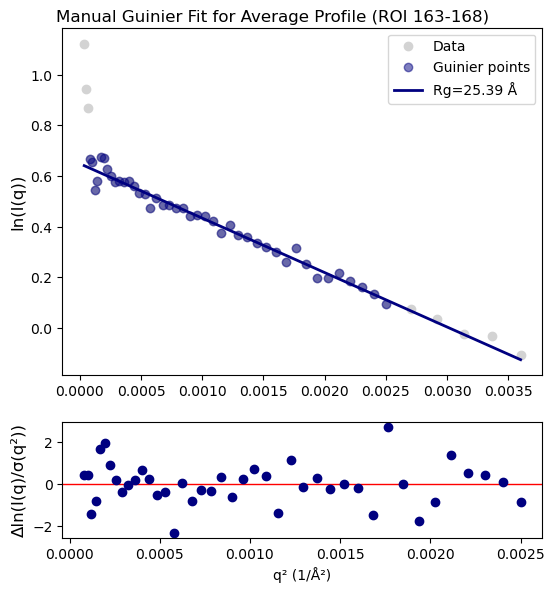

In [545]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.5)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100, label=f'Rg={rg:.2f} Å')
    axs[0].legend()
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
# plt.ylabel('ln(I)')
plt.suptitle(f'Manual Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()

Text(0.5, 1.0, 'Kratky Plot for ROI 163-168')

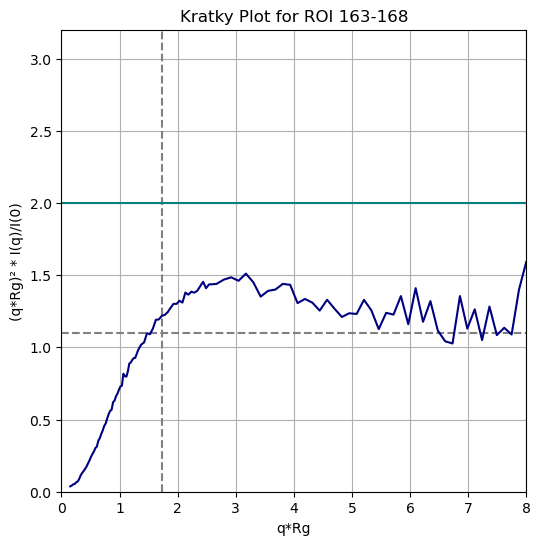

In [546]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')
plt.title(f'Kratky Plot for ROI {roi_start}-{roi_end}')

Auto-determined Dmax: 90.00 Å
GNOM fit results for Dmax=90 Å:
Dmax: 90.00 Å
Rg: 2.698e+01 ± 2.683e-01 Å
i0: 1.941e+00


Text(0, 0.5, 'P(Rg) / I0')

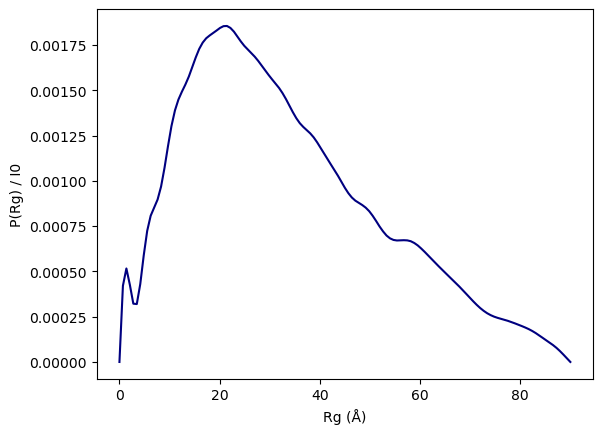

In [547]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(average_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

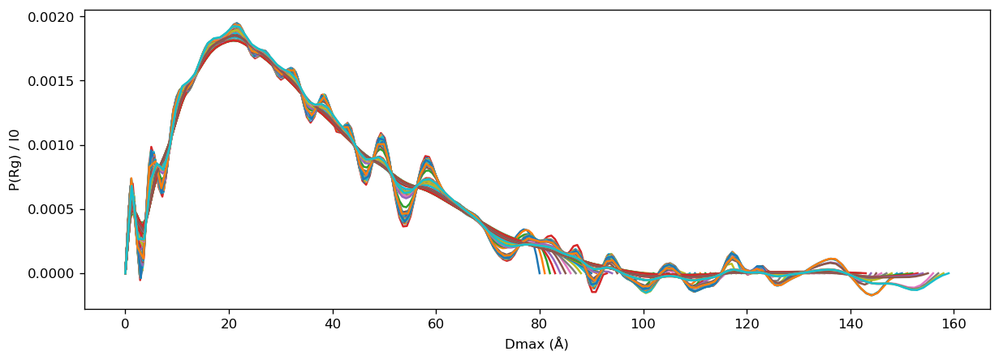

In [548]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

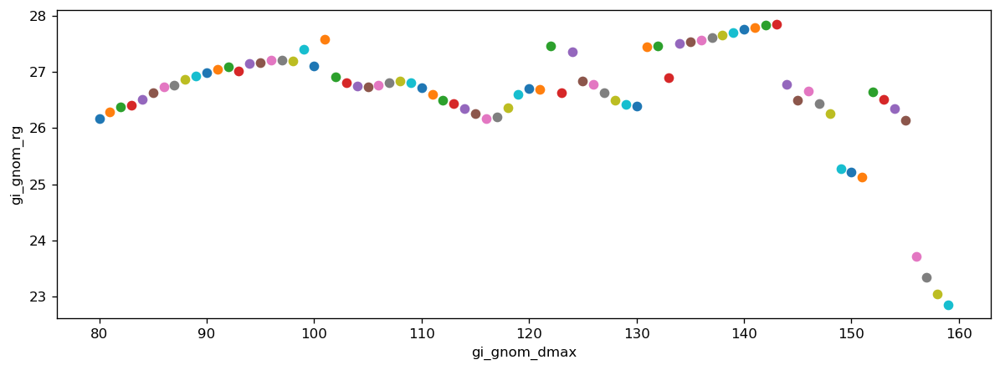

In [549]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=94.0 Å:
Dmax: 94.00 Å
Rg: 2.715e+01 ± 4.059e-01 Å
i0: 1.946e+00


Text(0.5, 1.0, 'GNOM Fit for Dmax=94.0 Å, ROI 163-168')

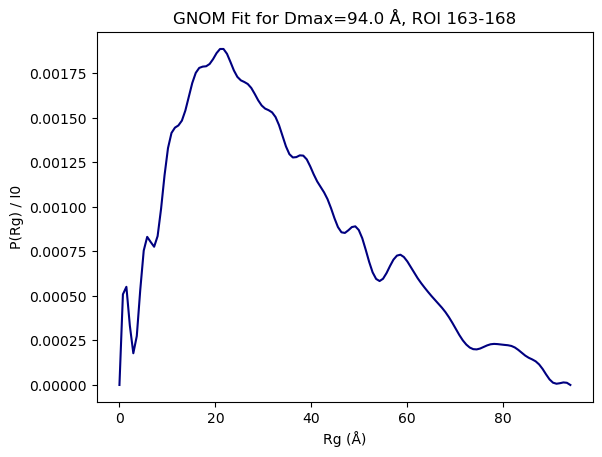

In [552]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 94.0  # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')
plt.title(f'GNOM Fit for Dmax={dmax} Å, ROI {roi_start}-{roi_end}')

#### Calculate Extended Guinier

In [553]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=idx_min
# qmin_offset=2
# qmax_offset=40

In [554]:
eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



26.509558475640308
0.5055001598389935
1.9327882632696967
[0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017 0.018 0.019 0.02
 0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029 0.03  0.031 0.032
 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041 0.042 0.043 0.044
 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/2443930316.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


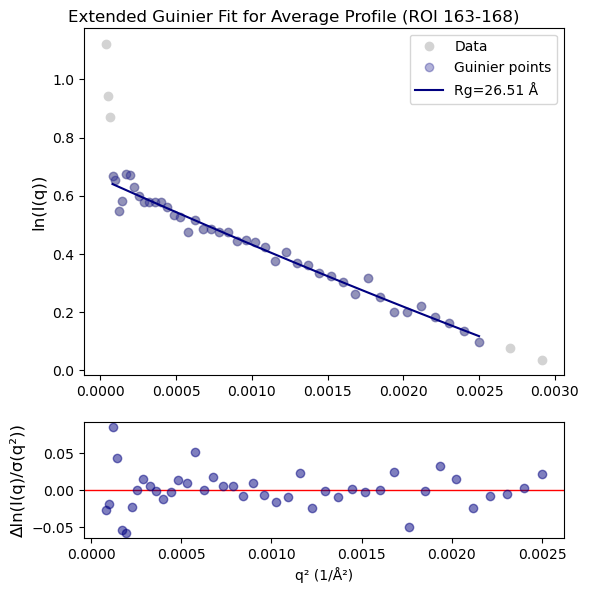

In [555]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label=f'Rg={result["Rg"]:.2f} Å')
axs[0].legend()



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()

# Single Best Frame 180

In [ ]:
FOI = int(165)  # Frame of Interest, zero indexed

profile = profiles_roi = my_series.getSASMList(FOI, FOI)
sub_profiles_roi = my_series.getSASMList(FOI, FOI, 'sub')

FOI_profile = sub_profiles_roi[0]
FOI_profile

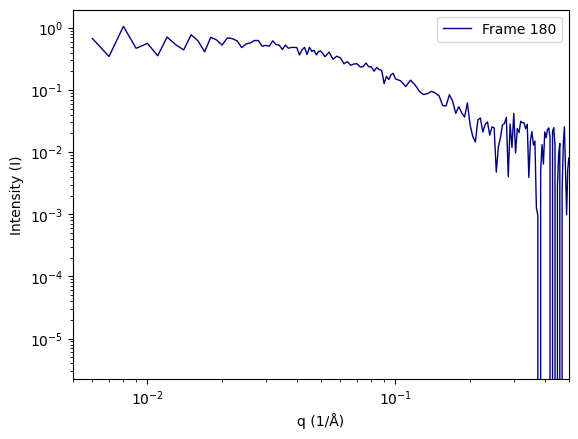

In [ ]:
plt.figure()

q = FOI_profile.getQ()
intensity = FOI_profile.getI()
error = FOI_profile.getErr()


# Plot individual curves
plt.plot(q, intensity, color=colorWT, linewidth=1, label=f'Frame {FOI}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()

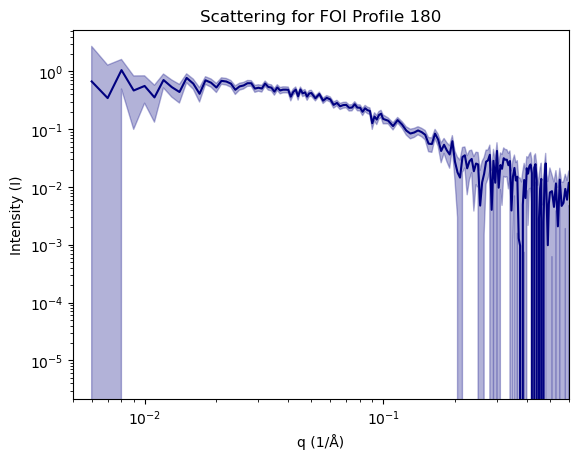

In [ ]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q, intensity, label='Intensity (normalized)', color=colorWT)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.fill_between(
    q,
    intensity - error,
    intensity + error,
    alpha=0.3,
    color=colorWT
)
plt.xlim(0.005, 0.6)
plt.title(f'Scattering for FOI Profile {FOI}')
plt.show()
 

In [ ]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(FOI_profile, settings=my_settings)

print(f"Guinier fit results for {FOI_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x31685d950>
i0: 6.642e-01 ± 3.095e-02
Rg: 2.477e+01 ± 1.681e+00
Guinier fit R²: 0.6893
Guinier range: q = 1.900e-02 to 5.400e-02
Guinier range used Rg: q = 4.707e-01 to 1.338e+00
idx_min: 13, idx_max: 46


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/1064120143.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


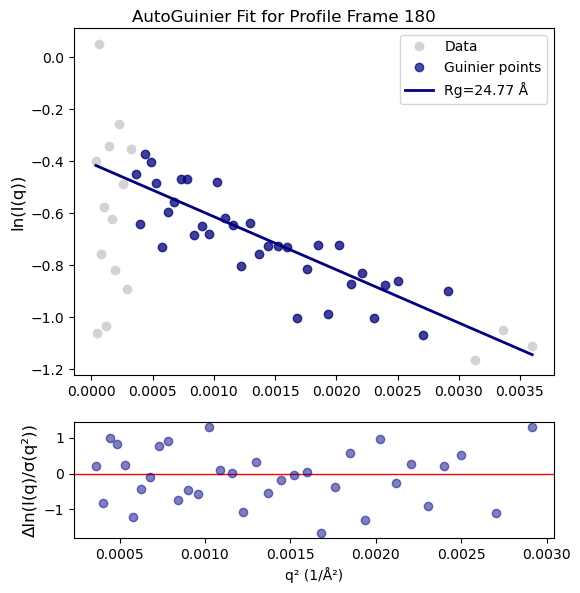

In [ ]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100,label=f'Rg={rg:.2f} Å')
    axs[0].legend()
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Profile Frame {FOI}')
plt.show()


Fit with idx_min=0, idx_max=46: Rg=2.482e+01 ± 1.546e+00, R²=0.2491
Fit with idx_min=1, idx_max=46: Rg=2.482e+01 ± 1.547e+00, R²=0.2259
Fit with idx_min=2, idx_max=46: Rg=2.482e+01 ± 1.546e+00, R²=0.3559
Fit with idx_min=3, idx_max=46: Rg=2.473e+01 ± 1.555e+00, R²=0.2937
Fit with idx_min=4, idx_max=46: Rg=2.476e+01 ± 1.555e+00, R²=0.3530
Fit with idx_min=5, idx_max=46: Rg=2.479e+01 ± 1.557e+00, R²=0.3600
Fit with idx_min=6, idx_max=46: Rg=2.487e+01 ± 1.554e+00, R²=0.5324
Fit with idx_min=7, idx_max=46: Rg=2.481e+01 ± 1.570e+00, R²=0.5045
Fit with idx_min=8, idx_max=46: Rg=2.489e+01 ± 1.572e+00, R²=0.5231
Fit with idx_min=9, idx_max=46: Rg=2.505e+01 ± 1.569e+00, R²=0.6096
Fit with idx_min=10, idx_max=46: Rg=2.472e+01 ± 1.617e+00, R²=0.5885
Fit with idx_min=11, idx_max=46: Rg=2.475e+01 ± 1.636e+00, R²=0.5735
Fit with idx_min=12, idx_max=46: Rg=2.504e+01 ± 1.628e+00, R²=0.7066
Fit with idx_min=13, idx_max=46: Rg=2.477e+01 ± 1.681e+00, R²=0.6893
Fit with idx_min=14, idx_max=46: Rg=2.470e+0

ValueError: 'yerr' must not contain negative values

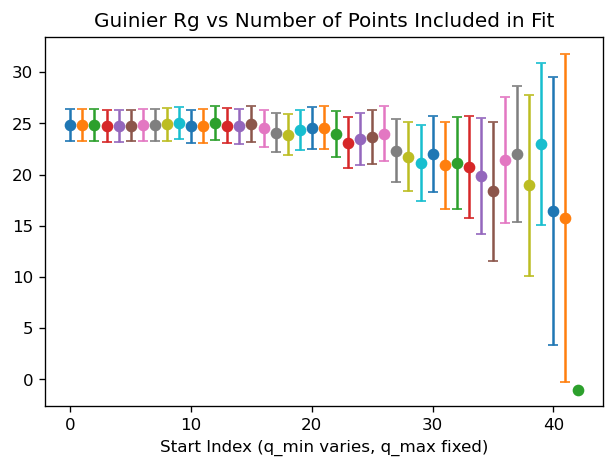

In [ ]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [ ]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 0
idx_max = 45

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 6.798e-01 ± 2.984e-02
Rg: 2.610e+01 ± 1.682e+00
Guinier fit R²: 0.2127
Guinier range: q = 6.000e-03 to 5.200e-02
Guinier range used Rg: q = 1.566e-01 to 1.357e+00
idx_min: 0, idx_max: 45


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/3690464081.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


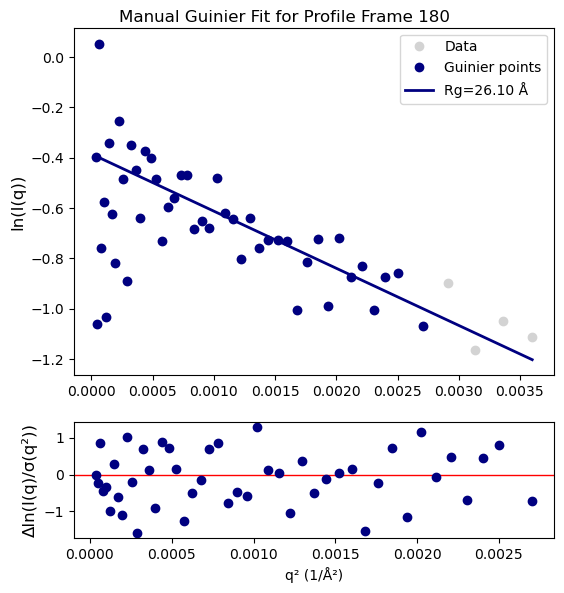

In [ ]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100, label=f'Rg={rg:.2f} Å')
    axs[0].legend()
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Manual Guinier Fit for Profile Frame {FOI}')
# plt.ylabel('ln(I)')
plt.show()

Text(0.5, 1.0, 'Kratky Plot for Profile Frame 180')

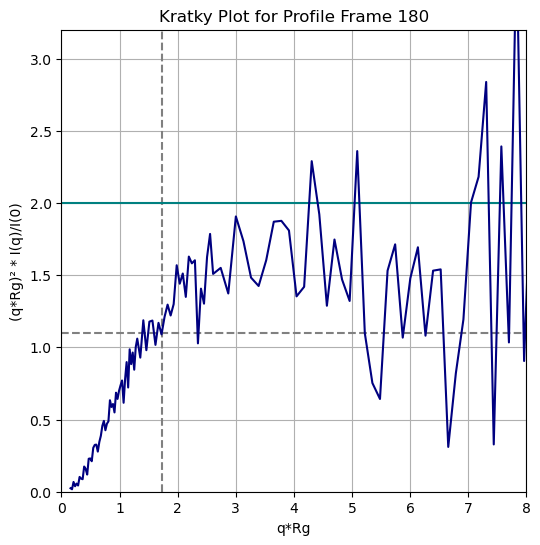

In [ ]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')
plt.title(f'Kratky Plot for Profile Frame {FOI}')

/opt/anaconda3/envs/RAW/lib/python3.14/site-packages/bioxtasraw/BIFT.py:334: RuntimeWarning: invalid value encountered in divide
  sinc_qr = np.where(qr==0, 1, np.sin(qr)/qr)


Auto-determined Dmax: 86.00 Å
GNOM fit results for Dmax=86 Å:
Dmax: 86.00 Å
Rg: 2.685e+01 ± 5.732e-01 Å
i0: 6.472e-01


Text(0, 0.5, 'P(Rg) / I0')

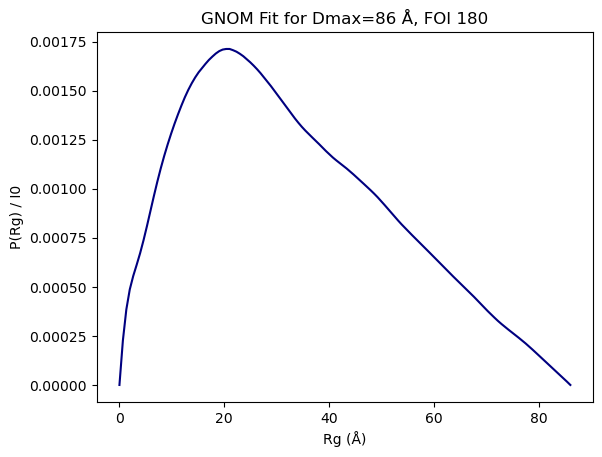

In [ ]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(FOI_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM Fit for Dmax={dmax} Å, FOI {FOI}')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

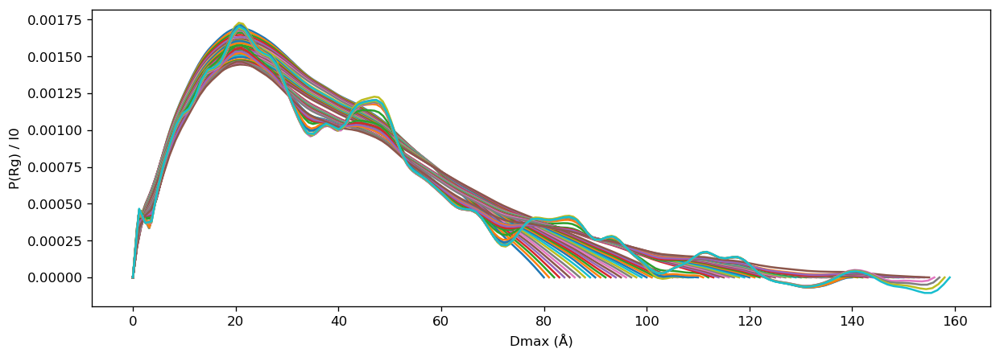

In [ ]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

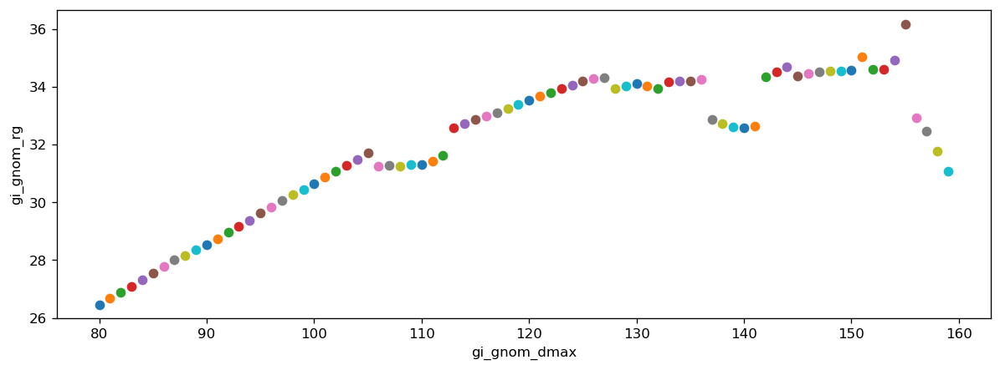

In [ ]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=110 Å:
Dmax: 110.00 Å
Rg: 2.887e+01 ± 1.823e+00 Å
i0: 6.859e-01


Text(0, 0.5, 'P(Rg) / I0')

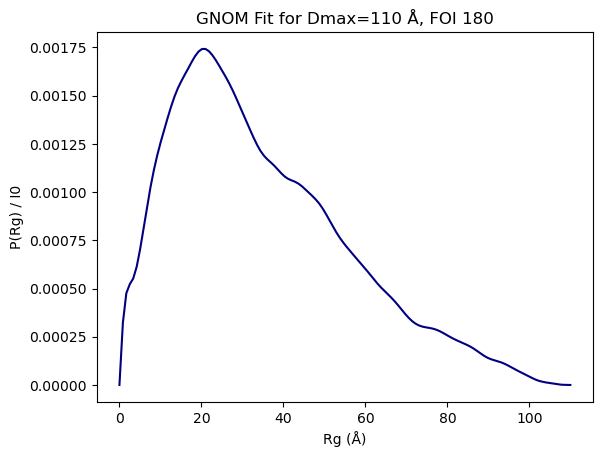

In [ ]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 110 # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM Fit for Dmax={dmax} Å, FOI {FOI}')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

In [ ]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=0
# qmin_offset=2
# qmax_offset=40

In [ ]:
eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



34.50205817077841
0.5707282098789945
0.891722106256378
[0.006 0.007 0.008 0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017
 0.018 0.019 0.02  0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029
 0.03  0.031 0.032 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041
 0.042 0.043 0.044 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/3534837312.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


ValueError: x and y must have same first dimension, but have shapes (45,) and (46,)

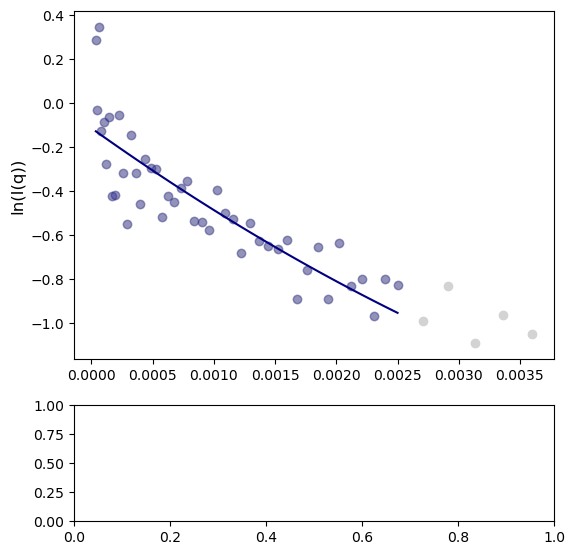

In [ ]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label='Extended Guinier fit')



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for FOI Profile (Frame {FOI})')
plt.show()

In [ ]:
# Define a region of interest (ROI) for analysis, zero indexed
roi_start = int(163)
roi_end = int(168)

#Get profiles from the series in a given range, zero indexed
profiles_roi = my_series.getSASMList(roi_start, roi_end)
sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')


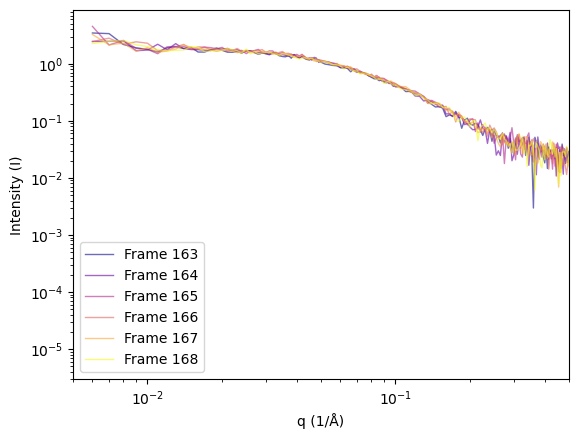

In [ ]:
# Plot Sub-profiles
plt.figure()

n = len(sub_profiles_roi)
cmap = plt.cm.plasma  # yellow → purple

for i in range(len(sub_profiles_roi)):
    profile_n = sub_profiles_roi[i]

    q = profile_n.getQ()
    intensity = profile_n.getI()
    error = profile_n.getErr()

    # Normalize index to [0,1] for colormap
    color = cmap(i / (n - 1))

    # Plot individual curves
    plt.plot(q, intensity, color=color, alpha=0.6, linewidth=1, label=f'Frame {roi_start + i}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()


In [ ]:
average_profile = raw.average(sub_profiles_roi[:])
average_profile

In [ ]:
# AverageProfile 
q_avg=average_profile.getQ()
intensity_avg=average_profile.getI()
error_avg=average_profile.getErr()

Text(0.5, 1.0, 'Average Profile for ROI 163-168')

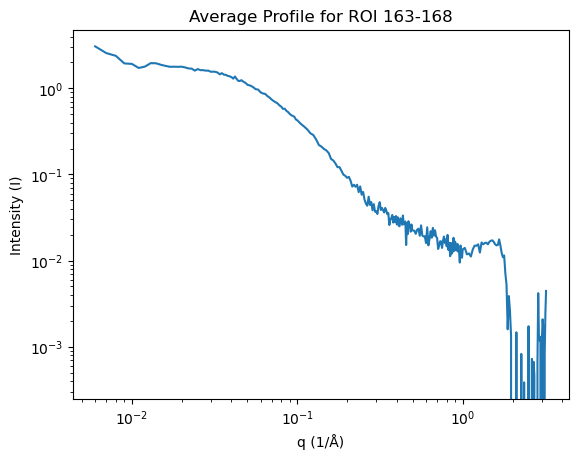

In [ ]:
# Average curve
plt.Figure(figsize=(8,6), dpi=120)
plt.plot(q_avg, intensity_avg, linestyle='-', marker=None)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.title(f'Average Profile for ROI {roi_start}-{roi_end}')


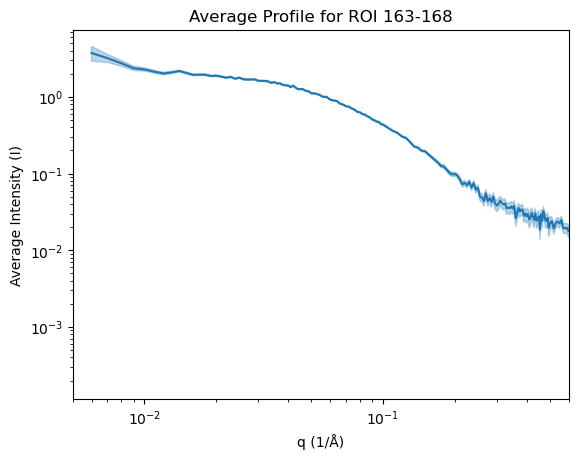

In [ ]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q_avg, intensity_avg, label='Intensity (normalized)')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Average Intensity (I)')
plt.fill_between(
    q_avg,
    intensity_avg - error_avg,
    intensity_avg + error_avg,
    alpha=0.3,
    color=line.get_color()
)
plt.xlim(0.005, 0.6)

plt.title(f'Average Profile for ROI {roi_start}-{roi_end}')
plt.show()
 

#### Analyze Average of Frames

In [ ]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(average_profile, settings=my_settings)

print(f"Guinier fit results for {average_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x12051c450>
i0: 1.918e+00 ± 1.329e-02
Rg: 2.547e+01 ± 2.879e-01
Guinier fit R²: 0.7928
Guinier range: q = 6.000e-03 to 5.000e-02
Guinier range used Rg: q = 1.528e-01 to 1.273e+00
idx_min: 0, idx_max: 44


In [ ]:
# AverageProfile 
q=average_profile.getQ()
intensity = average_profile.getI()
error = average_profile.getErr()

/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/1379622750.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


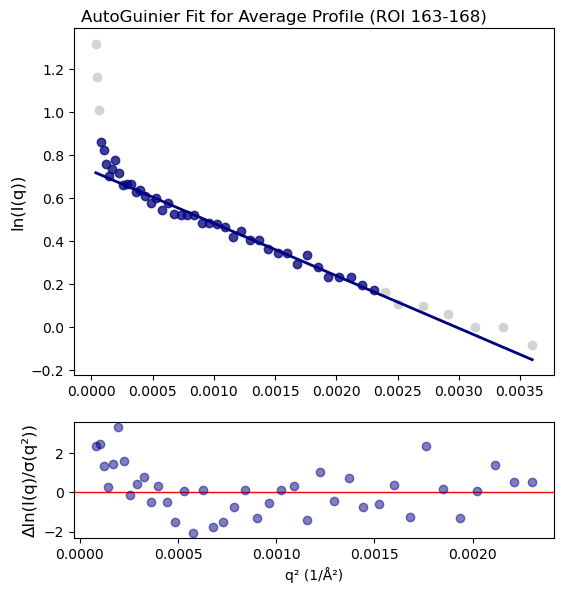

In [ ]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()


Fit with idx_min=0, idx_max=42: Rg=2.719e+01 ± 2.859e-01, R²=0.7238
Fit with idx_min=1, idx_max=42: Rg=2.717e+01 ± 2.863e-01, R²=0.8207
Fit with idx_min=2, idx_max=42: Rg=2.712e+01 ± 2.871e-01, R²=0.9000
Fit with idx_min=3, idx_max=42: Rg=2.705e+01 ± 2.885e-01, R²=0.9481
Fit with idx_min=4, idx_max=42: Rg=2.699e+01 ± 2.902e-01, R²=0.9616
Fit with idx_min=5, idx_max=42: Rg=2.691e+01 ± 2.928e-01, R²=0.9714
Fit with idx_min=6, idx_max=42: Rg=2.686e+01 ± 2.957e-01, R²=0.9729
Fit with idx_min=7, idx_max=42: Rg=2.684e+01 ± 2.986e-01, R²=0.9716
Fit with idx_min=8, idx_max=42: Rg=2.677e+01 ± 3.033e-01, R²=0.9724
Fit with idx_min=9, idx_max=42: Rg=2.656e+01 ± 3.107e-01, R²=0.9828
Fit with idx_min=10, idx_max=42: Rg=2.645e+01 ± 3.176e-01, R²=0.9858
Fit with idx_min=11, idx_max=42: Rg=2.642e+01 ± 3.239e-01, R²=0.9850
Fit with idx_min=12, idx_max=42: Rg=2.635e+01 ± 3.323e-01, R²=0.9847
Fit with idx_min=13, idx_max=42: Rg=2.623e+01 ± 3.428e-01, R²=0.9853
Fit with idx_min=14, idx_max=42: Rg=2.622e+0

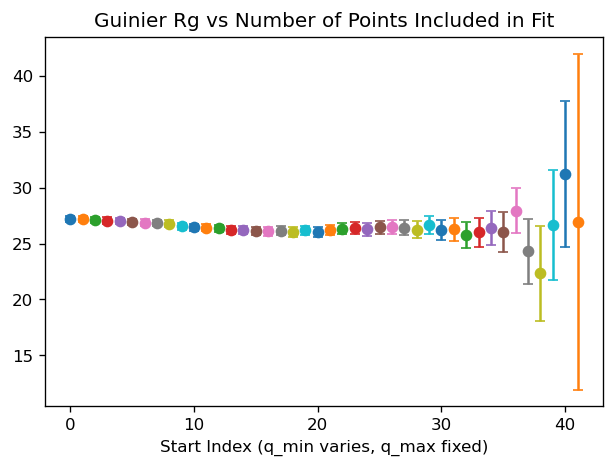

In [ ]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [ ]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 3
idx_max = 42

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(average_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 2.067e+00 ± 1.407e-02
Rg: 2.705e+01 ± 2.885e-01
Guinier fit R²: 0.9481
Guinier range: q = 9.000e-03 to 4.800e-02
Guinier range used Rg: q = 2.435e-01 to 1.299e+00
idx_min: 3, idx_max: 42


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/487275401.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


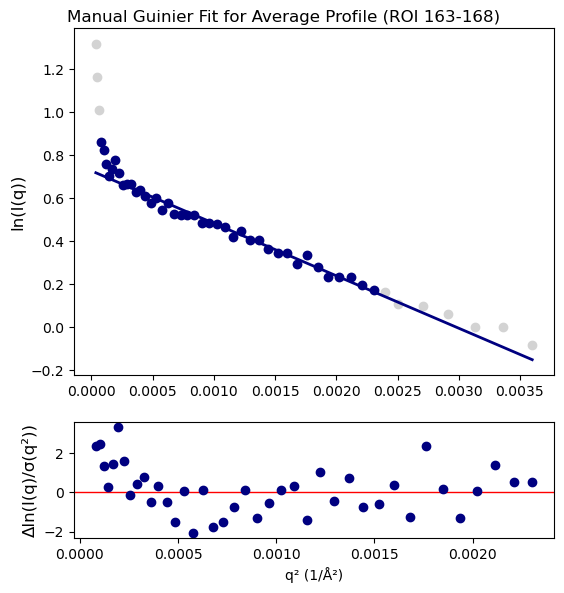

In [ ]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Manual Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
# plt.ylabel('ln(I)')
plt.show()

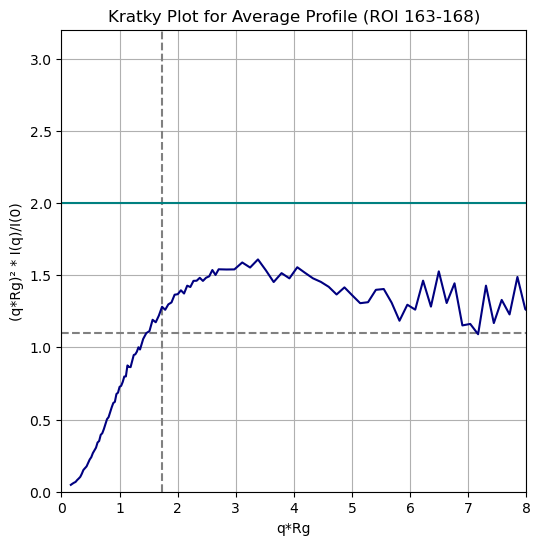

In [ ]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.title(f'Kratky Plot for Average Profile (ROI {roi_start}-{roi_end})')
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')

Auto-determined Dmax: 107.00 Å
GNOM fit results for Dmax=107 Å:
Dmax: 107.00 Å
Rg: 2.884e+01 ± 3.807e-01 Å
i0: 2.095e+00


Text(0, 0.5, 'P(Rg) / I0')

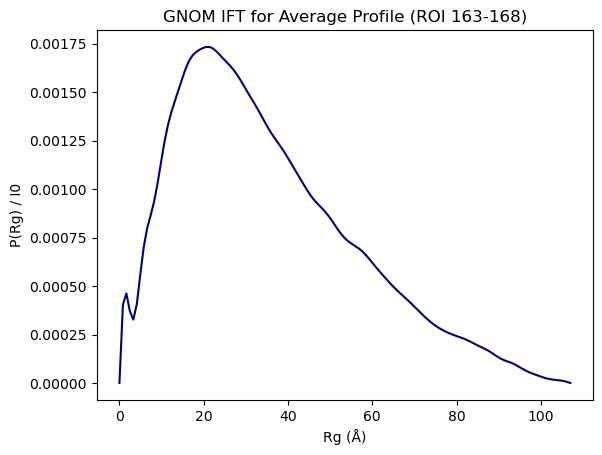

In [ ]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(average_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM IFT for Average Profile (ROI {roi_start}-{roi_end})')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

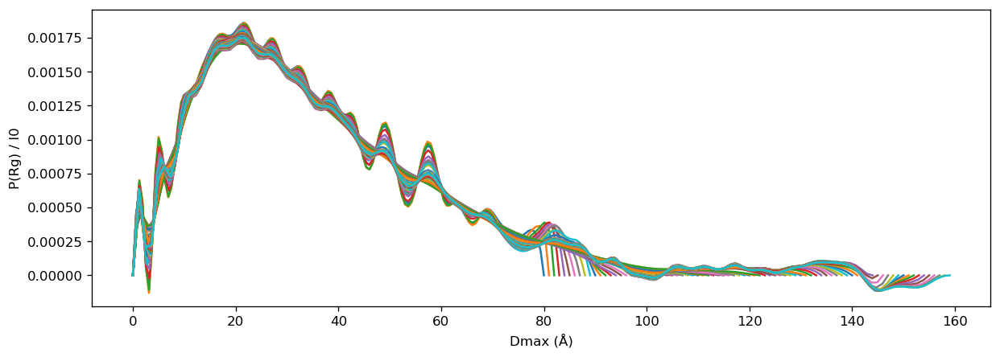

In [ ]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

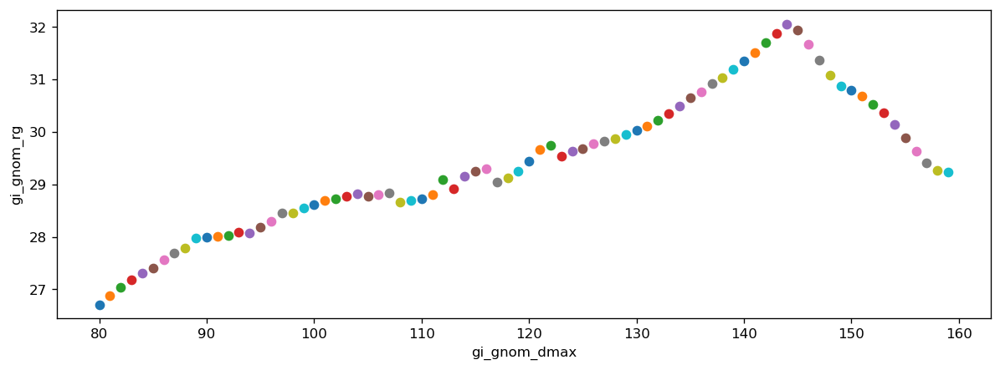

In [ ]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(average_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=110 Å:
Dmax: 110.00 Å
Rg: 2.873e+01 ± 5.864e-01 Å
i0: 2.091e+00


Text(0, 0.5, 'P(Rg) / I0')

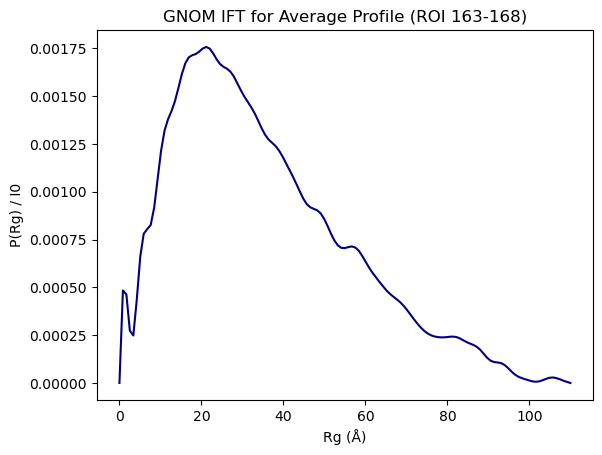

In [ ]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 110  # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(average_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.title(f'GNOM IFT for Average Profile (ROI {roi_start}-{roi_end})')
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

#### Calculate Extended Guinier

In [ ]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=idx_min
# qmin_offset=2
# qmax_offset=40

In [ ]:
eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



29.465570487081404
0.5317435432501041
2.147302985080072
[0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017 0.018 0.019 0.02
 0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029 0.03  0.031 0.032
 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041 0.042 0.043 0.044
 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/121237510.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


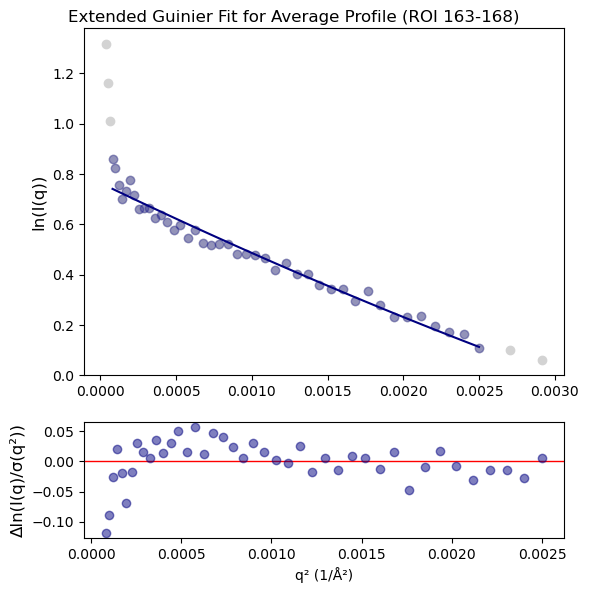

In [ ]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label='Extended Guinier fit')



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for Average Profile (ROI {roi_start}-{roi_end})')
plt.show()

In [ ]:
FOI = int(163)  # Frame of Interest, zero indexed

profile = profiles_roi = my_series.getSASMList(FOI, FOI)
sub_profiles_roi = my_series.getSASMList(FOI, FOI, 'sub')

FOI_profile = sub_profiles_roi[0]
FOI_profile

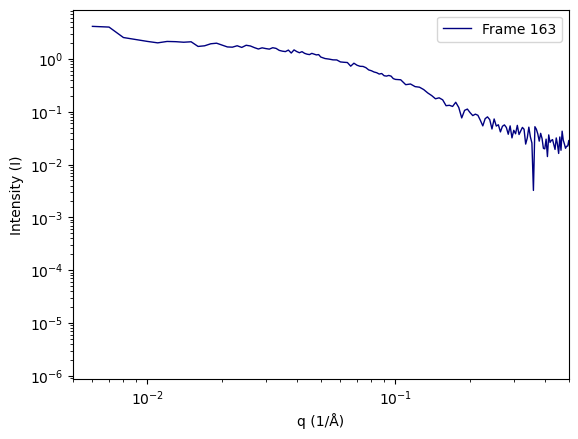

In [ ]:
plt.figure()

q = FOI_profile.getQ()
intensity = FOI_profile.getI()
error = FOI_profile.getErr()


# Plot individual curves
plt.plot(q, intensity, color=colorWT, linewidth=1, label=f'Frame {FOI}')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.xlim(0.005, 0.5)
plt.legend()

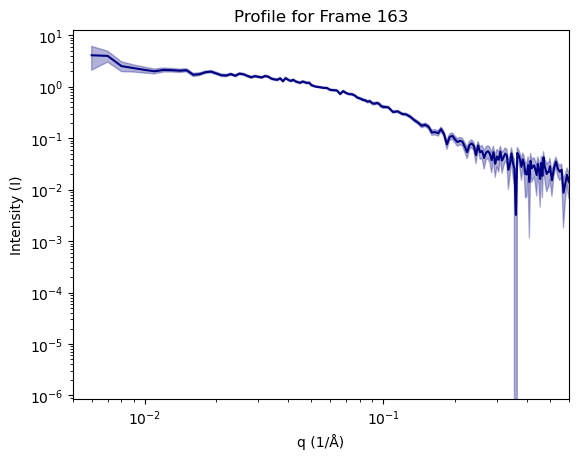

In [ ]:
# Plot the average q and intensity data as Log-Log
line, = plt.plot(q, intensity, label='Intensity (normalized)', color=colorWT)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('q (1/Å)')
plt.ylabel('Intensity (I)')
plt.fill_between(
    q,
    intensity - error,
    intensity + error,
    alpha=0.3,
    color=colorWT
)
plt.xlim(0.005, 0.6)
plt.title(f'Profile for Frame {FOI}')
plt.show()
 

In [ ]:
#Automatically calculate the Guinier range and fit
(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, idx_min, idx_max,
    r_sq) = raw.auto_guinier(FOI_profile, settings=my_settings)

print(f"Guinier fit results for {FOI_profile}")
print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

Guinier fit results for <bioxtasraw.SASM.SASM object at 0x34f6bc350>
i0: 1.987e+00 ± 3.286e-02
Rg: 2.635e+01 ± 6.895e-01
Guinier fit R²: 0.8600
Guinier range: q = 8.000e-03 to 4.900e-02
Guinier range used Rg: q = 2.108e-01 to 1.291e+00
idx_min: 2, idx_max: 43


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/339742023.py:10: RuntimeWarning: invalid value encountered in log
  i_ln = np.log(intensity)


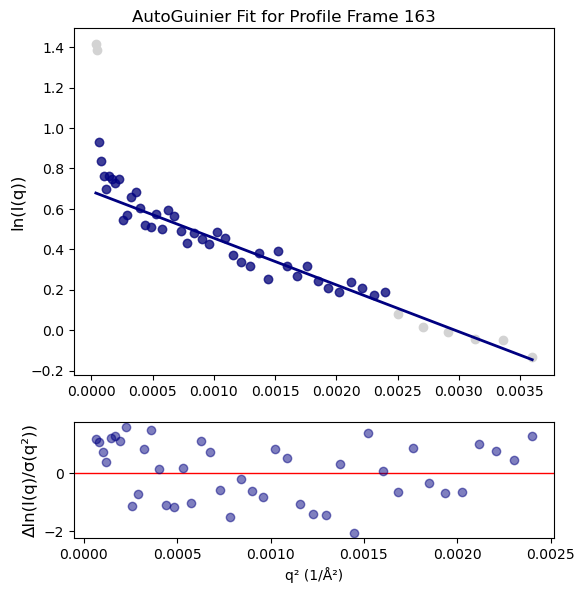

In [ ]:
# Plot the q and intensity data from first sub-profile as Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)

# Plot Some points of the data for context
q_sq = q**2
i_ln = np.log(intensity)
qmin_sq = qmin**2
qmax_sq = qmax**2
axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the AutoGuinier fit data points
mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.7)

# Line for the Guinier fit
# optional: fit a straight line to the selected Guinier points
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)
    
    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT, alpha=0.5)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)

# Plot Specifications
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'AutoGuinier Fit for Profile Frame {FOI}')
plt.show()


Fit with idx_min=0, idx_max=43: Rg=2.649e+01 ± 6.843e-01, R²=0.6117
Fit with idx_min=1, idx_max=43: Rg=2.646e+01 ± 6.853e-01, R²=0.7019
Fit with idx_min=2, idx_max=43: Rg=2.635e+01 ± 6.895e-01, R²=0.8600
Fit with idx_min=3, idx_max=43: Rg=2.629e+01 ± 6.923e-01, R²=0.8858
Fit with idx_min=4, idx_max=43: Rg=2.623e+01 ± 6.965e-01, R²=0.8957
Fit with idx_min=5, idx_max=43: Rg=2.617e+01 ± 7.016e-01, R²=0.8955
Fit with idx_min=6, idx_max=43: Rg=2.614e+01 ± 7.079e-01, R²=0.8912
Fit with idx_min=7, idx_max=43: Rg=2.600e+01 ± 7.195e-01, R²=0.8919
Fit with idx_min=8, idx_max=43: Rg=2.583e+01 ± 7.343e-01, R²=0.8929
Fit with idx_min=9, idx_max=43: Rg=2.567e+01 ± 7.502e-01, R²=0.8924
Fit with idx_min=10, idx_max=43: Rg=2.540e+01 ± 7.718e-01, R²=0.8997
Fit with idx_min=11, idx_max=43: Rg=2.551e+01 ± 7.803e-01, R²=0.9029
Fit with idx_min=12, idx_max=43: Rg=2.559e+01 ± 7.936e-01, R²=0.9004
Fit with idx_min=13, idx_max=43: Rg=2.537e+01 ± 8.226e-01, R²=0.8962
Fit with idx_min=14, idx_max=43: Rg=2.497e+0

ValueError: 'yerr' must not contain negative values

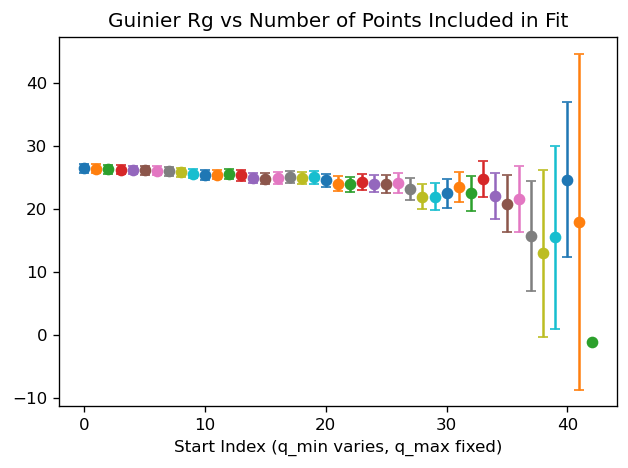

In [ ]:
# Iteratively calculate the Guinier range for the average profile, excluding one point at a time from the high-q end, to see how Rg changes

n_points = idx_max # start with a few points beyond the initial idx_max to see the trend
plt.figure(figsize=(6,4), dpi=120)
plt.title('Guinier Rg vs Number of Points Included in Fit')
plt.xlabel('Start Index (q_min varies, q_max fixed)')

for i in range(n_points):
    # Calculate the Guinier range and fit using specified index range

    idx_min = i
    idx_max = n_points
    try:
        (rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
            r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)
        print(f"Fit with idx_min={idx_min}, idx_max={idx_max}: Rg={rg:.3e} ± {rg_err:.3e}, R²={r_sq:.4f}")
    except Exception as e:
        print(f"Error fitting Guinier profile at iteration {i}: {e}")
        continue

    plt.errorbar(idx_min, rg, yerr=rg_err, fmt='o')


In [ ]:
# Manual Guinier fit using a specified index range, for example idx_min=1, idx_max=45
# Calculate the Guinier range and fit using specified index range

idx_min = 2
idx_max = 45

(rg, i0, rg_err, i0_err, qmin, qmax, qrg_min, qrg_max, 
    r_sq) = raw.guinier_fit(FOI_profile, idx_min,idx_max)

print(f"i0: {i0:.3e} ± {i0_err:.3e}")
print(f"Rg: {rg:.3e} ± {rg_err:.3e}")
print(f"Guinier fit R²: {r_sq:.4f}")
print(f"Guinier range: q = {qmin:.3e} to {qmax:.3e}")
print(f"Guinier range used Rg: q = {qrg_min:.3e} to {qrg_max:.3e}")
print(f"idx_min: {idx_min}, idx_max: {idx_max}")

i0: 2.000e+00 ± 3.117e-02
Rg: 2.675e+01 ± 5.850e-01
Guinier fit R²: 0.8885
Guinier range: q = 8.000e-03 to 5.200e-02
Guinier range used Rg: q = 2.140e-01 to 1.391e+00
idx_min: 2, idx_max: 45


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/790654339.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


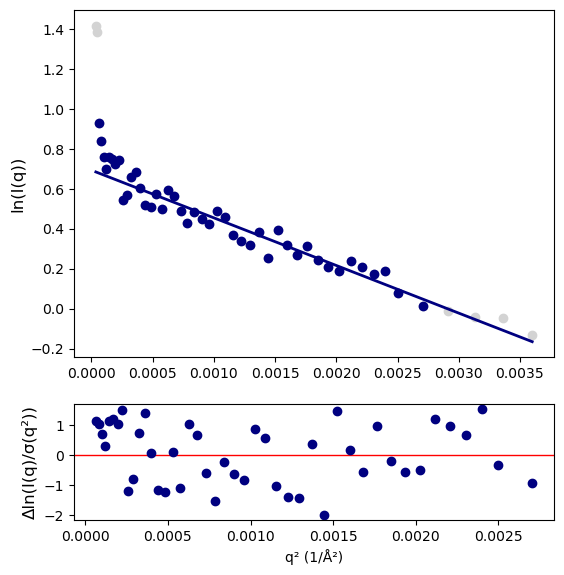

In [ ]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Plot points [0:50] of the data for context
q_sq = q ** 2
I_ln = np.log(intensity)

axs[0].plot(q_sq[0:50], i_ln[0:50], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)

# Plot the ManualGuinier fit data points
qmin_sq = qmin**2
qmax_sq = qmax**2

mask = (q_sq >= qmin_sq) & (q_sq <= qmax_sq)
axs[0].plot(q_sq[mask], i_ln[mask], marker='o', linestyle='None',
            label='Guinier points', color=colorWT)


# Line for the Manual Guinier fit
if np.count_nonzero(mask) >= 2:
   #Get fit r squared:
    x = np.square(q[idx_min:idx_max+1])
    y = np.log(intensity[idx_min:idx_max+1])
    sigma = error[idx_min:idx_max+1] / intensity[idx_min:idx_max+1]  # propagate error to ln(I)
    
    a, b, cov_a, cov_b = SASCalc.weighted_lin_reg(x, y, sigma)

    y_fit = SASCalc.linear_func(x, a, b)
    y_line= SASCalc.linear_func(q_sq[0:50], a, b)

    gui_err = y - y_fit
    residuals = gui_err / sigma  # weighted residuals
    
    # Plot line of best fit
    axs[0].plot(q_sq[0:50], y_line, '-', label=f'Guinier fit: slope={a:.3e}', 
             color=colorWT, alpha=1, linewidth=2.0, zorder=100)
    
    # Plot residuals in second subplot
    axs[1].plot(x, residuals, marker='o', linestyle='None', color=colorWT)
    
    # Set up labels for residuals subplot
    axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
    axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
    axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
# plt.ylabel('ln(I)')
plt.show()

Text(0.5, 1.0, 'Kratky Plot for Profile Frame 163')

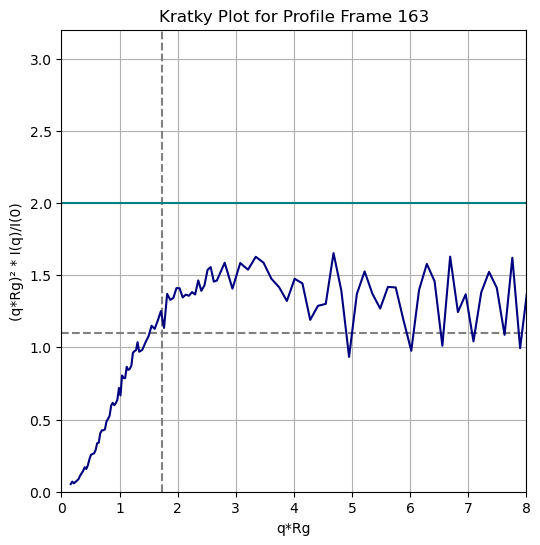

In [ ]:
# Kratky Analysis

# Calculate Kratky parameters
xkrat = q * rg 
ykrat = (xkrat ** 2 * intensity) / i0  # (q*rg)^2 * intensity / i0

# Set up plot
plt.figure(figsize=(6,6))        
plt.xlabel('q*Rg')
plt.ylabel('(q*Rg)² * I(q)/I(0)')

plt.axvline(x=1.73, color='grey', linestyle='--')
plt.axhline(y=1.1, color='grey', linestyle='--', label='1.1')
plt.axhline(y=2, color='teal', linestyle='-') 
plt.grid(True)
plt.xlim(0, 8)
plt.ylim(0, 3.2) 

# Plot Kratky curve
plt.plot(xkrat, ykrat, linestyle='-', color=colorWT, label='Kratky plot')
plt.title(f'Kratky Plot for Profile Frame {FOI}')

Auto-determined Dmax: 105.00 Å
GNOM fit results for Dmax=105 Å:
Dmax: 105.00 Å
Rg: 2.894e+01 ± 7.205e-01 Å
i0: 2.028e+00


Text(0, 0.5, 'P(Rg) / I0')

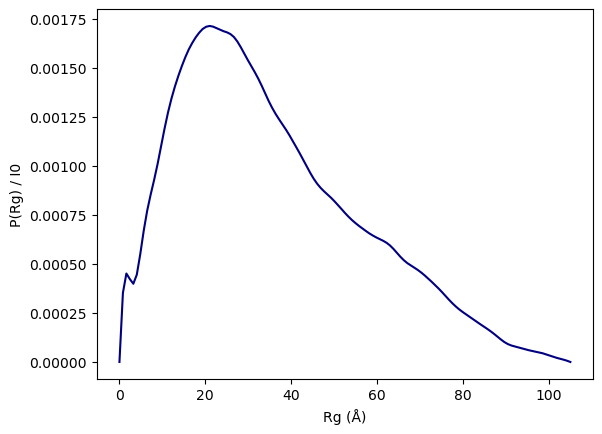

In [ ]:
#Use the auto_dmax function to find the best Dmax and then calculate the IFT using GNOM
dmax = raw.auto_dmax(FOI_profile)
print(f"Auto-determined Dmax: {dmax:.2f} Å")

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")

iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

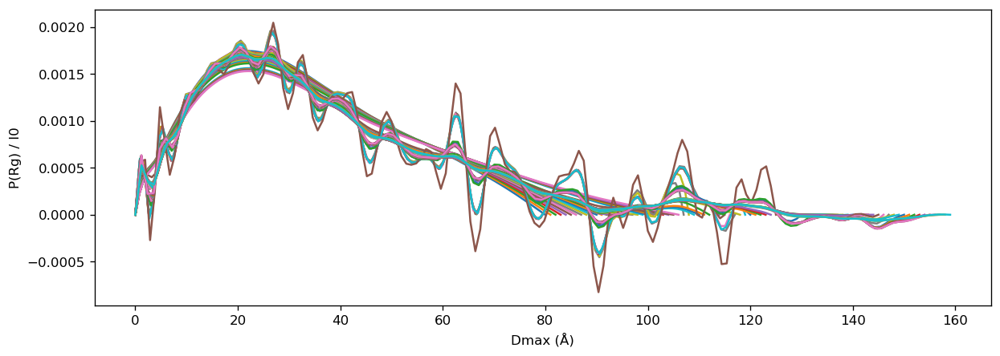

In [ ]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('Dmax (Å)')
plt.ylabel('P(Rg) / I0')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        iftm = gi_gnom_ift
        i0 = float(iftm.getParameter('i0'))

        plt.plot(iftm.r, iftm.p/i0, label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

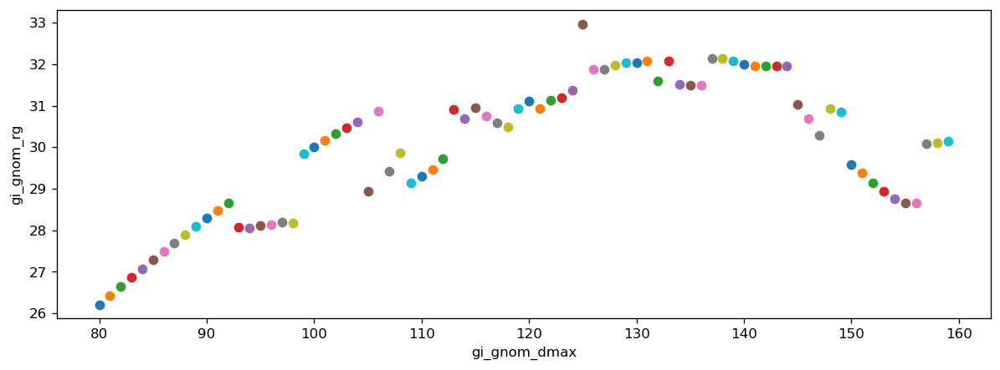

In [ ]:
dmax_values = np.arange(80, 160, 1)

plt.figure(figsize=(12,4), dpi=120)
plt.xlabel('gi_gnom_dmax')
plt.ylabel('gi_gnom_rg')

for dmax in dmax_values:
    try:
        (gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
            gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
            gi_gnom_quality) = raw.gnom(FOI_profile, dmax)
        # print(f"Dmax: {gi_gnom_dmax:.2f} Å, Rg: {gi_gnom_rg:.2f} Å ± {gi_gnom_rg_err:.2f} Å")
        
        plt.plot(gi_gnom_dmax, gi_gnom_rg,'o', label = f'Dmax={dmax} Å')

    except Exception as e:
        print(f"Error fitting GNOM with Dmax={dmax} Å: {e}")

# plt.legend()

GNOM fit results for Dmax=110 Å:
Dmax: 110.00 Å
Rg: 2.930e+01 ± 1.101e+00 Å
i0: 2.037e+00


Text(0, 0.5, 'P(Rg) / I0')

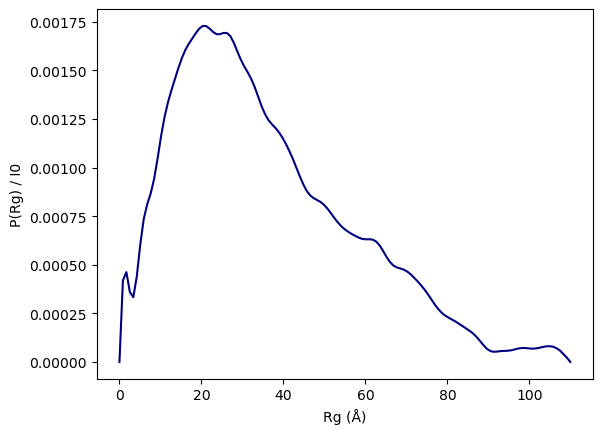

In [ ]:
# Use known Dmax to calculate the IFT using GNOM

dmax = 110 # example Dmax value in Å

(gi_gnom_ift, gi_gnom_dmax, gi_gnom_rg, gi_gnom_i0, gi_gnom_rg_err,
    gi_gnom_i0_err, gi_gnom_total_est, gi_gnom_chi_sq, gi_gnom_alpha,
    gi_gnom_quality) = raw.gnom(FOI_profile, dmax)

print(f"GNOM fit results for Dmax={dmax} Å:")
print(f"Dmax: {gi_gnom_dmax:.2f} Å")
print(f"Rg: {gi_gnom_rg:.3e} ± {gi_gnom_rg_err:.3e} Å")


iftm = gi_gnom_ift

i0 = float(iftm.getParameter('i0'))
print(f"i0: {i0:.3e}")

# Set Plot Specifications
plt.plot(iftm.r, iftm.p/i0, color=colorWT)
plt.xlabel('Rg (Å)')
plt.ylabel('P(Rg) / I0')

In [ ]:
Nres=121
b_Angstrom=5.5
nu_init=0.5
Rg_input=31
q_start_index=0
# qmin_offset=2
# qmax_offset=40

In [ ]:
q = FOI_profile.getQ()
intensity = FOI_profile.getI()
error = FOI_profile.getErr()

eg = ExtendedGuinier(q, intensity, error)

result = eg.analyze(Nres=121, q_start_index=q_start_index)

print(result["Rg"])
print(result["nu"])
print(result["I0"])

qrange = result["q"]
log_Iq = result["log_Iq"]
log_Iq_fit = result["log_Iq_fit"]
residuals = result ["residuals"]
I0 = result["I0"]
print(qrange)



33.34346333722343
0.562307709926553
2.3046833650338763
[0.006 0.007 0.008 0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017
 0.018 0.019 0.02  0.021 0.022 0.023 0.024 0.025 0.026 0.027 0.028 0.029
 0.03  0.031 0.032 0.033 0.034 0.035 0.036 0.037 0.038 0.039 0.04  0.041
 0.042 0.043 0.044 0.045 0.046 0.047 0.048 0.049 0.05 ]


/var/folders/pd/1zdq_nrd781b0d2ptzzg9_tr0000gp/T/ipykernel_24244/2049655427.py:11: RuntimeWarning: invalid value encountered in log
  I_ln = np.log(intensity)


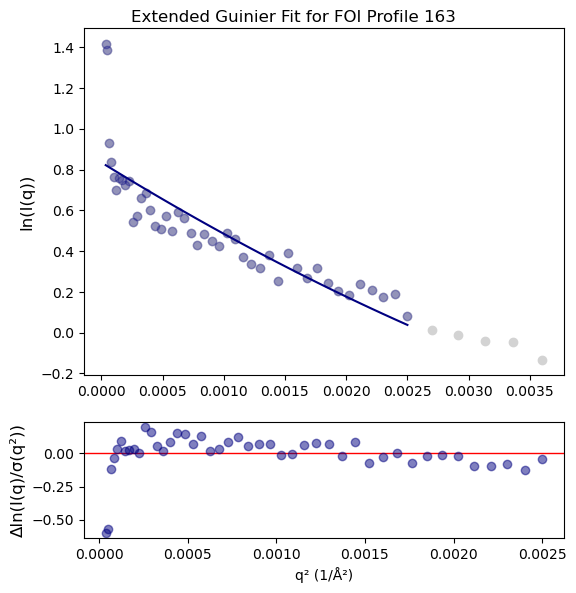

In [ ]:
# Plot the q and intensity data from Manual Guinier plot (ln(I) vs q^2)

# Set up the plot
fig, axs = plt.subplots(2, 1, figsize=(6,6), gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.2)  # Increase vertical space between subplots
fig.subplots_adjust(left=0.15, right=0.95, top=0.95, bottom=0.1)


# Square the q values and take the natural logarithm of the intensity
q_sq = q ** 2
I_ln = np.log(intensity)

# plot the data points for context
max_q = len(qrange)
# mask = (q >= qrange[0]) & (q <= qrange[max_q+10])

start_idx = 0
end_idx = max_q

mask = np.zeros(len(q), dtype=bool)
mask[max(0, start_idx-1):min(len(q), end_idx+5)] = True

axs[0].plot(q_sq[mask], I_ln[mask], marker='o', 
         linestyle='None', color='lightgray', label='Data')
axs[0].set_ylabel('ln(I(q))', fontsize=12)


# Plot the ExtendedGuinier fit data points
axs[0].plot(qrange**2, log_Iq, marker='o', linestyle='None',
            label='Guinier points', color=colorWT, alpha=0.3)
axs[0].plot(qrange**2, log_Iq_fit, linestyle='-', color=colorWT, label='Extended Guinier fit')



# Plot residuals in second subplot
axs[1].plot(qrange**2, residuals, marker='o', 
            linestyle='None', color=colorWT, alpha=0.5)

# Set up labels for residuals subplot
axs[1].axhline(y=0, color='red', linewidth=1, zorder=0)
axs[1].set_ylabel('Δln(I(q)/σ(q²))', fontsize=12)
axs[1].tick_params(axis='both', labelsize=10)
    
plt.xlabel('q² (1/Å²)')
plt.suptitle(f'Extended Guinier Fit for FOI Profile {FOI}')
plt.show()

# IGNORE

In [ ]:
# extended guinier loop

results = []

for profile in sub_profiles_roi:

    eg = ExtendedGuinier(
        profile.getQ(),
        profile.getI(),
        profile.getErr()
    )

    results.append(
        eg.analyze(Nres=121)
    )

### Finding and setting buffer and sample regions
DON't LOAD THIS SECTION



In [ ]:
# #Set buffer range for subtraction
region_start = 50
region_end = 75

#Set the buffer range for the series
buffer_range = [[region_start, region_end]]
print(f"Buffer range set to: {buffer_range}")

(sub_profiles, rg, rger, i0, i0er, vcmw, vcmwer,
    vpmw) = raw.set_buffer_range(my_series, buffer_range)

Buffer range set to: [[50, 75]]


In [ ]:
frames = my_series.getFrames()
total_i = my_series.getIntI()
mean_i = my_series.getMeanI()

subtracted_total_i = my_series.getIntI('sub')
subtracted_mean_i = my_series.getMeanI('sub')


frames.shape: (450,)
total_i.shape: (450,)


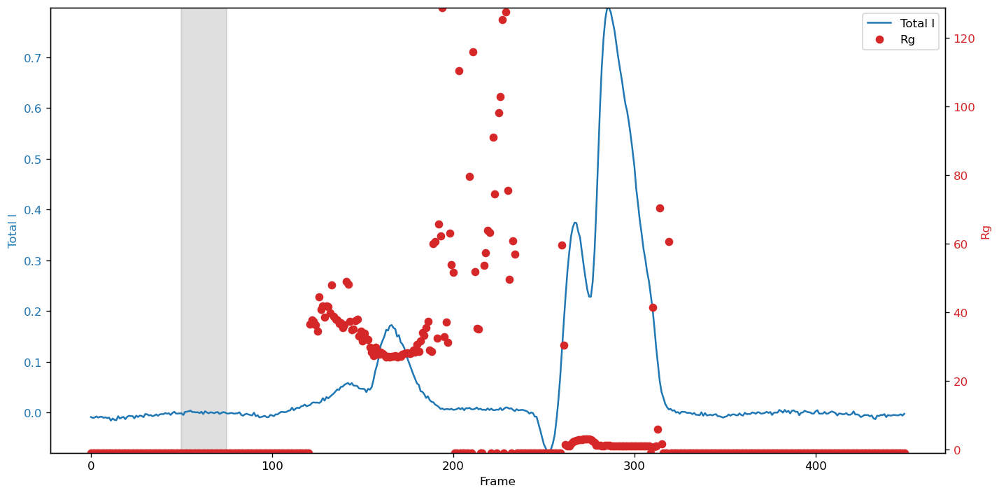

In [ ]:
# Plot subtracted_total_i and rg on the same figure with two y-axes, highlighting the buffer region
fig, ax1 = plt.subplots(figsize=(12, 6), dpi=120)

# find background buffer start and end (use defaults if not)
buffer_region_start = to_int_scalar(region_start, 0)
buffer_region_end   = to_int_scalar(region_end, 0)

# lightly translucent rectangle for buffer region (behind the plotted lines)
ax1.axvspan(buffer_region_start, buffer_region_end, color='gray', alpha=0.25, zorder=0)

# Robustly align x (frames) and y (total_i) lengths before plotting
x = frames
y = subtracted_total_i

print("frames.shape:", getattr(x, 'shape', None))
print("total_i.shape:", getattr(y, 'shape', None))

# If total_i is 2D, collapse q axis to produce one scalar per frame
if hasattr(y, 'ndim') and y.ndim == 2:
    # try obvious mappings
    if y.shape[0] == x.shape[0]:
        per_frame = np.sum(y, axis=1)
        x_plot = x
    elif y.shape[1] == x.shape[0]:
        per_frame = np.sum(y, axis=0)
        x_plot = x
    else:
        # fallback: collapse axis 1 and use integer index for x
        per_frame = np.sum(y, axis=1)
        x_plot = np.arange(len(per_frame))
        print("Warning: frames length does not match total_i; plotting per-frame sum vs index.")
else:
    # y is 1D
    if len(y) == len(x):
        per_frame = y
        x_plot = x
    else:
        # fallback: plot y vs its own index
        per_frame = y
        x_plot = np.arange(len(y))
        print("Warning: frames length does not match total_i; plotting total_i vs index.")

c1 = 'tab:blue'
ax1.plot(x_plot, per_frame, color=c1, label='Total I')
ax1.set_xlabel('Frame' if x_plot is frames else 'Index')
ax1.set_ylabel('Total I', color=c1)
ax1.tick_params(axis='y', labelcolor=c1)
# set y limits safely ignoring NaNs
try:
    ymin, ymax = np.nanmin(per_frame), np.nanmax(per_frame)
    if ymin == ymax:
        ymin -= 0.5; ymax += 0.5
    ax1.set_ylim(ymin, ymax)
except ValueError:
    pass

ax2 = ax1.twinx()
c2 = 'tab:red'

# Align rg to x_plot if possible, otherwise plot rg vs its own index
rg_arr = np.asarray(rg)
if rg_arr.shape[0] == x_plot.shape[0]:
    ax2.plot(x_plot, rg_arr, color=c2, marker='o', linestyle='None', label='Rg')
else:
    ax2.plot(np.arange(len(rg_arr)), rg_arr, color=c2, marker='o', linestyle='None', label='Rg')
    print("Warning: rg length does not match x used for Total I; plotting rg vs its own index.")

ax2.set_ylabel('Rg', color=c2)
ax2.tick_params(axis='y', labelcolor=c2)
try:
    ymin2, ymax2 = np.nanmin(rg_arr), np.nanmax(rg_arr)
    if ymin2 == ymax2:
        ymin2 -= 0.5; ymax2 += 0.5
    ax2.set_ylim(ymin2, ymax2)
except ValueError:
    pass

# combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best')

fig.tight_layout()
plt.show()

In [ ]:
# Define a region of interest (ROI) for analysis, zero indexed
roi_start = int(155)
roi_end = int(180)

#Get profiles from the series in a given range, zero indexed
profiles_roi = my_series.getSASMList(roi_start, roi_end)
sub_profiles_roi = my_series.getSASMList(roi_start, roi_end, 'sub')


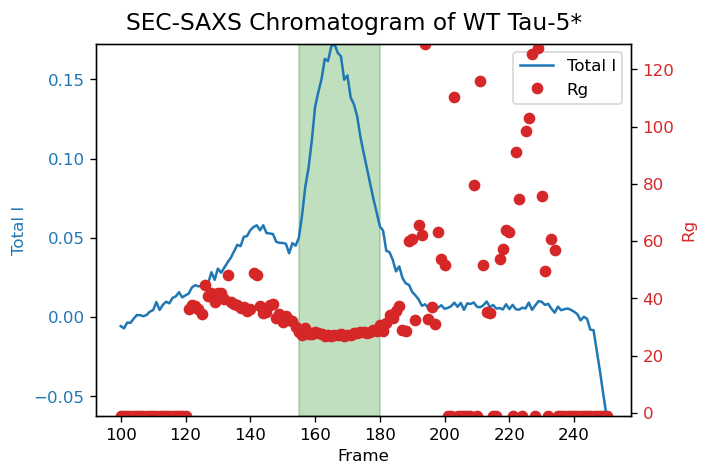

In [ ]:
# Plot Total I and Rg with buffer and ROI highlighted, zoomed into the ROI
fig, ax1 = plt.subplots(figsize=(6, 4), dpi=120)

# lightly translucent rectangle for buffer region (behind the plotted lines)
# ax1.axvspan(buffer_region_start, buffer_region_end, color='gray', alpha=0.25, zorder=0)

# lightly translucent rectangle for ROI (behind the plotted lines)
ax1.axvspan(roi_start, roi_end, color='green', alpha=0.25, zorder=0)

# Zoom into the ROI
start_frame = start_frame
end_frame = end_frame

# boolean mask to slice arrays
mask = (frames >= start_frame) & (frames <= end_frame)

c1 = 'tab:blue'
ax1.plot(frames[mask], subtracted_total_i[mask], color=c1, label='Total I')
ax1.set_xlabel('Frame')
ax1.set_ylabel('Total I', color=c1)
ax1.tick_params(axis='y', labelcolor=c1)
# set y limits safely ignoring NaNs
try:
    ymin, ymax = np.nanmin(subtracted_total_i[mask]), np.nanmax(subtracted_total_i[mask])
    if ymin == ymax:
        ymin -= 0.5; ymax += 0.5
    ax1.set_ylim(ymin, ymax)
except ValueError:
    pass

ax2 = ax1.twinx()
c2 = 'tab:red'
ax2.plot(frames[mask], rg[mask], color=c2, marker='o', linestyle='None', label='Rg')
ax2.set_ylabel('Rg', color=c2)
ax2.tick_params(axis='y', labelcolor=c2)
try:
    ymin2, ymax2 = np.nanmin(rg[mask]), np.nanmax(rg[mask])
    if ymin2 == ymax2:
        ymin2 -= 0.5; ymax2 += 0.5
    ax2.set_ylim(ymin2, ymax2)
except ValueError:
    pass

# combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best')

fig.tight_layout(rect=[0, 0, 1, 0.95])            # leave top 8% for title
fig.suptitle(f"SEC-SAXS Chromatogram of WT Tau-5*", fontsize=14)
plt.show()